In [19]:
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xgboost as xgb
from xgboost import XGBClassifier, XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from tqdm import tqdm
import seaborn as sn
import umap
from sklearn.decomposition import PCA
from sklearn import datasets
from sklearn.decomposition import PCA
import umap
import matplotlib.pyplot as plt
import shap
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from anndata import AnnData
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import pandas as pd
import scanpy as sc
import scipy.stats as stats
import scipy

In [20]:
import sys
sys.path

['/Users/lim/Dropbox (GaTech)/SHAP',
 '/Users/lim/opt/anaconda3/envs/bruce/lib/python38.zip',
 '/Users/lim/opt/anaconda3/envs/bruce/lib/python3.8',
 '/Users/lim/opt/anaconda3/envs/bruce/lib/python3.8/lib-dynload',
 '',
 '/Users/lim/opt/anaconda3/envs/bruce/lib/python3.8/site-packages',
 '/Users/lim/opt/anaconda3/envs/bruce/lib/python3.8/site-packages/IPython/extensions',
 '/Users/lim/.ipython']

In [21]:
import glob
files = glob.glob('SPADE/files_Bendall_et_al/*.txt')

In [22]:
COLS = []
for file in files:
    d = pd.read_csv(files[0],sep="\t", header=0)
    COLS.append(list(d.columns))

In [23]:
set.intersection(*[set(list) for list in COLS])

{'103-Viability',
 '110-CD3',
 '110_114-CD3',
 '111-CD3',
 '112-CD3',
 '114-CD3',
 '115-CD45',
 '139-CD45RA',
 '141-pPLCgamma2',
 '142-CD19',
 '144-CD11b',
 '145-CD4',
 '146-CD8',
 '147-CD20',
 '148-CD34',
 '150-pSTAT5',
 '151-pERK1/2',
 '152-Ki67',
 '153-pMAPKAPK2',
 '154-pSHP2',
 '156-pZAP70/Syk',
 '158-CD33',
 '159-pSTAT3',
 '160-CD123',
 '164-pSLP-76',
 '165-pNFkB',
 '166-IkBalpha',
 '167-CD38',
 '168-pH3',
 '169-pP38',
 '170-CD90',
 '171-pBtk/Itk',
 '172-pS6',
 '174-pSrcFK',
 '175-pCrkL',
 '176-pCREB',
 '191-DNA',
 '193-DNA',
 'Ag-Experienced Mature B',
 'CMP',
 'Cell Length',
 'Early monocyte',
 'Erythrocyte',
 'EventNum',
 'HSC',
 'Immature B',
 'MPP',
 'Mature CD4+ T',
 'Mature CD8+ T',
 'Megakaryocyte',
 'Monocyte',
 'Myeloblast',
 'Myelocyte',
 'NK',
 'NKT',
 'Na?ve CD4+ T',
 'Na?ve CD8+ T',
 'Na?ve Mature B',
 'Platelet',
 'Pre-B I',
 'Pre-B II',
 'Pro-B',
 'Pro-T',
 'Pro-monocyte',
 'Pro-myelocyte',
 'Time',
 'cell_type_index',
 'node_index',
 'pDC'}

## GMCSF 

SPADE/files_Bendall_et_al/CyTOF54_Tube01_Day1_Unstim1_curated.fcs_eventnum_Ungated_Jnstim1_Day1_normalized_1_Unstim1_Singlets.fcs.txt
(49790, 69) (42452, 69)
(49790, 37) (42452, 37)
(92242, 37) (92242, 2)
(49790, 37) (42452, 37) 49790 42452 (49790, 2) (42452, 2)


Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
100%|██████████| 26/26 [02:40<00:00,  6.18s/it]:00]        


            cell 0          cell 0 - score          cell 1  \
0         169-pP38     0.05677116413920144      150-pSTAT5   
1         142-CD19     0.05612808515418399        115-CD45   
2         115-CD45     0.03655474270586068        158-CD33   
3         147-CD20     0.03337595761719725         145-CD4   
4          145-CD4    0.032424252216646354     110_114-CD3   
5      110_114-CD3    0.023676774007836854        169-pP38   
6     171-pBtk/Itk    0.012653132592720412        152-Ki67   
7       139-CD45RA    0.011639651505908344      174-pSrcFK   
8       150-pSTAT5     0.00930519529113899        148-CD34   
9          193-DNA    0.003979229419561971       160-CD123   
10        158-CD33   0.0032721606564319328    171-pBtk/Itk   
11        152-Ki67    0.003254566169053702        167-CD38   
12    166-IkBalpha   0.0032266702271390446    166-IkBalpha   
13       160-CD123   0.0030651009162352416         114-CD3   
14   153-pMAPKAPK2    0.003042714512928207        142-CD19   
15      

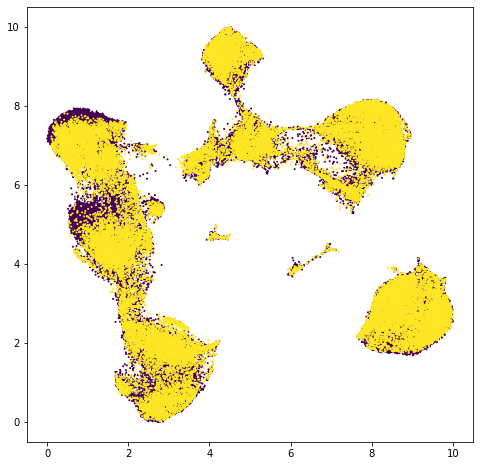

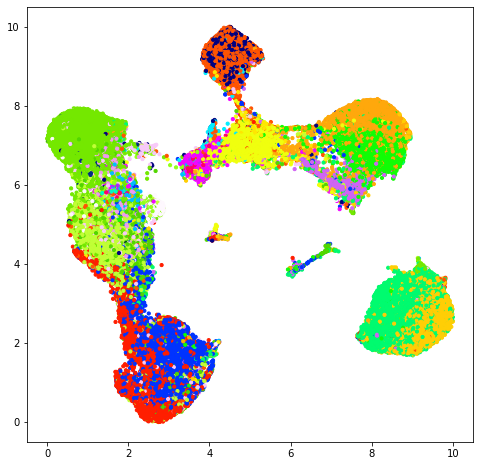

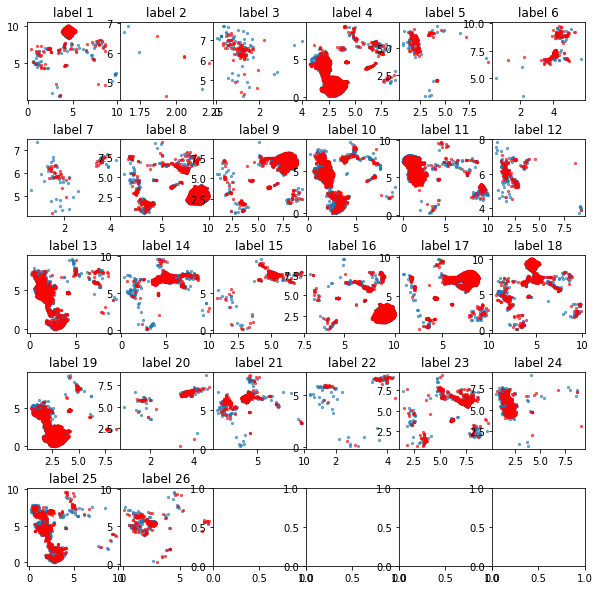

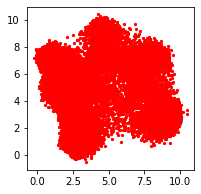

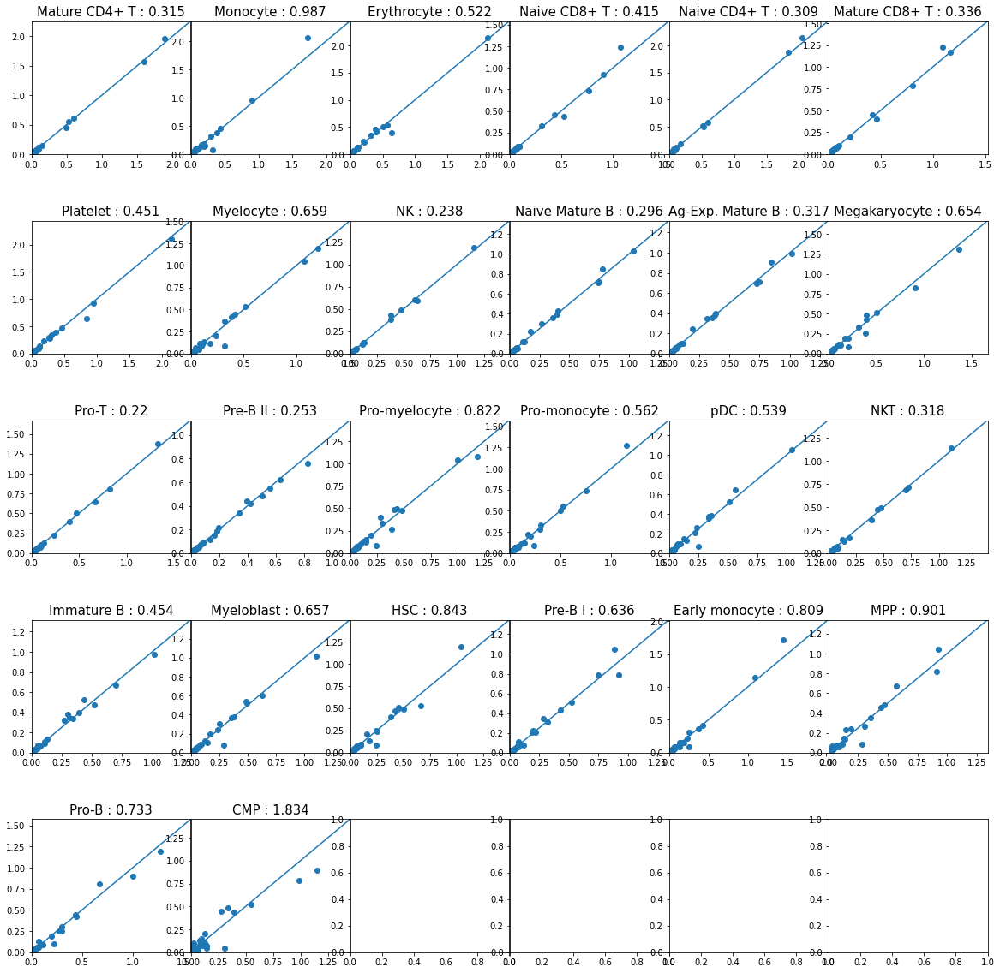

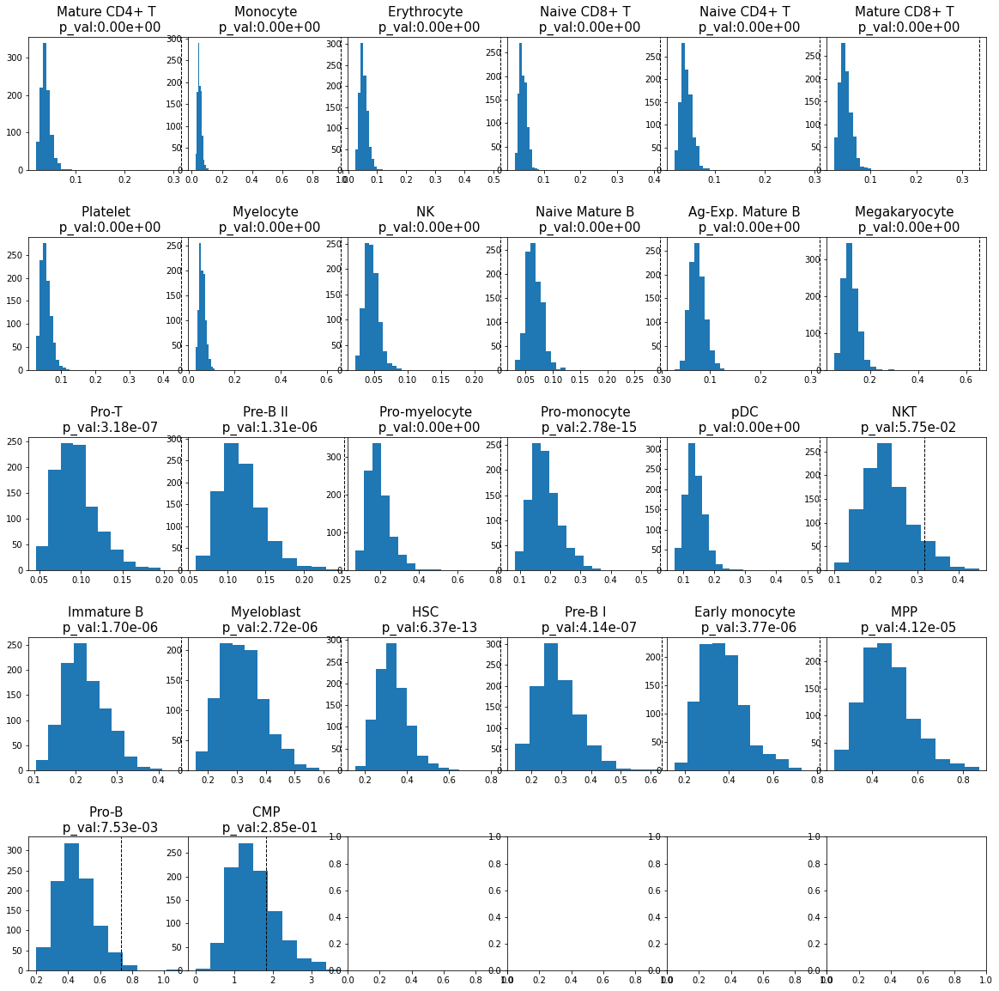

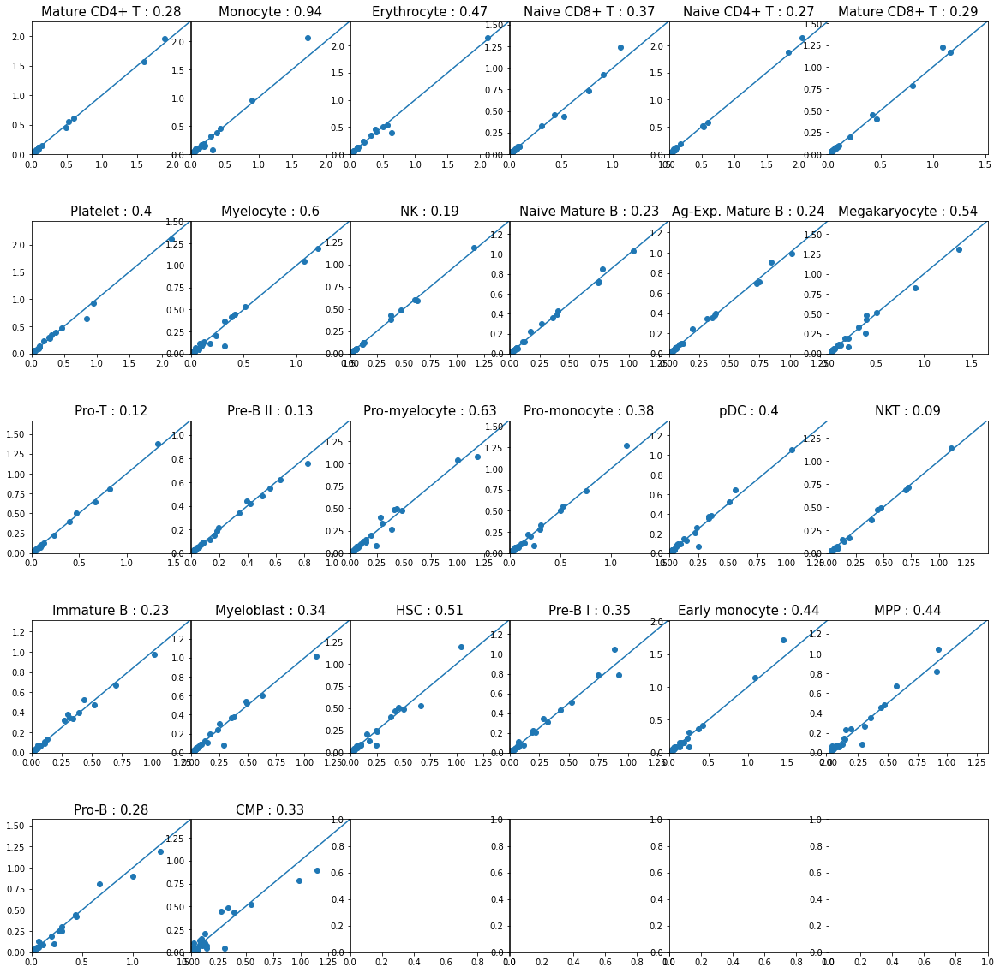

SPADE/files_Bendall_et_al/CyTOF54_Tube02_Day1_Unstim2_curated.fcs_eventnum_Ungated_Unstim2_Day1_normalized_2_Unstim2_Singlets.fcs.txt
(49790, 69) (49108, 69)
(49790, 37) (49108, 37)
(98898, 37) (98898, 2)
(49790, 37) (49108, 37) 49790 49108 (49790, 2) (49108, 2)


Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
100%|██████████| 26/26 [02:58<00:00,  6.87s/it]:00]        


            cell 0          cell 0 - score          cell 1  \
0      110_114-CD3      0.0387740584816314        115-CD45   
1         158-CD33     0.03123841975842112     110_114-CD3   
2         142-CD19     0.02866497921535205      150-pSTAT5   
3       139-CD45RA    0.020079304706831946        152-Ki67   
4         147-CD20     0.01933635700635722        169-pP38   
5          145-CD4      0.0189931631569914        158-CD33   
6         169-pP38     0.01103594462621163         145-CD4   
7         115-CD45    0.009275088415908628      174-pSrcFK   
8          146-CD8     0.00658437357204783        148-CD34   
9       150-pSTAT5    0.005421482779746252       160-CD123   
10     164-pSLP-76    0.004195525148101401        167-CD38   
11       144-CD11b    0.003707114172859745  141-pPLCgamma2   
12    171-pBtk/Itk   0.0033409540319110365         146-CD8   
13  141-pPLCgamma2   0.0032432398003588506         110-CD3   
14    166-IkBalpha    0.002833934214466746         112-CD3   
15      

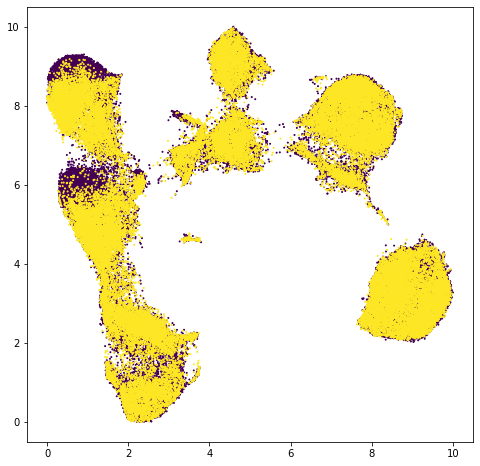

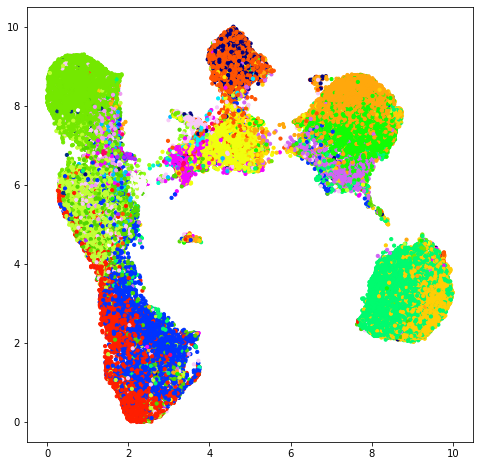

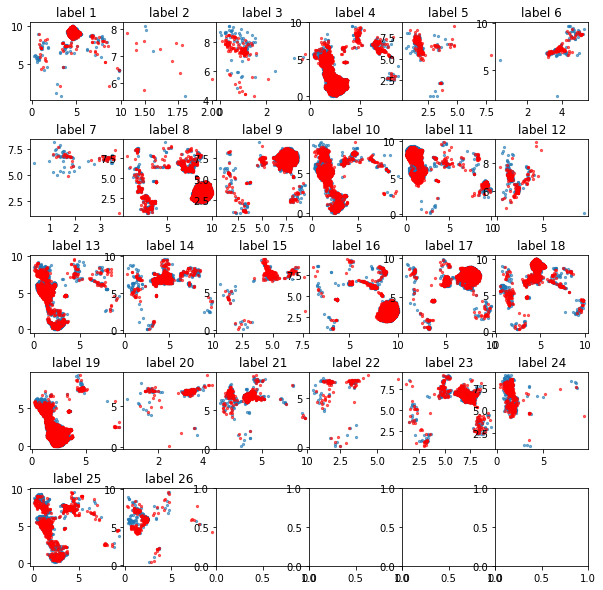

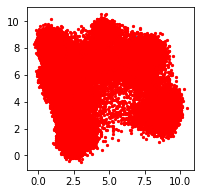

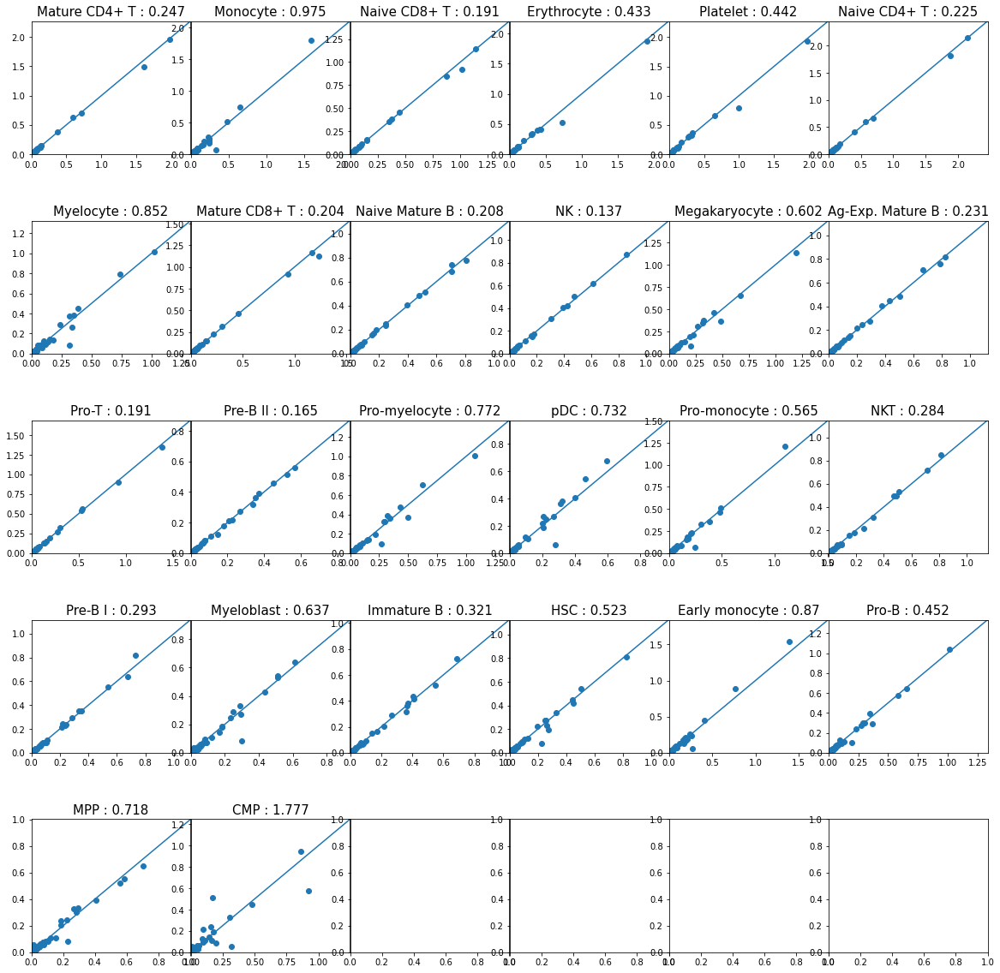

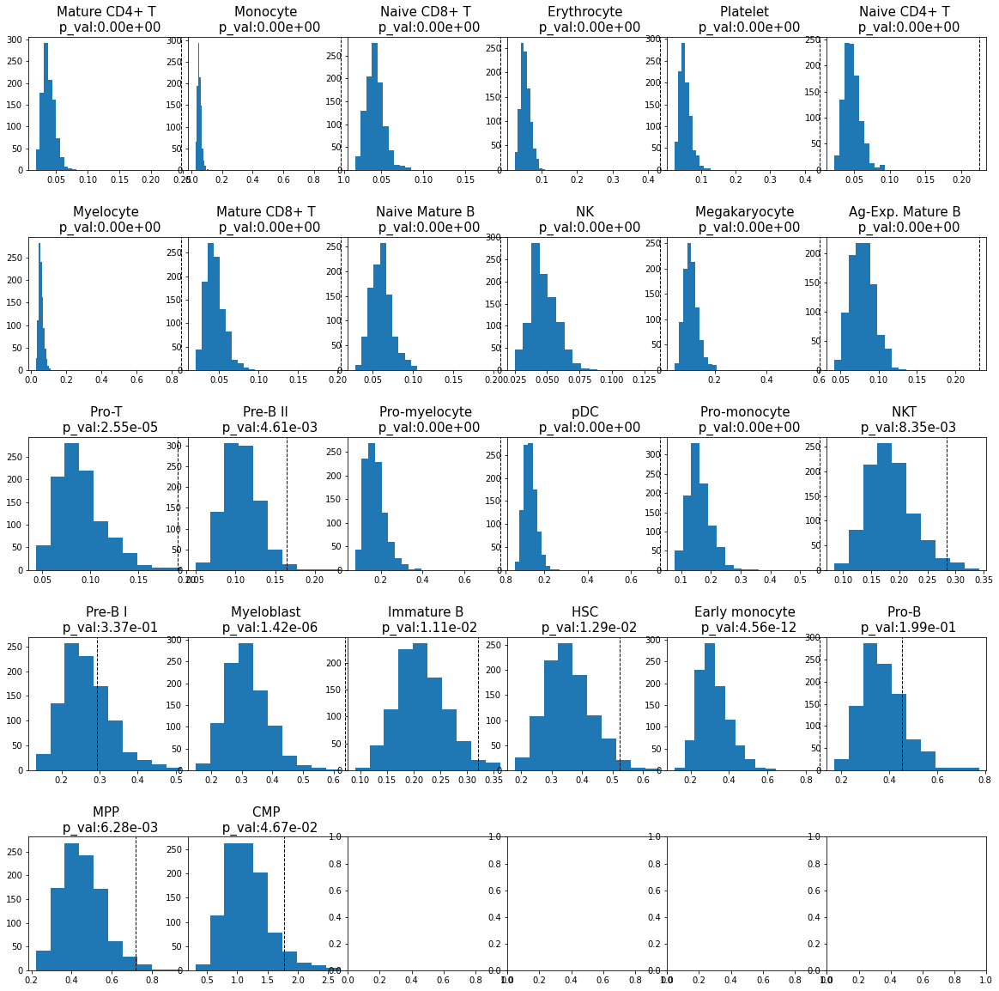

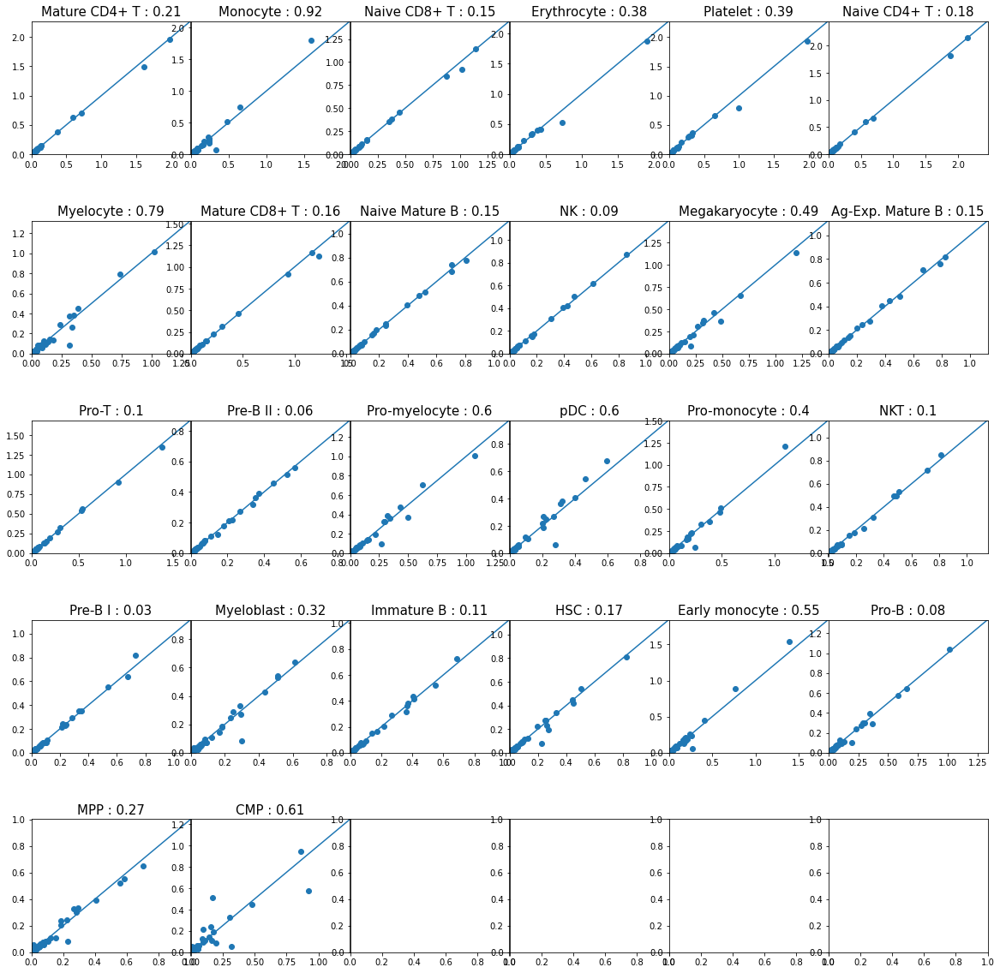

SPADE/files_Bendall_et_al/CyTOF54_Tube03_Day2_Unstim3_curated.fcs_eventnum_Ungated_Unstim3_Day2_normalized_3_Unstim3_Singlets.fcs.txt
(49790, 69) (68727, 69)
(49790, 37) (68727, 37)
(118517, 37) (118517, 2)
(49790, 37) (68727, 37) 49790 68727 (49790, 2) (68727, 2)


Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
100%|██████████| 26/26 [03:25<00:00,  7.90s/it]00:00]        


            cell 0          cell 0 - score          cell 1  \
0       139-CD45RA     0.09364070780329231     110_114-CD3   
1         169-pP38     0.05185767203797298      150-pSTAT5   
2         142-CD19     0.04678550444800744    171-pBtk/Itk   
3         158-CD33     0.04393375542786332        167-CD38   
4        160-CD123     0.02658916869575506      139-CD45RA   
5      110_114-CD3     0.02021797768009992  156-pZAP70/Syk   
6         147-CD20     0.01548022202600502        147-CD20   
7       150-pSTAT5    0.009516532507532434        142-CD19   
8         167-CD38     0.00907618328510601         146-CD8   
9          145-CD4    0.008617600962782523        158-CD33   
10  141-pPLCgamma2    0.007878180892216702    166-IkBalpha   
11       144-CD11b    0.006113634713008527     151-pERK1/2   
12        152-Ki67    0.005931056533242052         112-CD3   
13        115-CD45    0.005445157359188935       160-CD123   
14  156-pZAP70/Syk    0.003906071635740787       165-pNFkB   
15      

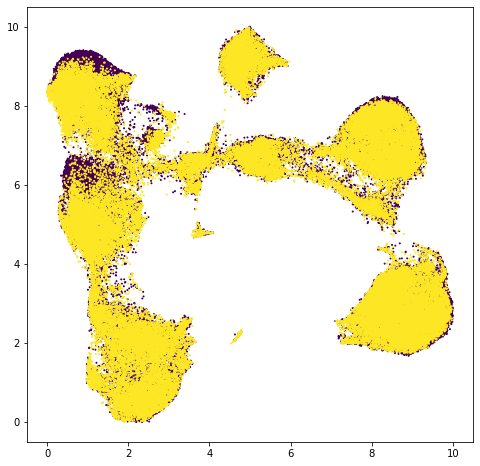

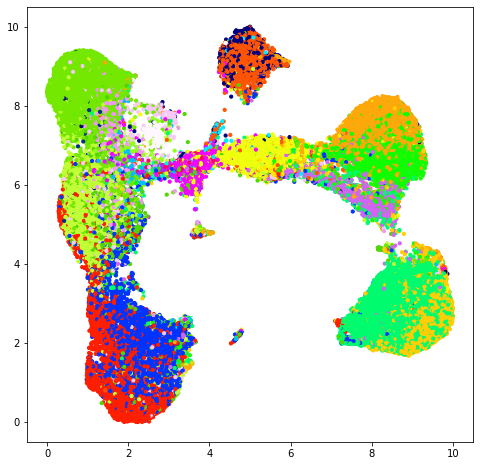

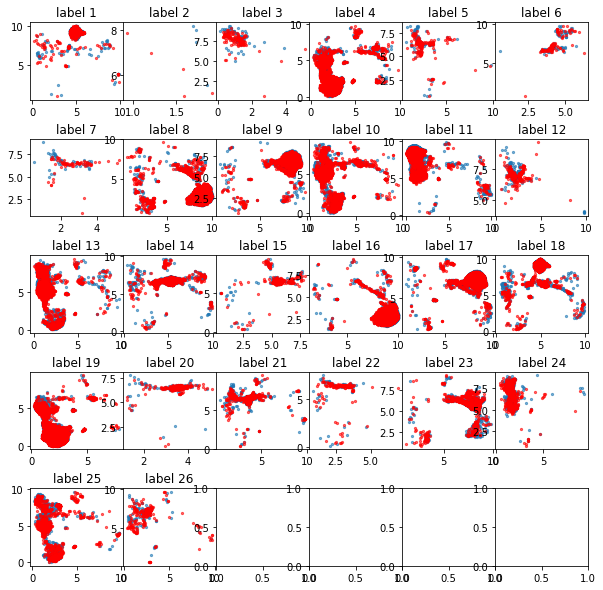

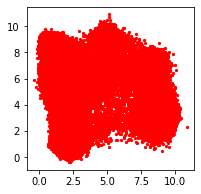

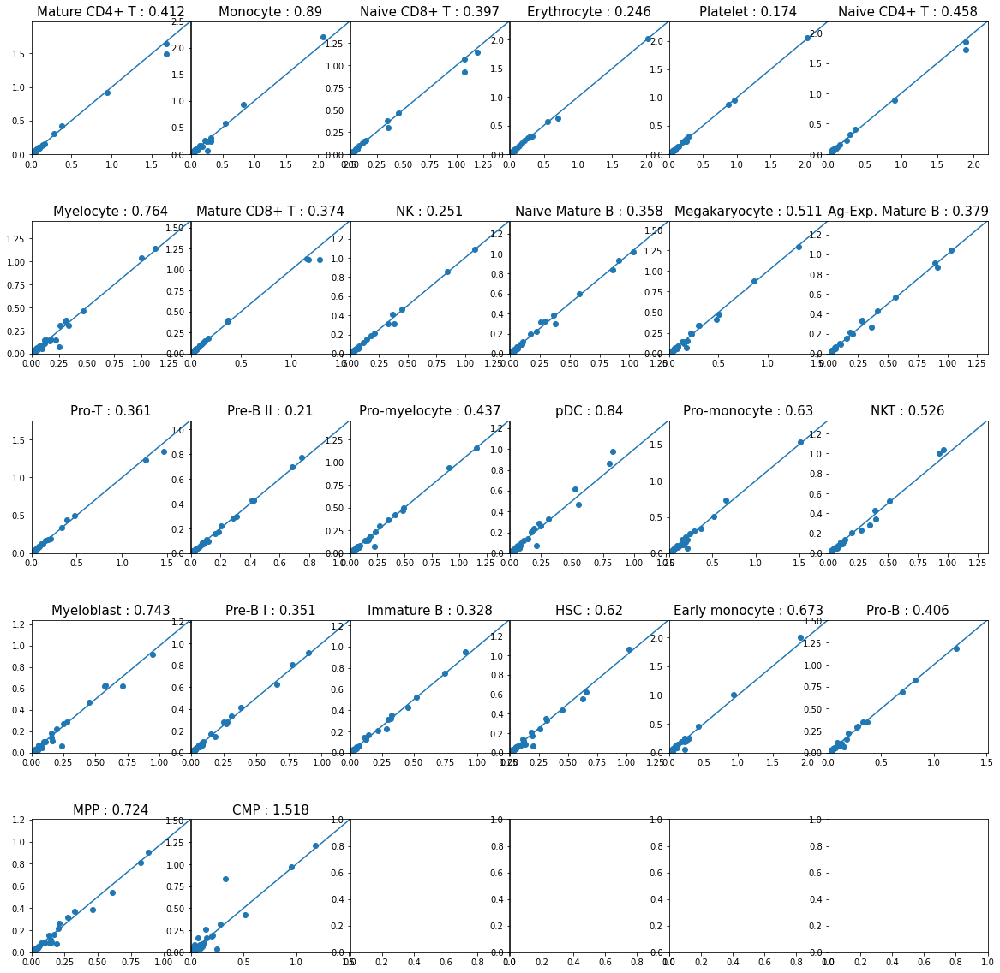

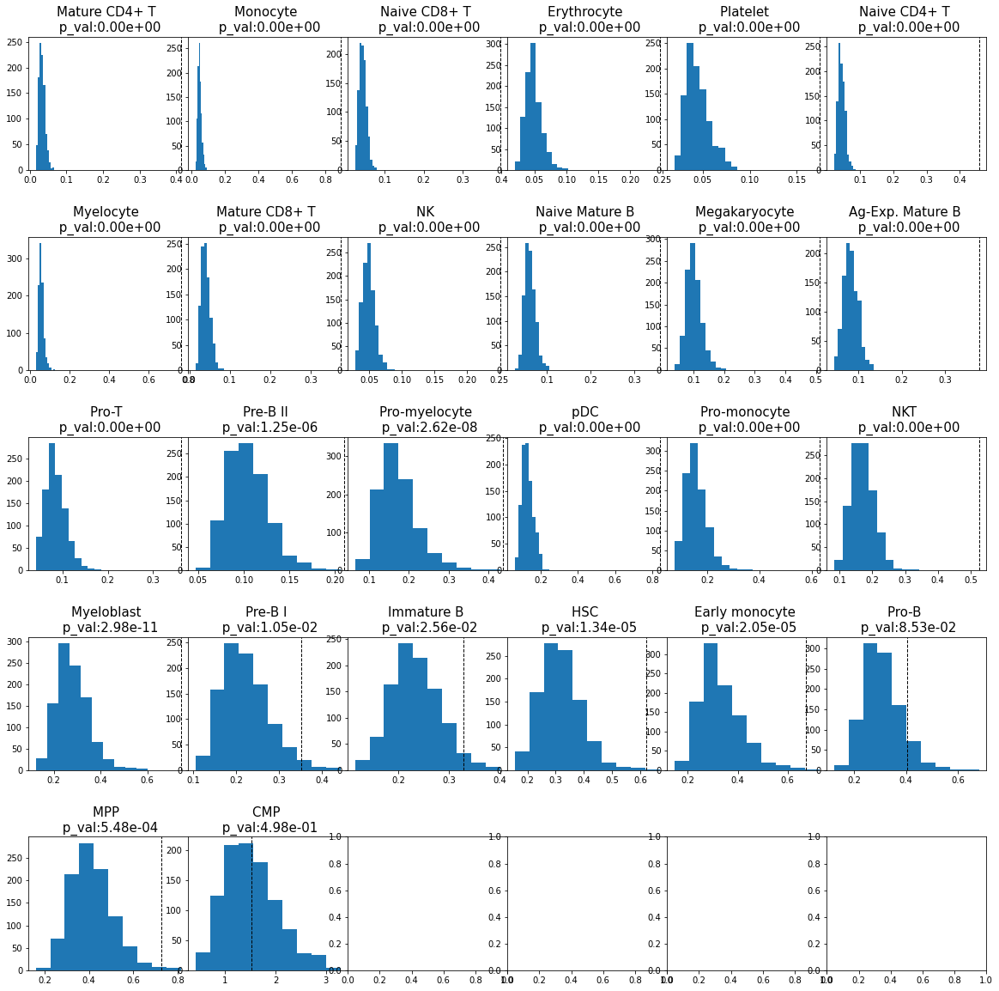

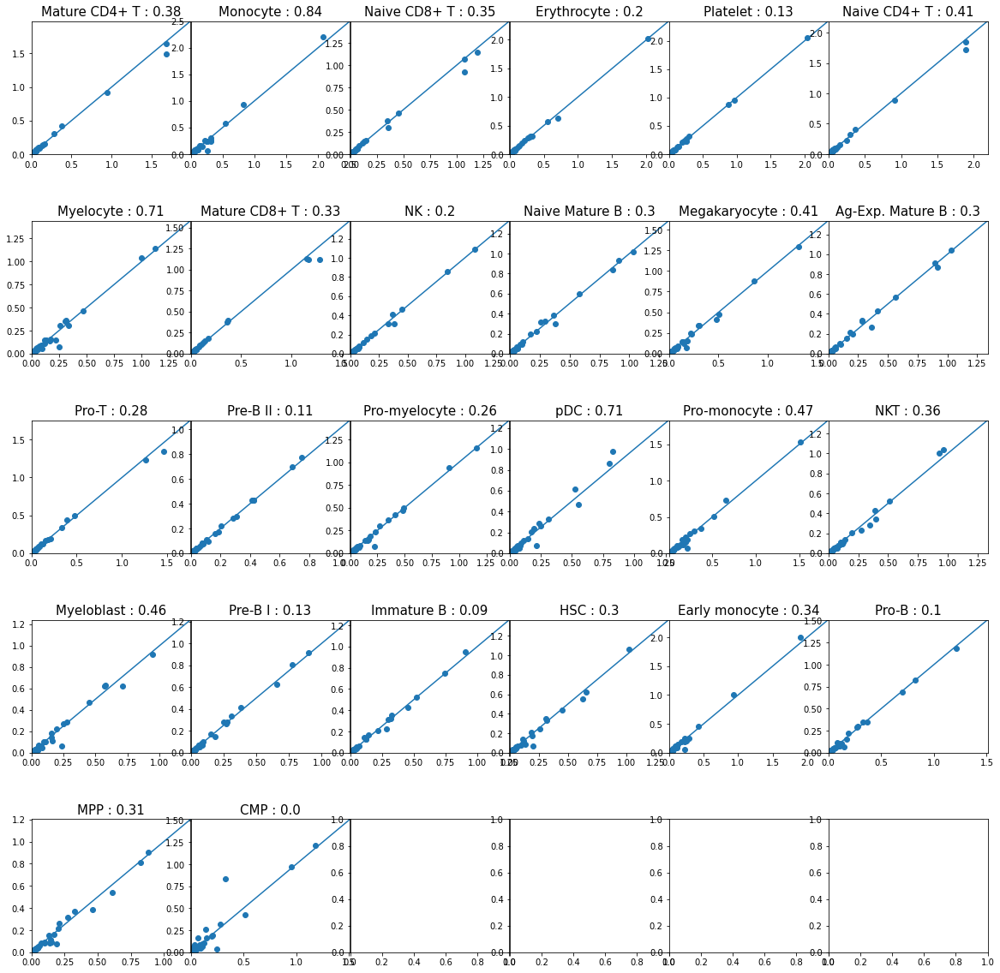

SPADE/files_Bendall_et_al/CyTOF54_Tube04_Day2_Unstim4_curated.fcs_eventnum_Ungated_Unstim4_Day2_normalized_4_Unstim4_Singlets.fcs.txt
(49790, 69) (26588, 69)
(49790, 37) (26588, 37)
(76378, 37) (76378, 2)
(49790, 37) (26588, 37) 49790 26588 (49790, 2) (26588, 2)


Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
100%|██████████| 26/26 [02:10<00:00,  5.03s/it]:00]        


            cell 0          cell 0 - score          cell 1  \
0       139-CD45RA     0.09827721030929815     110_114-CD3   
1          193-DNA     0.09381925264864192      150-pSTAT5   
2          191-DNA     0.08230157542934598        152-Ki67   
3         142-CD19    0.055609673634618884        158-CD33   
4         115-CD45     0.04459532848584913         145-CD4   
5         158-CD33    0.021861207611633182        148-CD34   
6        160-CD123    0.018103359741606165      159-pSTAT3   
7         147-CD20    0.016853775827562173         193-DNA   
8         167-CD38    0.016309897245646104        167-CD38   
9         152-Ki67    0.012848545381603044     164-pSLP-76   
10         168-pH3     0.01144712883241443        115-CD45   
11    171-pBtk/Itk    0.010272085684904564       165-pNFkB   
12         145-CD4     0.00883731013117589       160-CD123   
13  141-pPLCgamma2    0.008619985508379335         191-DNA   
14         110-CD3    0.007982526487950298        142-CD19   
15      

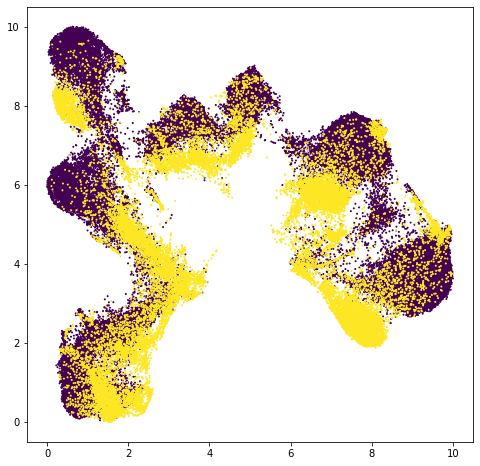

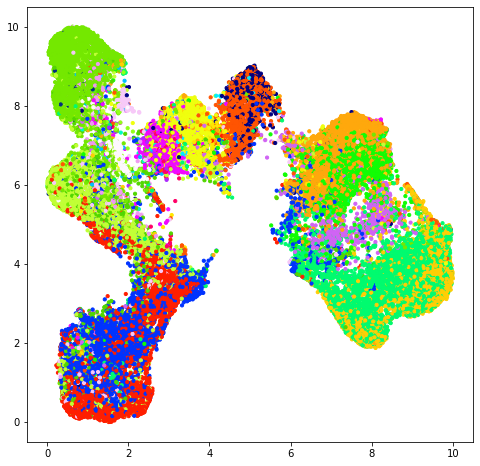

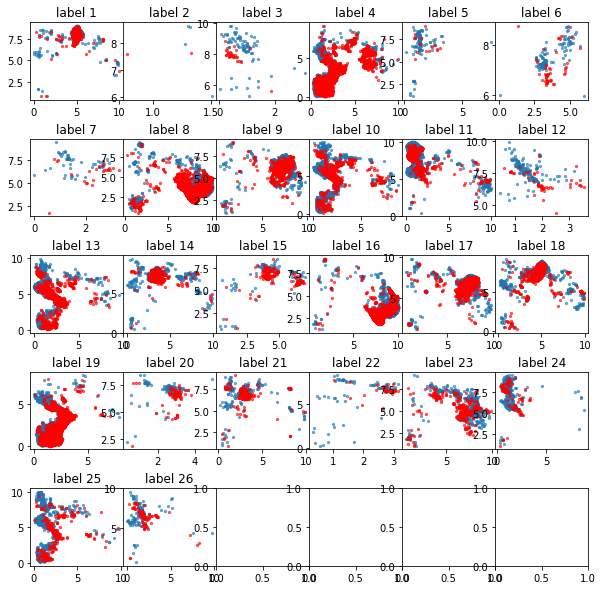

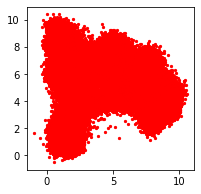

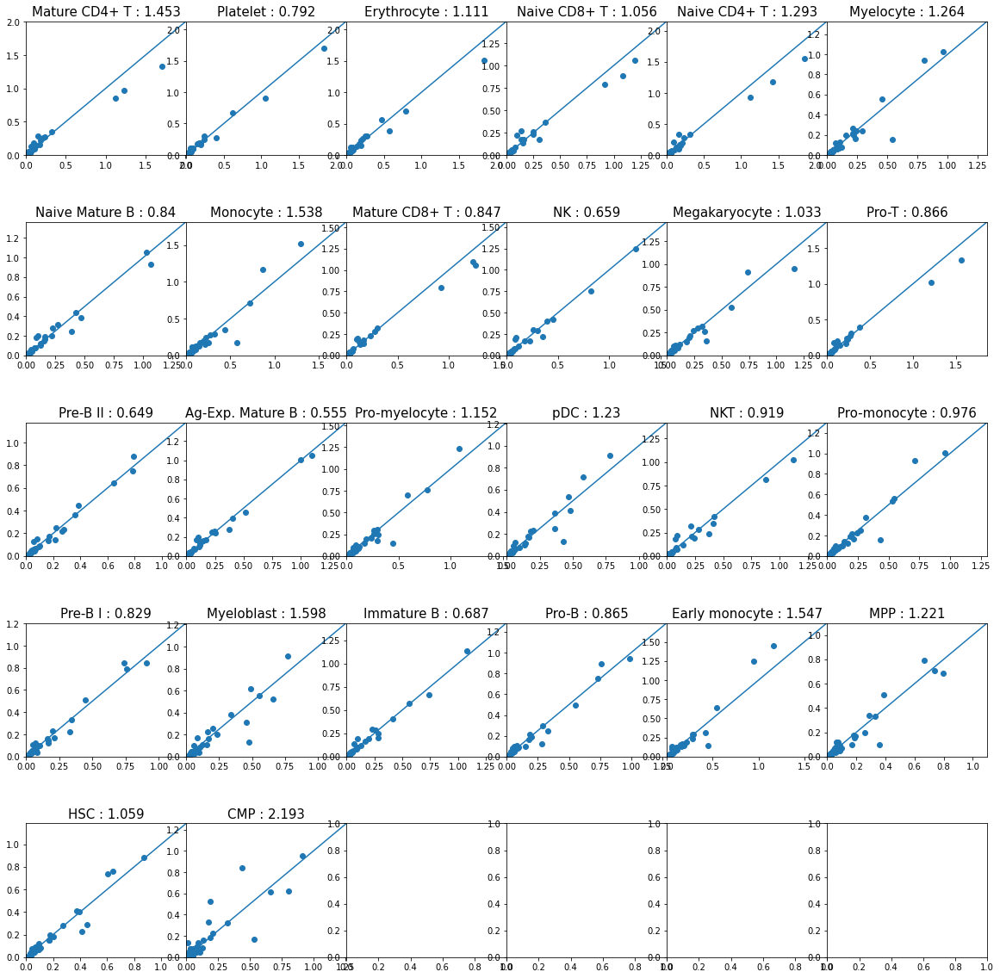

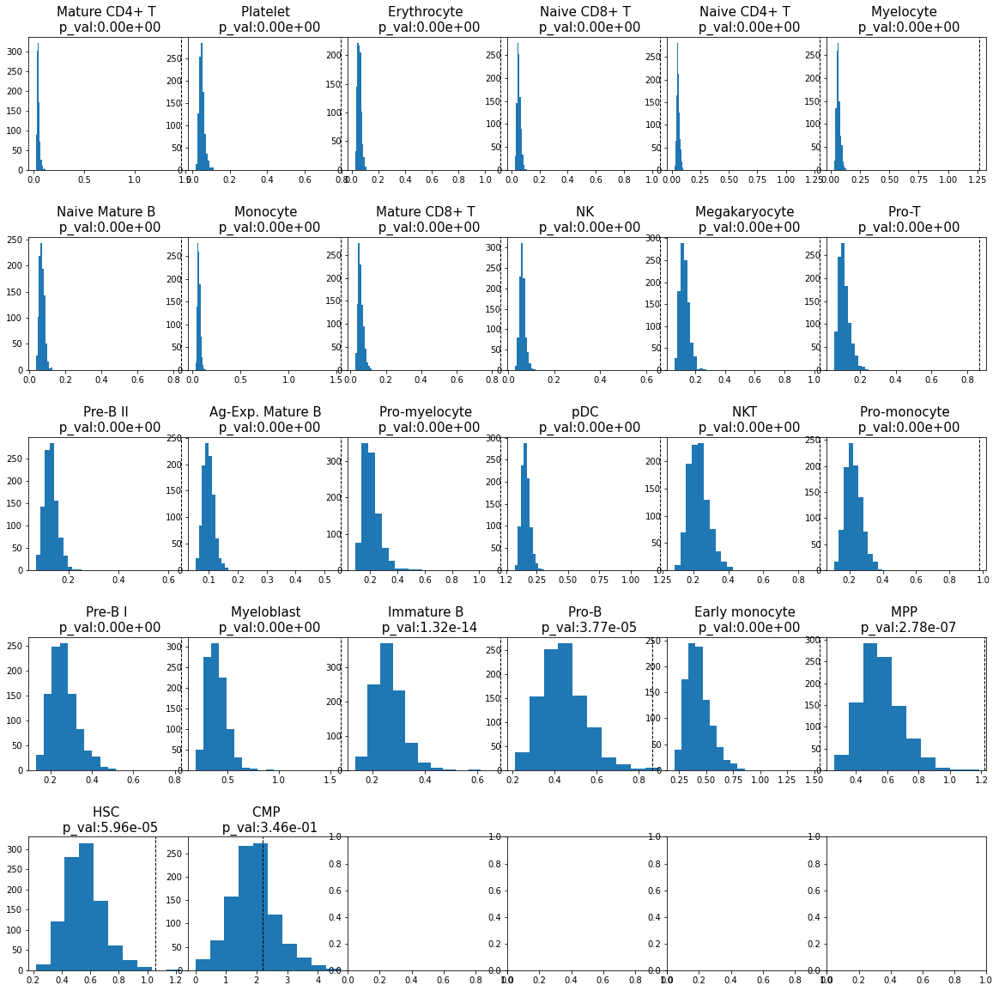

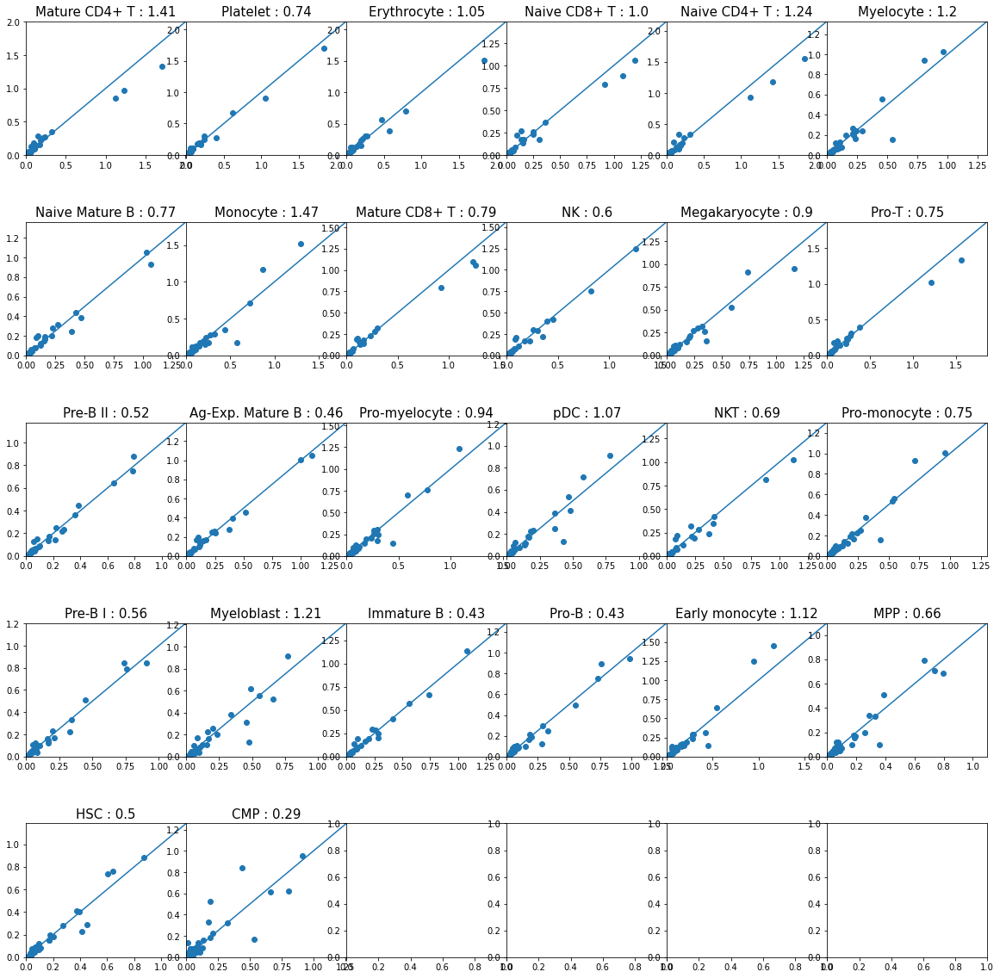

SPADE/files_Bendall_et_al/CyTOF54_Tube05_Day3_Unstim5_curated.fcs_eventnum_Ungated_Unstim5_Day3_normalized_5_Unstim5_Singlets.fcs.txt
(49790, 69) (57771, 69)
(49790, 37) (57771, 37)
(107561, 37) (107561, 2)
(49790, 37) (57771, 37) 49790 57771 (49790, 2) (57771, 2)


Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
100%|██████████| 26/26 [03:04<00:00,  7.10s/it]00:00]        


            cell 0          cell 0 - score          cell 1  \
0      110_114-CD3     0.04215480357845269     110_114-CD3   
1         169-pP38     0.03447107905002078        115-CD45   
2         115-CD45    0.018300905256089295      150-pSTAT5   
3         147-CD20    0.015936176223039666        158-CD33   
4         158-CD33    0.009789036111844784        169-pP38   
5       150-pSTAT5    0.007182238573764724        152-Ki67   
6       159-pSTAT3    0.006184128903619697         145-CD4   
7     171-pBtk/Itk    0.005068192242382835      159-pSTAT3   
8     166-IkBalpha    0.005019001841280291        167-CD38   
9   141-pPLCgamma2    0.004677149582780149         114-CD3   
10       160-CD123   0.0036926127310893397        142-CD19   
11      139-CD45RA   0.0033125644206069005    171-pBtk/Itk   
12         146-CD8    0.003310389060069807         112-CD3   
13        152-Ki67    0.002841365453558495      139-CD45RA   
14       144-CD11b     0.00273312339591978         110-CD3   
15      

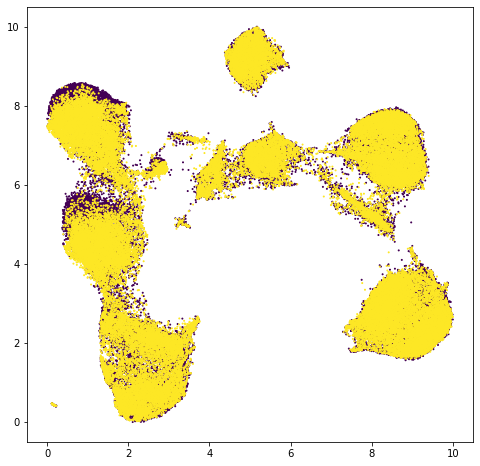

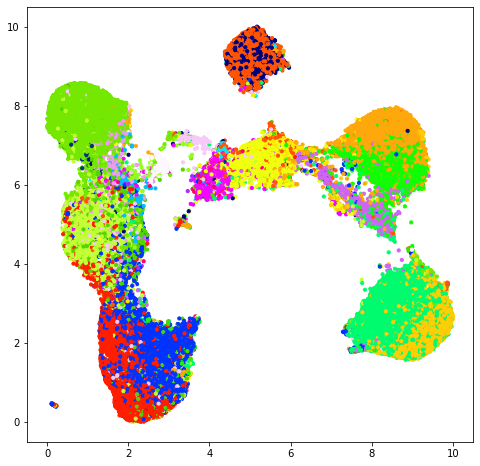

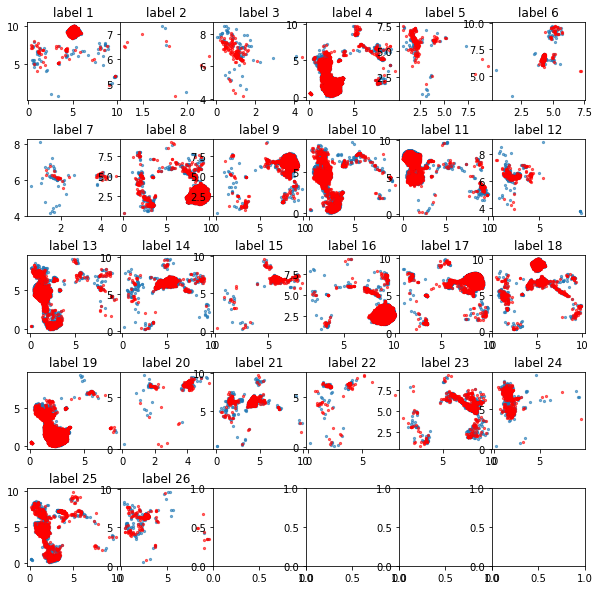

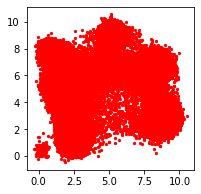

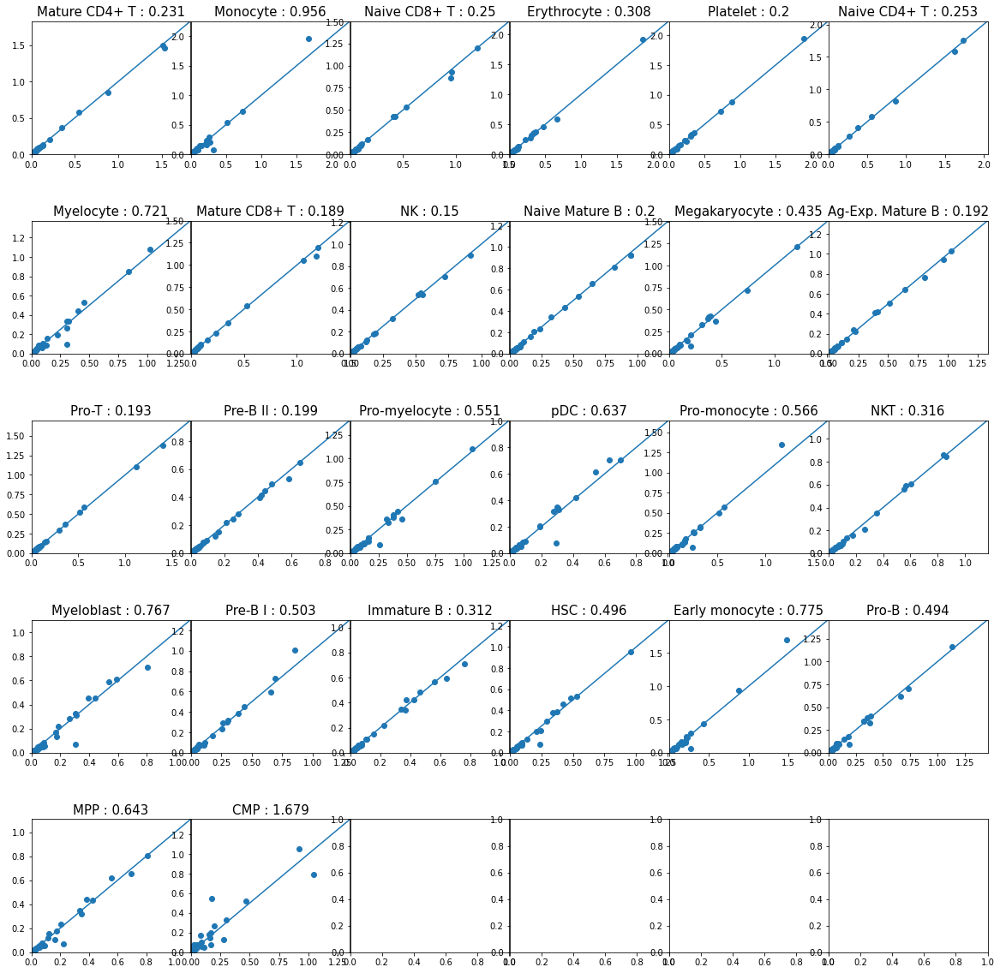

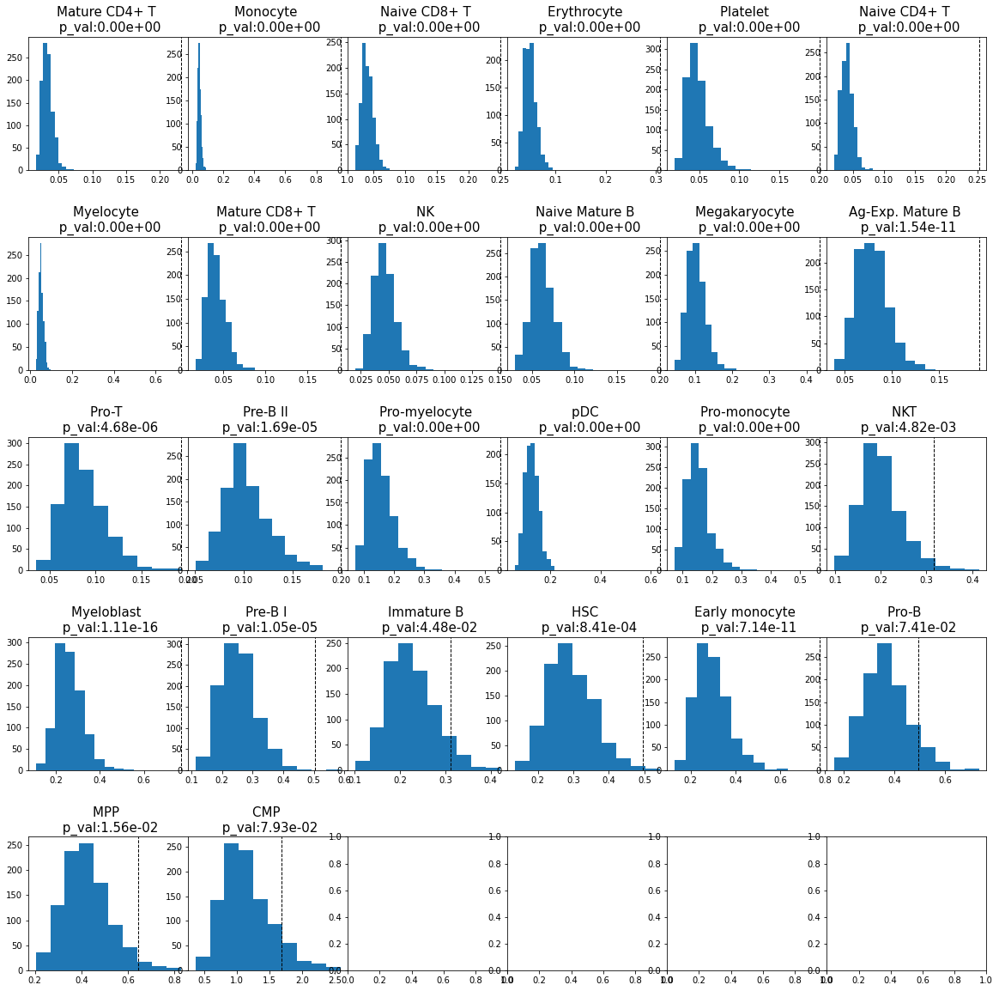

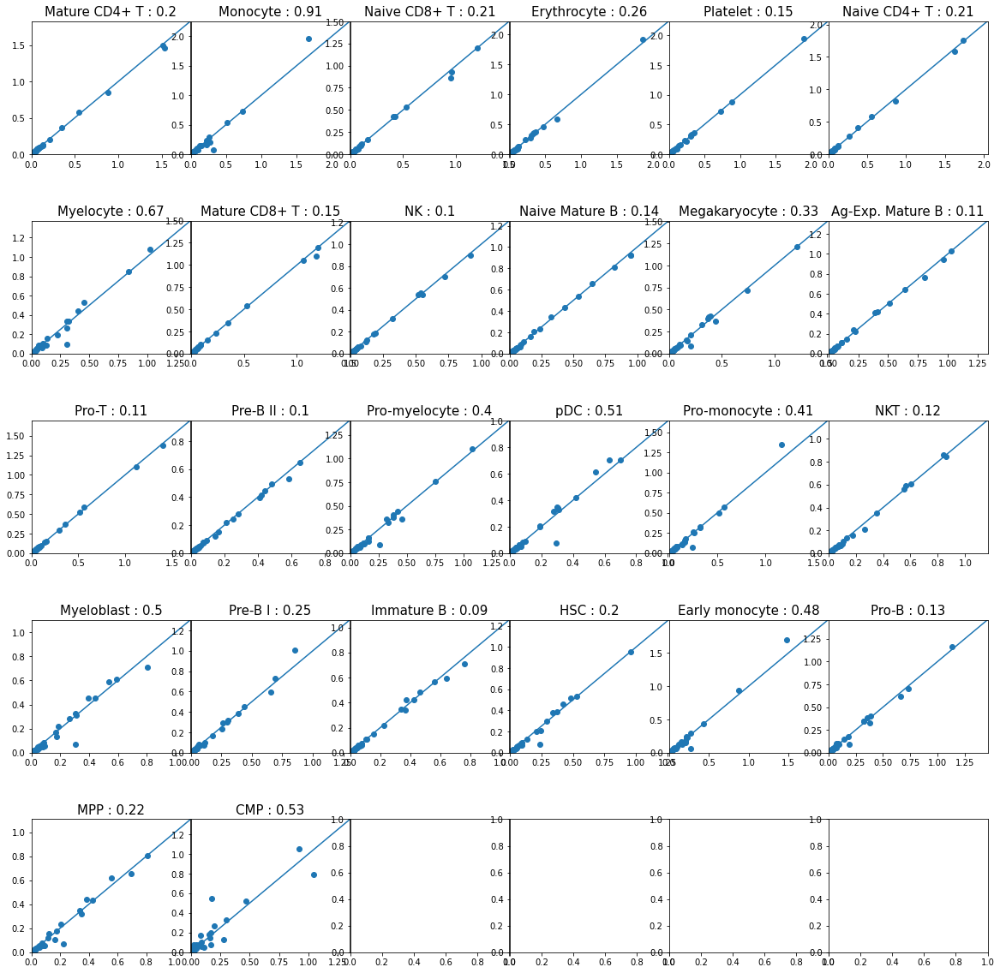

In [24]:
normal_files = [
    'SPADE/files_Bendall_et_al/CyTOF54_Tube01_Day1_Unstim1_curated.fcs_eventnum_Ungated_Jnstim1_Day1_normalized_1_Unstim1_Singlets.fcs.txt',
    'SPADE/files_Bendall_et_al/CyTOF54_Tube02_Day1_Unstim2_curated.fcs_eventnum_Ungated_Unstim2_Day1_normalized_2_Unstim2_Singlets.fcs.txt',
    'SPADE/files_Bendall_et_al/CyTOF54_Tube03_Day2_Unstim3_curated.fcs_eventnum_Ungated_Unstim3_Day2_normalized_3_Unstim3_Singlets.fcs.txt',
    'SPADE/files_Bendall_et_al/CyTOF54_Tube04_Day2_Unstim4_curated.fcs_eventnum_Ungated_Unstim4_Day2_normalized_4_Unstim4_Singlets.fcs.txt',
    'SPADE/files_Bendall_et_al/CyTOF54_Tube05_Day3_Unstim5_curated.fcs_eventnum_Ungated_Unstim5_Day3_normalized_5_Unstim5_Singlets.fcs.txt'
]

stimulated_file = 'SPADE/files_Bendall_et_al/CyTOF54_Tube11_Day1_GMCSF_concatv3_curated.fcs_eventnum_Ungated_GMCSF_Day1_normalized_11_GMCSF_Singlets.fcs.txt'

gmscsf_names = []
gmscsf_scores = []
gmscsf_scores_cor = []
gmscsf_gs = []
gmscsf_gs2 = []

for normal_file in normal_files:
    print(normal_file)
    df1 = pd.read_csv(stimulated_file,sep="\t", header=0)
    df2 = pd.read_csv(normal_file,sep="\t", header=0)

    df1 = df1.sample(frac=0.2,random_state=0)
    df2 = df2.sample(frac=0.2,random_state=0)
    print(df1.shape, df2.shape)

    label1 = list(df1['cell_type_index'])
    label2 = list(df2['cell_type_index'])
    combined_labels = label1 + label2
    batch_info = [0 for i in range(len(label1))] + [1 for i in range(len(label2))]

    meta = np.array([combined_labels,batch_info]).T

    cell_types = ['Ag-Exp. Mature B',
           'CMP', 'Early monocyte', 'Erythrocyte', 'HSC', 'Immature B', 'MPP',
           'Mature CD4+ T', 'Mature CD8+ T', 'Megakaryocyte', 'Monocyte',
           'Myeloblast', 'Myelocyte', 'NK', 'NKT', 'Naive CD4+ T', 'Naive CD8+ T',
           'Naive Mature B', 'Platelet', 'Pre-B I', 'Pre-B II', 'Pro-B', 'Pro-T',
           'Pro-monocyte', 'Pro-myelocyte', 'pDC']

    #CD: 3, 4, 8, 11b, 19, 20, 33, 34, 38, 45, 45RA, 90, 123

    markers = [ '110-CD3',
     '110_114-CD3',
     '111-CD3',
     '112-CD3',
     '114-CD3',
     '115-CD45',
     '139-CD45RA',
     '141-pPLCgamma2',
     '142-CD19',
     '144-CD11b',
     '145-CD4',
     '146-CD8',
     '147-CD20',
     '148-CD34',
     '150-pSTAT5',
     '151-pERK1/2',
     '152-Ki67',
     '153-pMAPKAPK2',
     '154-pSHP2',
     '156-pZAP70/Syk',
     '158-CD33',
     '159-pSTAT3',
     '160-CD123',
     '164-pSLP-76',
     '165-pNFkB',
     '166-IkBalpha',
     '167-CD38',
     '168-pH3',
     '169-pP38',
     '170-CD90',
     '171-pBtk/Itk',
     '172-pS6',
     '174-pSrcFK',
     '175-pCrkL',
     '176-pCREB',
     '191-DNA',
     '193-DNA']
    
    df1_linege = df1[markers]

    df2_linege = df2[markers]

    print(df1_linege.shape, df2_linege.shape)

    combined_df = pd.concat([df1_linege, df2_linege])
    print(combined_df.shape, meta.shape)

    pca = PCA(n_components=10)
    pca_emb = pca.fit_transform(combined_df)

    reducer = umap.UMAP(random_state=42)
    embedding = reducer.fit_transform(pca_emb)
    #Scaling so that min and max alwasys be 0 and 10 for both x and y axis
    scaler = MinMaxScaler()
    embedding = 10*scaler.fit_transform(embedding)

    plt.figure(figsize=(8,8))
    plt.scatter(embedding[:,0],embedding[:,1],c=meta[:,1],s=1)

    def get_cmap(n, name='gist_ncar'):
        '''Returns a function that maps each index in 0, 1, ..., n-1 to a distinct 
        RGB color; the keyword argument name must be a standard mpl colormap name.'''
        return plt.cm.get_cmap(name, n)

    cmap = get_cmap(len(np.unique(meta[:,0])))
    cmap

    plt.figure(figsize=(8,8))
    plt.scatter(embedding[:,0],embedding[:,1],c=meta[:,0],s=10,cmap=cmap)

#     for i in np.unique(labels):
#         print(cell_types[i-1])

#         cond1 = meta[:,0]==i
#         cond2 = meta[:,1]==0
#         cond3 = meta[:,1]==1

#         cond_d1 = cond1*cond2
#         cond_d2 = cond1*cond3

#         plt.figure(figsize=(6,6))
#         plt.scatter(embedding[:,0],embedding[:,1],c=cond_d1,s=10)
#         plt.show()
#         plt.figure(figsize=(6,6))
#         plt.scatter(embedding[:,0],embedding[:,1],c=cond_d2,s=10)
#         plt.show()
#         print('--------------------------------------------------')

    

    def eval_score_sum(vector1,vector2):
        diff = np.abs(vector1 - vector2)
        score = np.around(np.sum(diff),3)
        return score


    batch1 = df1[markers]
    batch2 = df2[markers]
    y_1 = label1
    y_2 = label2
    emb1 = embedding[meta[:,1]==0,:]
    emb2 = embedding[meta[:,1]==1,:]

    print(batch1.shape, batch2.shape, len(y_1), len(y_2), emb1.shape, emb2.shape)

    Combined = np.vstack((batch1, batch2))
    embedding = np.vstack((emb1, emb2))
    # Initial Visualization per label
    seurat_labels = list(y_1) + list(y_2)
    unq_labels = np.unique(seurat_labels)
    fig, axs = plt.subplots(5,6, figsize=(10, 10), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .5, wspace=.001)

    axs = axs.ravel()

    for label in unq_labels:
        tmp_ctrl=emb1[y_1 == label,:]
        tmp_stim=emb2[y_2 == label,:]

        axs[label-1].scatter(tmp_ctrl[:,0],tmp_ctrl[:,1],s=5,alpha=0.6)
        axs[label-1].scatter(tmp_stim[:,0],tmp_stim[:,1],s=5,alpha=0.6,c='r')
        axs[label-1].set_title('label {}'.format(label))

    # XGBoost
    X = Combined
    y0 = embedding[:,0]

    model_x = XGBRegressor()
    model_x.fit(X, y0)

    predicted_x = model_x.predict(X)

    y1 = embedding[:,1]

    model_y = XGBRegressor()
    model_y.fit(X, y1)
    predicted_y = model_y.predict(X)

    plt.figure(figsize=(3,3))
    plt.scatter(y0,y1,s=10)
    plt.scatter(predicted_x,predicted_y,c='r',s=5)

    # SHAP
    explainer = shap.TreeExplainer(model_x,X)
    shap_value_x = explainer.shap_values(X)
    explainer = shap.TreeExplainer(model_y,X)
    shap_value_y = explainer.shap_values(X)

    comb_shap_values = np.sqrt((shap_value_x**2 + shap_value_y**2))
    batch1_shap = comb_shap_values[:len(y_1),:]
    batch2_shap = comb_shap_values[len(y_1):,:]

    # Analysis
    cell_num = []
    for label in unq_labels:
        a=np.sum(y_1 == label)
        b=np.sum(y_2 == label)
        cell_num.append(min(a,b))

    cell_orders = unq_labels[np.argsort(-1*np.array(cell_num))]

    # Cell-type variation
    fig, axs = plt.subplots(5,6, figsize=(20, 20), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .5, wspace=.001)
    axs = axs.ravel()
    scores_stunst1 = []
    for ct,label in enumerate(cell_orders):
        tmp_batch1_shap = batch1_shap[y_1 == label, :]
        tmp_batch2_shap = batch2_shap[y_2 == label, :]

        tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
        tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)

        score = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
        scores_stunst1.append(score)
        cap = max(np.max(tmp_mean_feature1), np.max(tmp_mean_feature2)) + 0.3
        diag = np.linspace(0,cap)
        axs[ct].scatter(tmp_mean_feature1,tmp_mean_feature2)
        axs[ct].plot(diag,diag)
        axs[ct].set_xlim(0,cap)
        axs[ct].set_ylim(0,cap)
        axs[ct].set_title(cell_types[label-1]+ ' : '  + str(score),fontsize=15)
        
        gmscsf_names.append(cell_types[label-1])
        gmscsf_scores.append(score)
        

    # Random Variation
    comb_label = list(y_1)+list(y_2)
    LABEL_SCORES_COMB = []
    for label in tqdm(cell_orders):
        label_score = []
        for i in range(1000):

            tmp_batch = comb_shap_values[np.array(comb_label) == label, :]

            tmp_batch1_shap = tmp_batch[np.random.randint(0, tmp_batch.shape[0],int(tmp_batch.shape[0]/2)),:]
            tmp_batch2_shap = tmp_batch[np.random.randint(0, tmp_batch.shape[0],int(tmp_batch.shape[0]/2)),:]

            tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
            tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)

            score = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
            label_score.append(score)
        LABEL_SCORES_COMB.append(label_score)



    # Showing the variation with cell-specific scores 
    ct = 0
    fig, axs = plt.subplots(5,6, figsize=(20, 20), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .5, wspace=.001)
    axs = axs.ravel()

    for scores in LABEL_SCORES_COMB:
        axs[ct].hist(scores)
        tmp = scores + [scores_stunst1[ct]]
        zscores = stats.zscore(tmp)
        p_values = 1 - scipy.special.ndtr(zscores)
        axs[ct].set_title('{} \n p_val:{}'.format(cell_types[cell_orders[ct]-1],'{:.2e}'.format(p_values[-1])),fontsize=15)
        axs[ct].axvline(scores_stunst1[ct], color='k', linestyle='dashed', linewidth=1)
        ct += 1
    

    mean_perms = []
    for scores in LABEL_SCORES_COMB:
        mean_perms.append(np.nanmean(scores))

    # Cell-type variation random-perm corrected
    fig, axs = plt.subplots(5,6, figsize=(20, 20), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .5, wspace=.001)
    axs = axs.ravel()
    scores_stunst1 = []
    for ct,label in enumerate(cell_orders):
        tmp_batch1_shap = batch1_shap[y_1 == label, :]
        tmp_batch2_shap = batch2_shap[y_2 == label, :]

        tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
        tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)

        score = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
        scores_stunst1.append(score)
        cap = max(np.max(tmp_mean_feature1), np.max(tmp_mean_feature2)) + 0.3
        diag = np.linspace(0,cap)
        axs[ct].scatter(tmp_mean_feature1,tmp_mean_feature2)
        axs[ct].plot(diag,diag)
        axs[ct].set_xlim(0,cap)
        axs[ct].set_ylim(0,cap)
        axs[ct].set_title(cell_types[label-1]+ ' : '  + str(np.round(score-mean_perms[ct],2)),fontsize=15)
        
        gmscsf_scores_cor.append(np.round(score-mean_perms[ct],2))

    # Featuer Scores 
    feature_names = markers
    scores = []
    gene_ranks = []
    gene_ranks_pd = []
    gene_ranks_scores = []
    GENE_SCORES = []
    GENE_SCORES2 = []
    for label in unq_labels:
        tmp_batch1_shap = batch1_shap[y_1 == label, :]
        tmp_batch2_shap = batch2_shap[y_2 == label, :]
        tmp_combined_shap = np.vstack((tmp_batch1_shap,tmp_batch2_shap))

        tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
        tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)
        diag = np.linspace(0,np.max(np.concatenate([tmp_mean_feature1, tmp_mean_feature2])))

        score_by_feat = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
        scores.append(score_by_feat)
        gene_scores = np.abs(tmp_mean_feature1 - tmp_mean_feature2)
        gene_scores2 = (np.abs(tmp_mean_feature1 - tmp_mean_feature2)) / ((tmp_mean_feature1 + tmp_mean_feature2)/2)
        GENE_SCORES.append(gene_scores)
        GENE_SCORES2.append(gene_scores2)
        
        gene_ranks_pd.append(np.array(feature_names)[np.argsort(-1*(np.abs(tmp_mean_feature1 - tmp_mean_feature2)))])
        gene_ranks_scores.append(gene_scores[np.argsort(-1*(np.abs(tmp_mean_feature1 - tmp_mean_feature2)))])
        gene_ranks.append(np.array(feature_names)[np.argsort(np.abs(tmp_mean_feature1 - tmp_mean_feature2))])

    GS = pd.DataFrame(GENE_SCORES,columns=feature_names)
    GS.index = cell_types
    gmscsf_gs.append(GS)
    
    GS2 = pd.DataFrame(GENE_SCORES2,columns=feature_names)
    GS2.index = cell_types
    gmscsf_gs2.append(GS2)

    gene_meta_ranks = []
    for gene in feature_names:
        gene_loc = []
        for rank in gene_ranks:
            gene_loc.append(np.where(rank == gene)[0][0])
        gene_meta_ranks.append(gene_loc)
    gene_meta_ranks = np.array(gene_meta_ranks)

    csv = []
    for i in range(len(gene_ranks_pd)):
        csv.append(gene_ranks_pd[i])
        csv.append(gene_ranks_scores[i])

    column_names = []
    for i in range(len(unq_labels)):
        column_names.append('cell {}'.format(i))
        column_names.append('cell {} - score'.format(i))

    diff_genes = pd.DataFrame(np.array(csv).T,columns=column_names)
    print(diff_genes)
    plt.show()

In [25]:
pca_emb1 = pca_emb[meta[:,1]==0,:]
pca_emb2 = pca_emb[meta[:,1]==1,:]

In [26]:
unq_labels

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26])

In [27]:
UMAP_DIS = []
PCA_DIS = []
LBS_TO_USE = []
for i in unq_labels:
    idx_ctrl = np.where(y_1 == i)[0]
    idx_stim = np.where(y_2 == i)[0]
    if min(len(idx_ctrl),len(idx_stim)) < 100:
        continue
    LBS_TO_USE.append(i)
    ctrl_l = np.mean(emb1[idx_ctrl,:],axis=0)
    stim_l = np.mean(emb2[idx_stim,:],axis=0)
    dist_umap = np.linalg.norm(ctrl_l-stim_l)
    
    ctrl_l = np.mean(pca_emb1[idx_ctrl,:],axis=0)
    stim_l = np.mean(pca_emb2[idx_stim,:],axis=0)
    dist_pca = np.linalg.norm(ctrl_l-stim_l)
    UMAP_DIS.append(dist_umap)
    PCA_DIS.append(dist_pca)
    print(dist_umap, dist_pca)

0.09483501 0.44975628310573007
0.01776423 0.31253234063784585
0.25627053 1.3254586234662706
0.10910435 0.6138703442429111
0.08135882 0.6264204226796769
0.044087444 0.5668977249644384
0.18725786 0.7904502721728088
0.26300535 1.9161582032397204
0.15340044 2.290683518172475
0.24503672 1.797572179679141
0.061911635 0.5822134338540498
0.31815013 0.5975765062886036
0.16552876 0.580612426242042
0.040629987 0.6427002859282904
0.08168255 0.5351225135938034
0.08793382 0.2508364402080496
0.18867922 0.7441745685862553
0.054850433 0.5380433538524734
0.22297102 0.5311887173872422
0.091895185 1.3456936576634742
0.13658346 1.2251748015582367
0.1744094 1.89372140194873


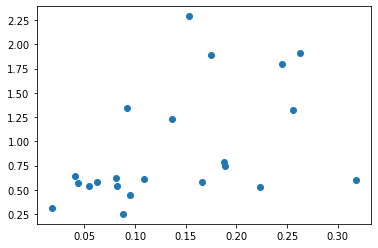

In [28]:
%matplotlib inline
plt.scatter(UMAP_DIS, PCA_DIS);

In [29]:
comb_label = y_1 + y_2

LABEL_SCORES_COMB = []
for label in unq_labels:
    label_score = []
    for i in range(100):
        tmp_batch = comb_shap_values[np.array(comb_label) == label, :]
        
        tmp_batch1_shap = tmp_batch[np.random.randint(0, tmp_batch.shape[0],int(tmp_batch.shape[0]/2)),:]
        tmp_batch2_shap = tmp_batch[np.random.randint(0, tmp_batch.shape[0],int(tmp_batch.shape[0]/2)),:]

        tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
        tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)

        score = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
        label_score.append(score)
    LABEL_SCORES_COMB.append(label_score)

In [30]:
mean_perms = []
for scores in LABEL_SCORES_COMB:
    mean_perms.append(np.nanmean(scores))

In [31]:
unq_labels

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26])

In [32]:
SHAP_DIS = []
for label in LBS_TO_USE:
    tmp_batch1_shap = batch1_shap[y_1 == label, :]
    tmp_batch2_shap = batch2_shap[y_2 == label, :]

    tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
    tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)
    
    score = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
    score -= mean_perms[label-1]
    SHAP_DIS.append(score)

<IPython.core.display.Javascript object>


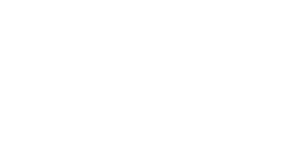

In [33]:
%matplotlib notebook

fig = plt.figure(dpi=150)
ax = fig.add_subplot(projection='3d')


ax.scatter(UMAP_DIS, PCA_DIS, SHAP_DIS)

ax.set_xlabel('UMAP-based score')
ax.set_ylabel('PCA-based score')
ax.set_zlabel('SHAP-based score')

plt.show()

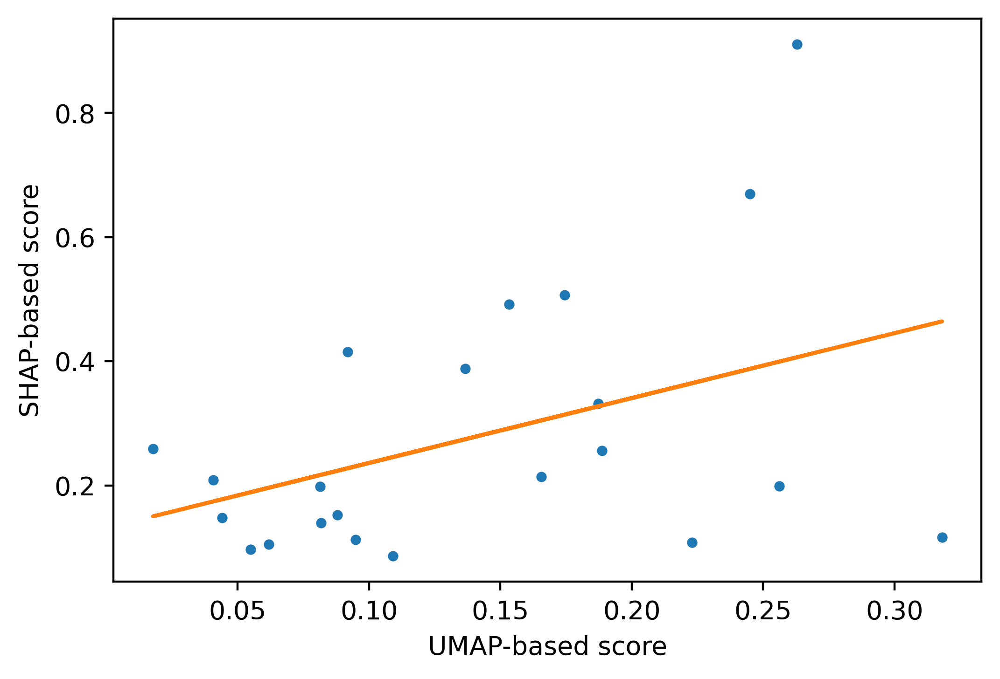

In [34]:
%matplotlib inline

from numpy.polynomial.polynomial import polyfit
plt.figure(dpi=400)
x = np.array(UMAP_DIS)
y = np.array(SHAP_DIS)

b, m = polyfit(x, y, 1)

plt.plot(x, y, '.')
plt.plot(x, b + m * x, '-')
plt.xlabel('UMAP-based score')
plt.ylabel('SHAP-based score')
plt.show()

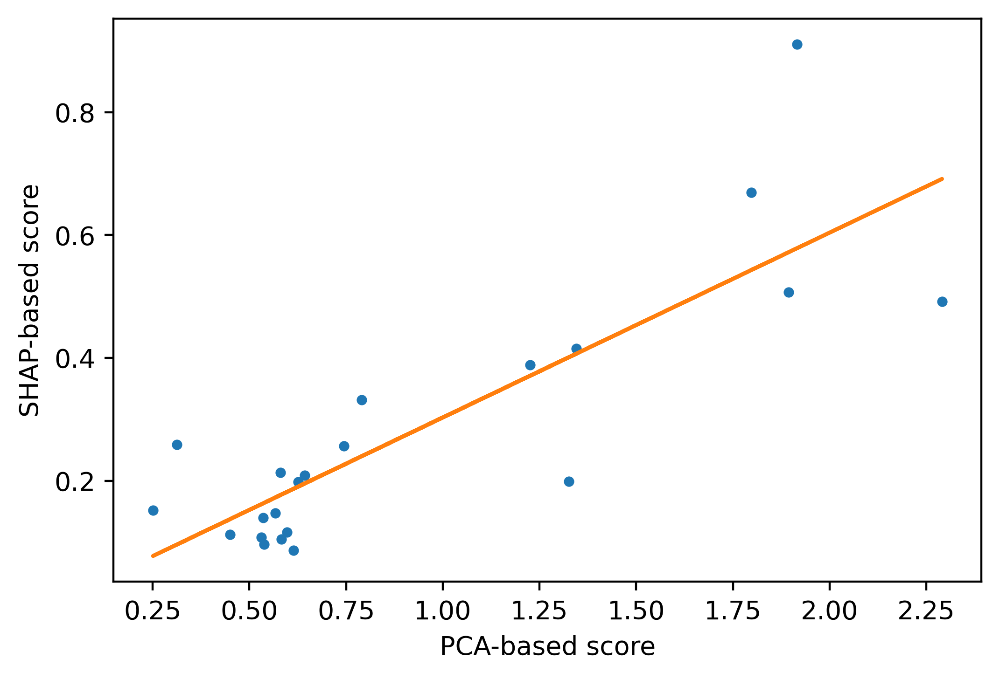

In [35]:
x = np.array(PCA_DIS)
y = np.array(SHAP_DIS)
plt.figure(dpi=400)
b, m = polyfit(x, y, 1)

plt.plot(x, y, '.')
plt.plot(x, b + m * x, '-')
plt.xlabel('PCA-based score')
plt.ylabel('SHAP-based score')
plt.show()

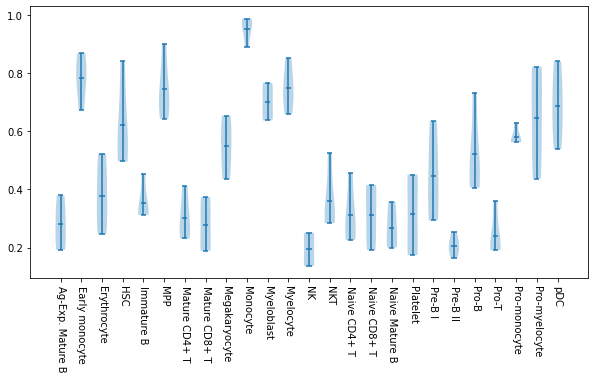

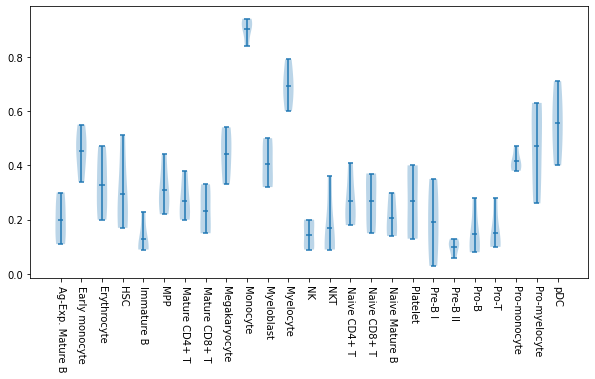

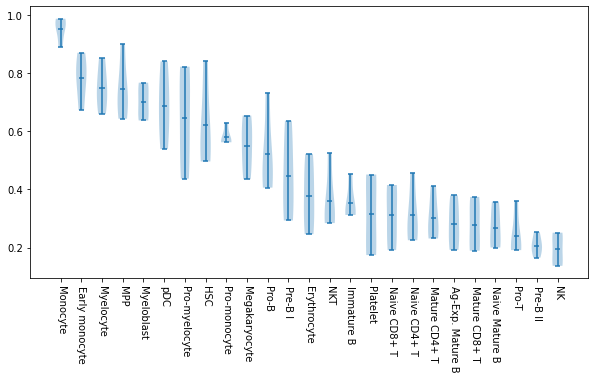

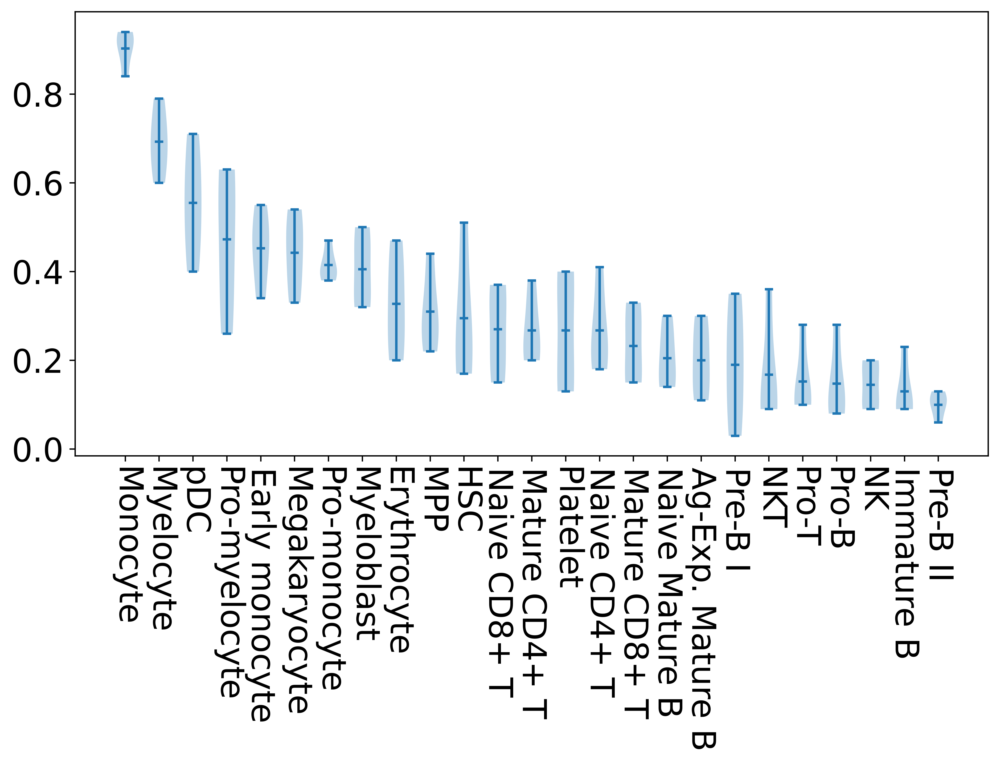

In [41]:
sc1s = []
sc2s = []
for label in np.unique(gmscsf_names):
    if label == 'CMP':
        continue
    idx = np.where(np.array(gmscsf_names) == label)[0]
    sc1 = np.array(gmscsf_scores)[idx]
    sc2 = np.array(gmscsf_scores_cor)[idx]
    sc1 = sc1[np.array([0,1,2,4])]
    sc2 = sc2[np.array([0,1,2,4])]
    sc1s.append(sc1)
    sc2s.append(sc2)

plt.figure(figsize=(10,5))
plt.violinplot(sc1s,showmeans=True)
plt.xticks(np.arange(1,26), np.delete(np.unique(gmscsf_names),1), rotation=270)
plt.show()

plt.figure(figsize=(10,5))
plt.violinplot(sc2s,showmeans=True)
plt.xticks(np.arange(1,26), np.delete(np.unique(gmscsf_names),1), rotation=270)
plt.show()

plt.figure(figsize=(10,5))
plt.violinplot(list(np.array(sc1s)[np.argsort(-1*np.mean(np.array(sc1s),axis=1))]),showmeans=True)
plt.xticks(np.arange(1,26), np.delete(np.unique(gmscsf_names),1)[np.argsort(-1*np.mean(np.array(sc1s),axis=1))], rotation=270)
plt.show()

plt.figure(dpi=500,figsize=(10,5))
plt.violinplot(list(np.array(sc2s)[np.argsort(-1*np.mean(np.array(sc2s),axis=1))]),showmeans=True)
plt.xticks(np.arange(1,26), np.delete(np.unique(gmscsf_names),1)[np.argsort(-1*np.mean(np.array(sc2s),axis=1))], rotation=270, fontsize=20)
plt.yticks(fontsize=20)
plt.show()

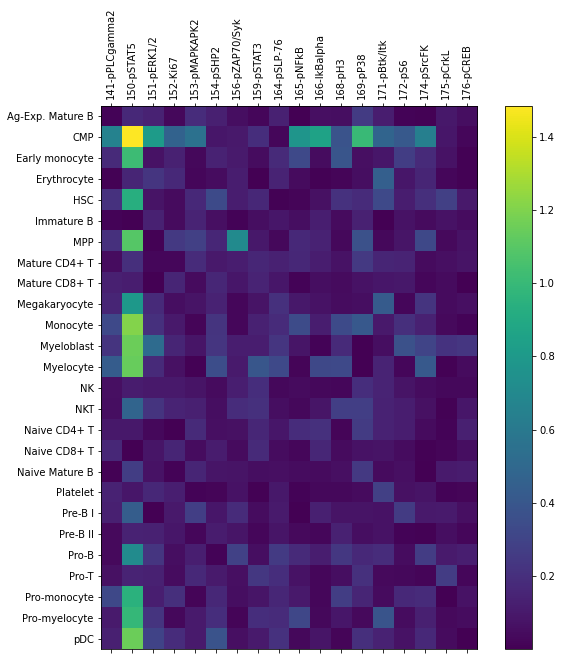

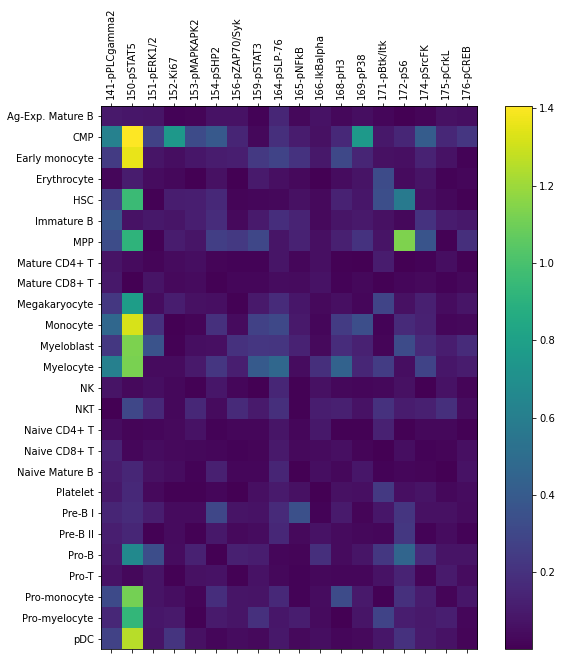

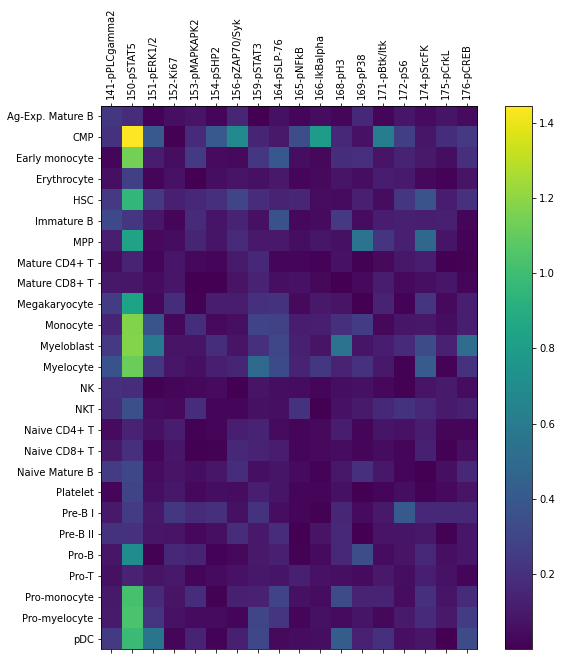

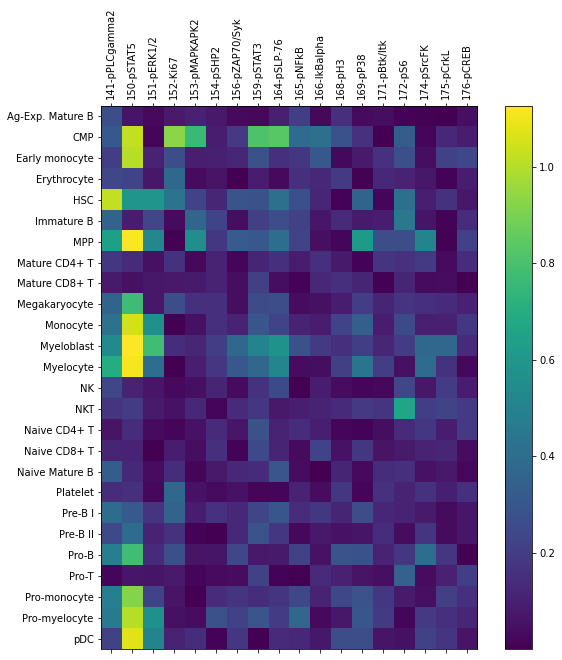

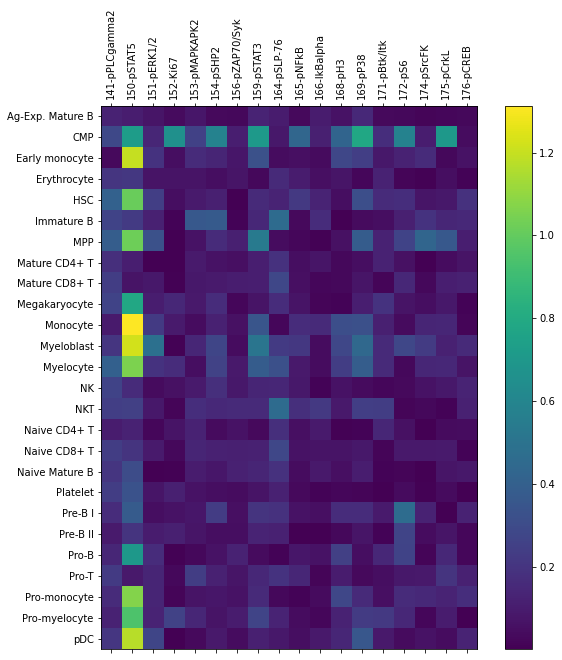

In [37]:
signals = [
     '141-pPLCgamma2',
     '150-pSTAT5',
     '151-pERK1/2',
     '152-Ki67',
     '153-pMAPKAPK2',
     '154-pSHP2',
     '156-pZAP70/Syk',
     '159-pSTAT3',
     '164-pSLP-76',
     '165-pNFkB',
     '166-IkBalpha',
     '168-pH3',
     '169-pP38',
     '171-pBtk/Itk',
     '172-pS6',
     '174-pSrcFK',
     '175-pCrkL',
     '176-pCREB',
]

pd.set_option('display.max_columns', None)  
for i in range(5):
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    cax = ax.matshow(gmscsf_gs2[i][signals], interpolation='nearest')
    fig.colorbar(cax)
    ax.set_xticks(np.arange(0,len(signals)))
    ax.set_xticklabels(signals, rotation='vertical')
    ax.set_yticks(np.arange(0,len(cell_types)))
    ax.set_yticklabels(cell_types)
    plt.show()

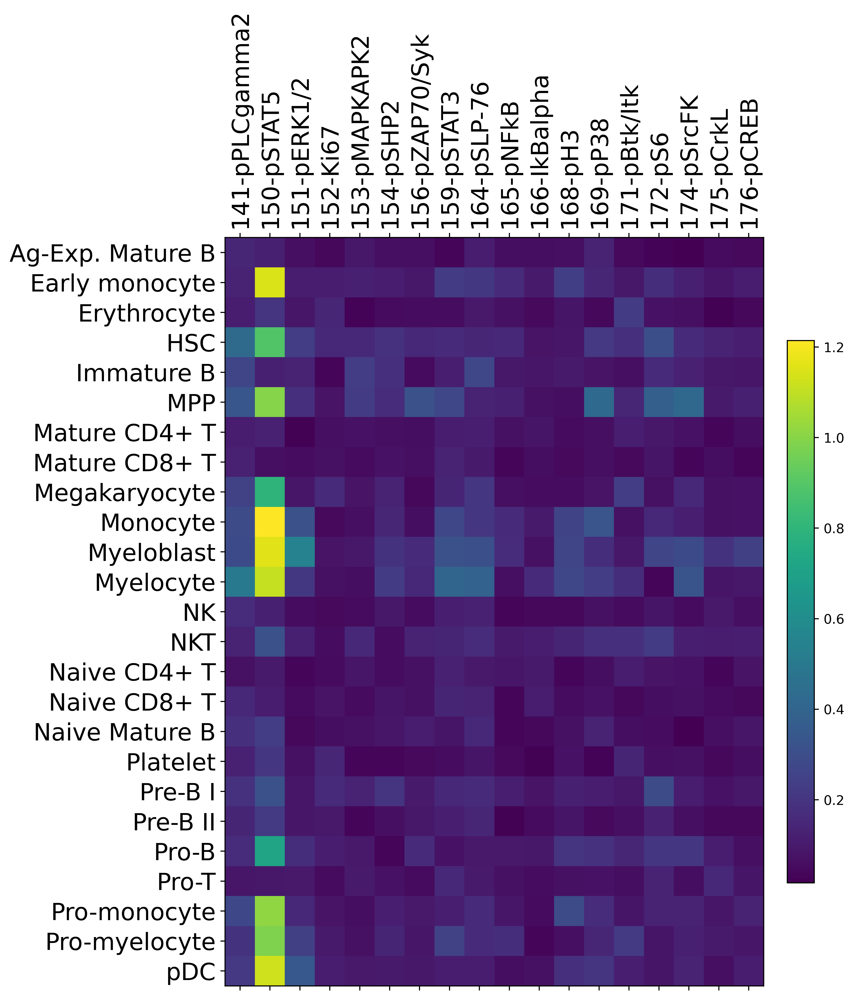

In [40]:
A = []
for i in range(5):
    a = gmscsf_gs2[i][signals]
    A.append(a)
A = np.array(A)
mean_sig = np.mean(A, axis=0)
mean_sig = np.delete(mean_sig, (1), axis=0)

fig = plt.figure(dpi=500,figsize=(8,12))
ax = fig.add_subplot(111)
cax = ax.matshow(mean_sig, interpolation='nearest')
fig.colorbar(cax,fraction=0.046, pad=0.04)
ax.set_xticks(np.arange(0,len(signals)))
ax.set_xticklabels(signals, rotation='vertical',fontsize=18)
ax.set_yticks(np.arange(0,len(cell_types)-1))
ax.set_yticklabels(np.delete(np.unique(gmscsf_names),1),fontsize=18)

plt.show()

In [39]:
stop

NameError: name 'stop' is not defined

## TNFa

SPADE/files_Bendall_et_al/CyTOF54_Tube01_Day1_Unstim1_curated.fcs_eventnum_Ungated_Jnstim1_Day1_normalized_1_Unstim1_Singlets.fcs.txt
(47458, 69) (42452, 69)
(47458, 37) (42452, 37)
(89910, 37) (89910, 2)
(47458, 37) (42452, 37) 47458 42452 (47458, 2) (42452, 2)


Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
100%|██████████| 26/26 [02:36<00:00,  6.03s/it]:00]        


            cell 0          cell 0 - score          cell 1  \
0         169-pP38        0.10022687856671        167-CD38   
1       139-CD45RA    0.037247912794574733        152-Ki67   
2         147-CD20    0.030047980142634045       160-CD123   
3          146-CD8     0.02002920098621458        158-CD33   
4      110_114-CD3    0.016174781669240357        169-pP38   
5     171-pBtk/Itk    0.008859543769913478      174-pSrcFK   
6         158-CD33    0.007820573727294666        115-CD45   
7        160-CD123    0.007463937580875546      159-pSTAT3   
8         142-CD19    0.007405495400287121        148-CD34   
9        144-CD11b    0.005764731030728498      139-CD45RA   
10        167-CD38     0.00538382428791323         145-CD4   
11        115-CD45    0.004141424393286464        142-CD19   
12         112-CD3    0.004020191216534741       176-pCREB   
13      174-pSrcFK   0.0037463489328088337         111-CD3   
14      150-pSTAT5   0.0036992614452035014       144-CD11b   
15     1

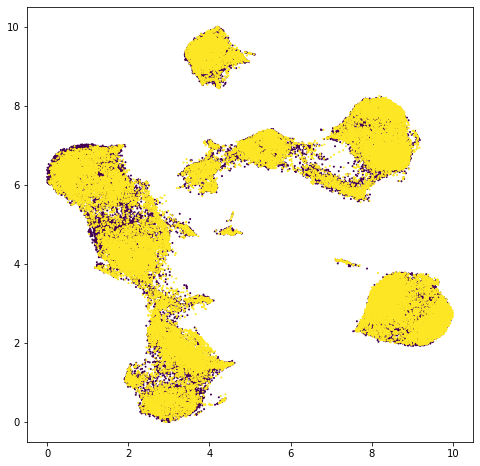

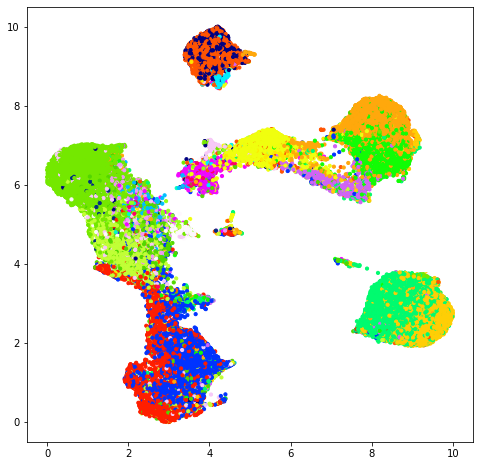

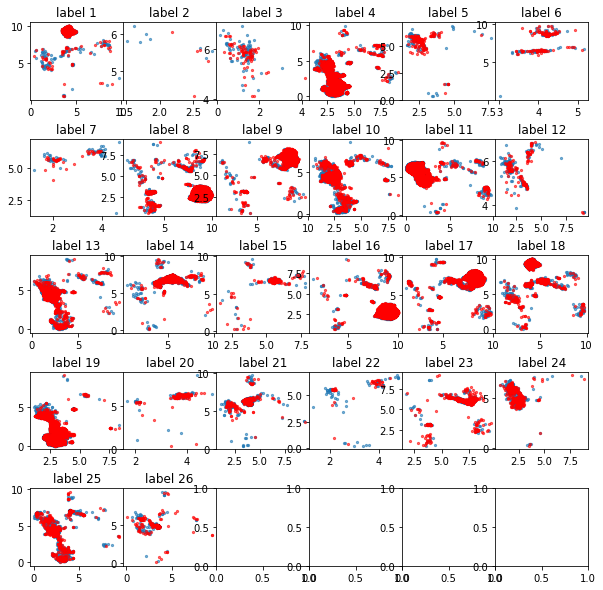

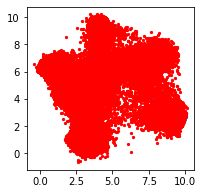

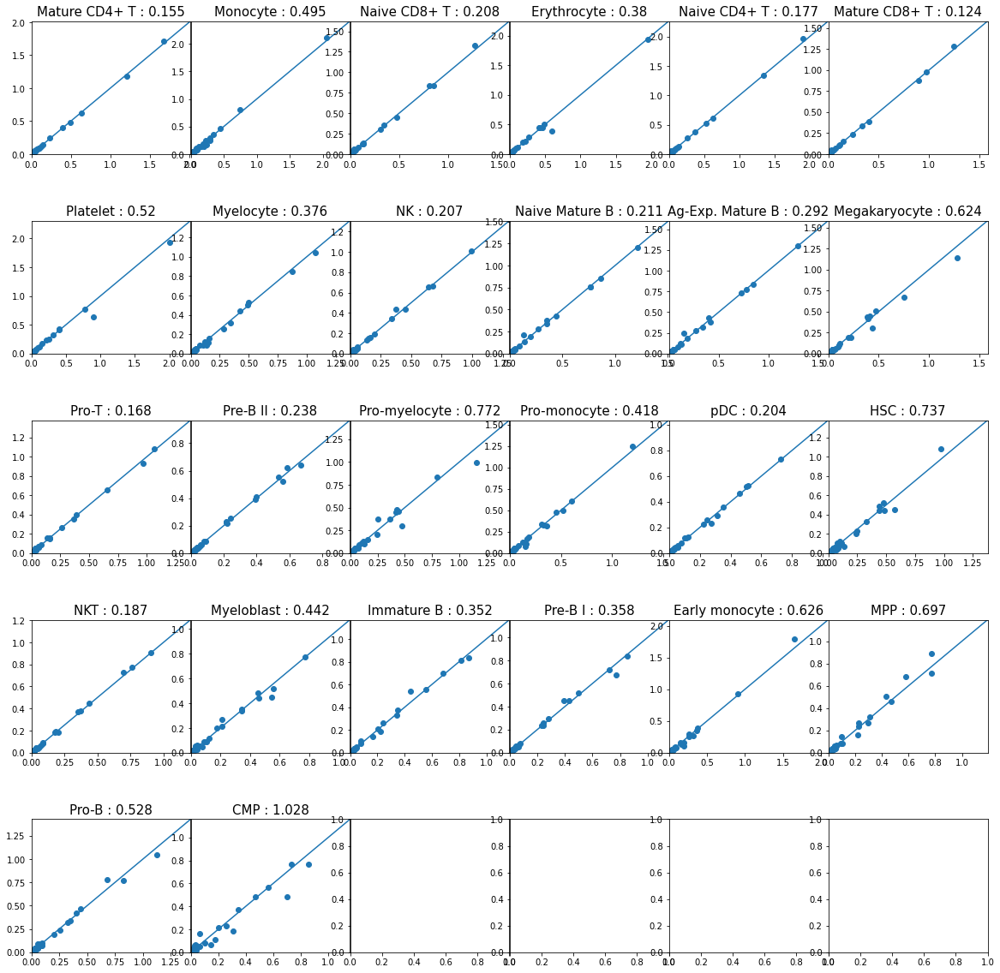

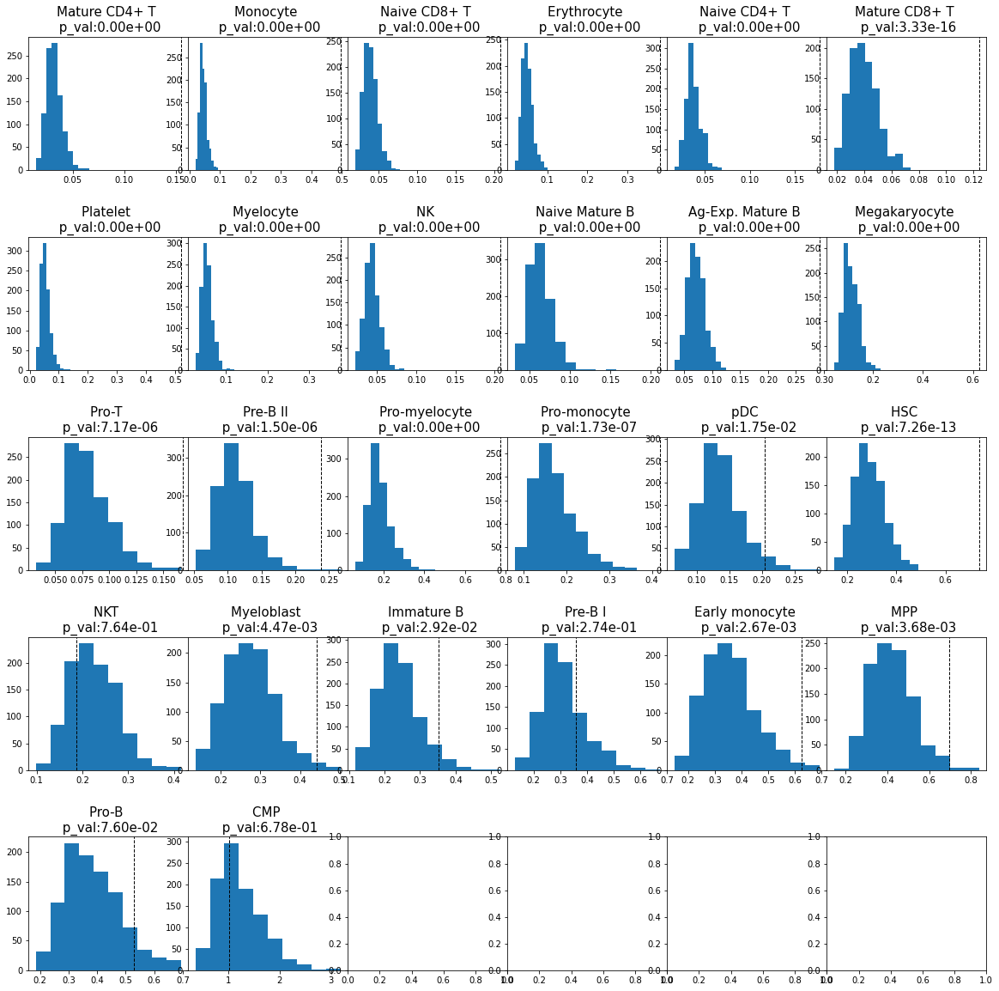

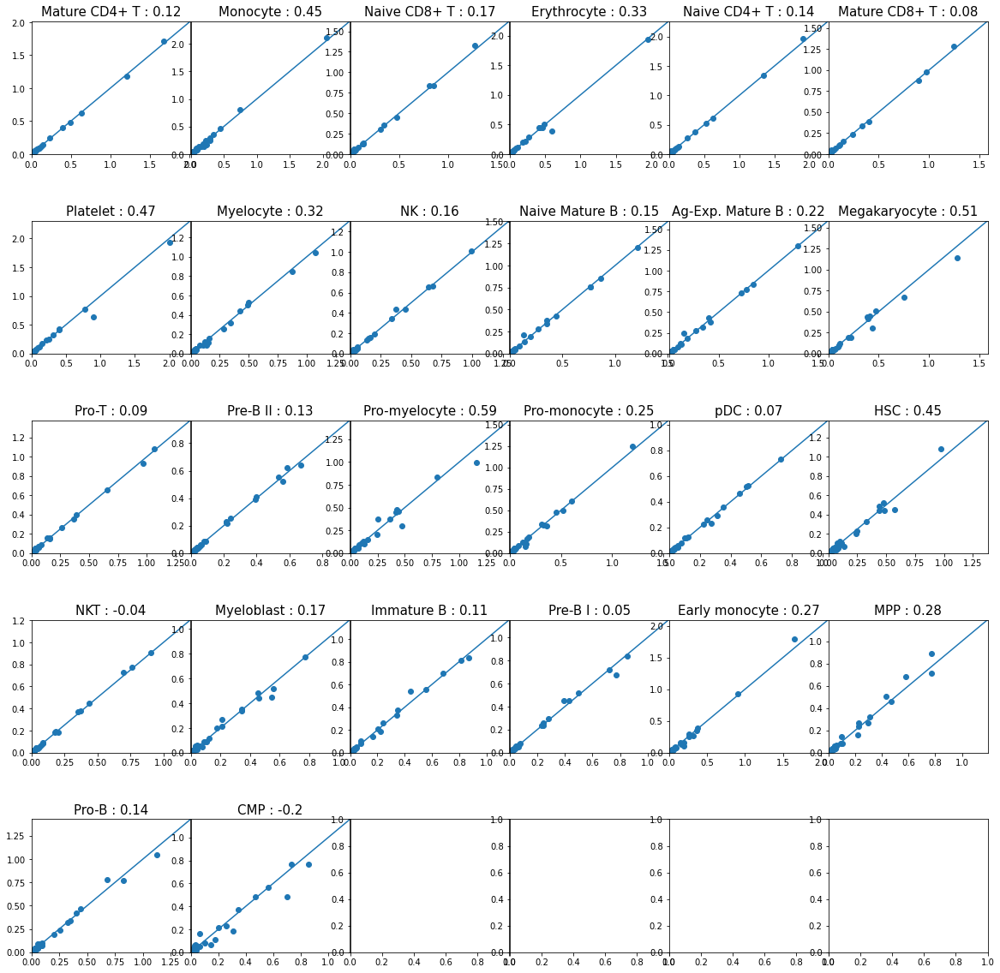

SPADE/files_Bendall_et_al/CyTOF54_Tube02_Day1_Unstim2_curated.fcs_eventnum_Ungated_Unstim2_Day1_normalized_2_Unstim2_Singlets.fcs.txt
(47458, 69) (49108, 69)
(47458, 37) (49108, 37)
(96566, 37) (96566, 2)
(47458, 37) (49108, 37) 47458 49108 (47458, 2) (49108, 2)


Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
100%|██████████| 26/26 [02:45<00:00,  6.38s/it]:00]        


            cell 0          cell 0 - score          cell 1  \
0      110_114-CD3     0.07802190501487671        167-CD38   
1       139-CD45RA     0.05987468894702419        115-CD45   
2         169-pP38      0.0552487073971987     110_114-CD3   
3         147-CD20     0.04354575720326198      174-pSrcFK   
4         142-CD19     0.04031152987059883        152-Ki67   
5         158-CD33     0.03432326607035335       160-CD123   
6          145-CD4     0.03353956118323631         168-pH3   
7         115-CD45     0.03048590550278485         146-CD8   
8   141-pPLCgamma2    0.017395548003293515        169-pP38   
9        160-CD123    0.015367781430755983         145-CD4   
10    171-pBtk/Itk    0.012157066032474295      139-CD45RA   
11        167-CD38    0.010164470578597054      159-pSTAT3   
12      174-pSrcFK    0.006113581019609904        148-CD34   
13     164-pSLP-76    0.005586109543832894  141-pPLCgamma2   
14         110-CD3    0.005486274125806441       144-CD11b   
15      

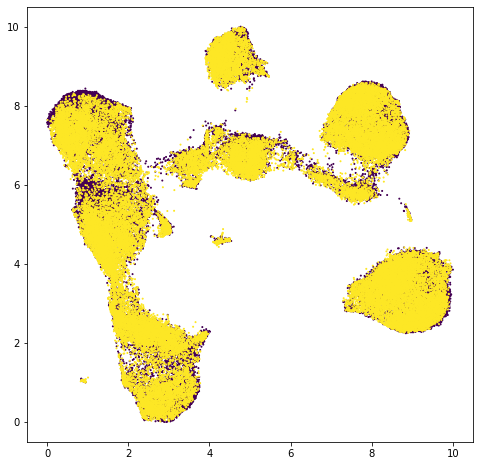

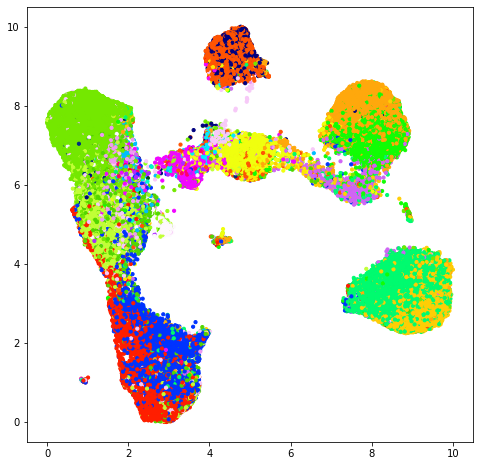

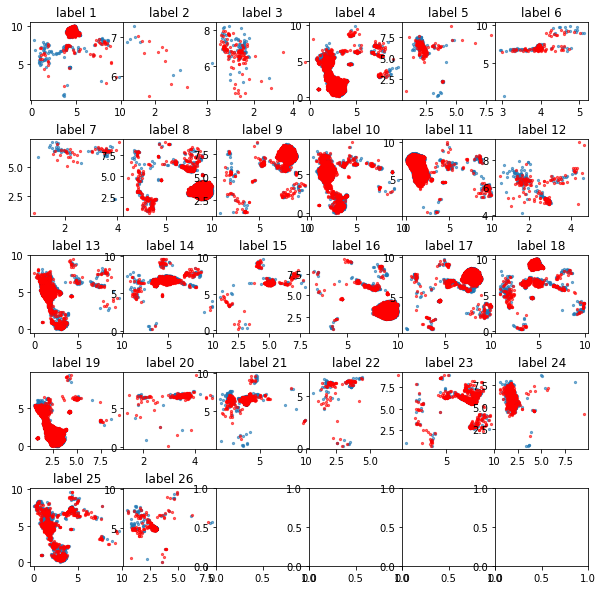

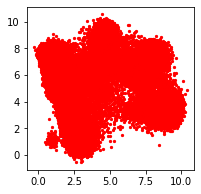

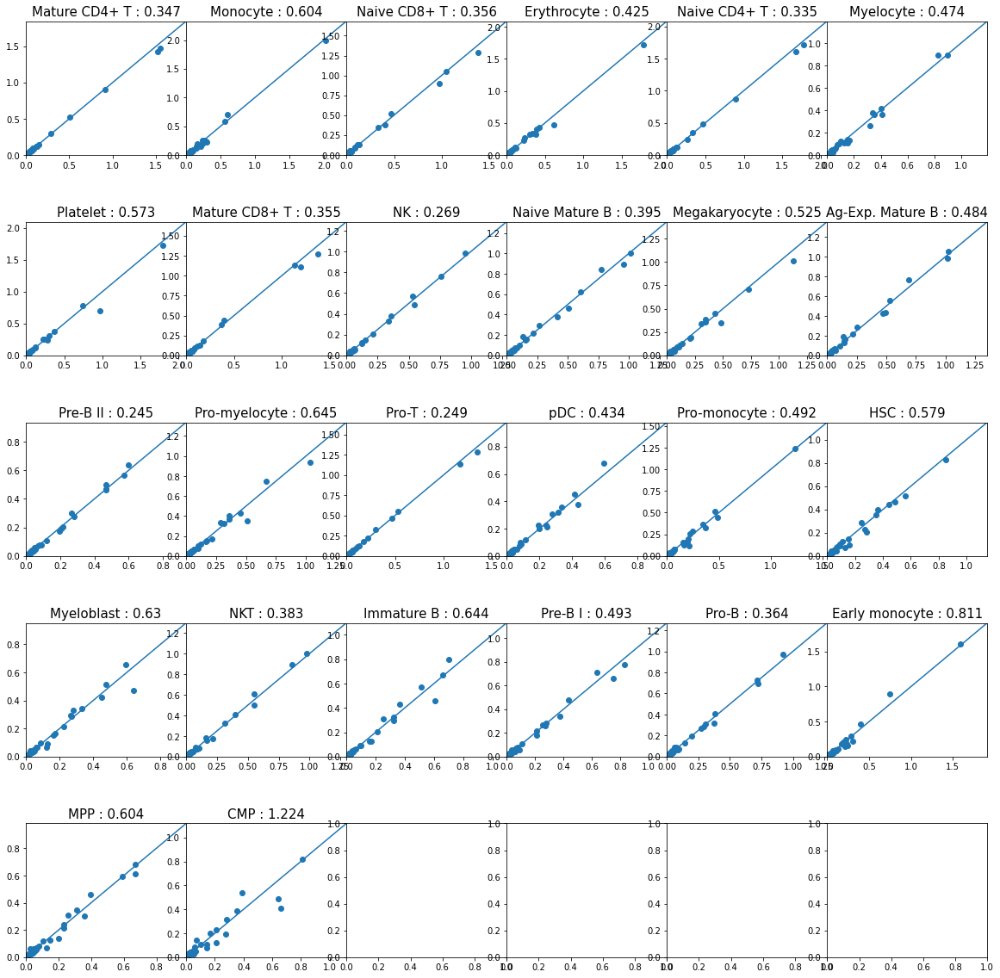

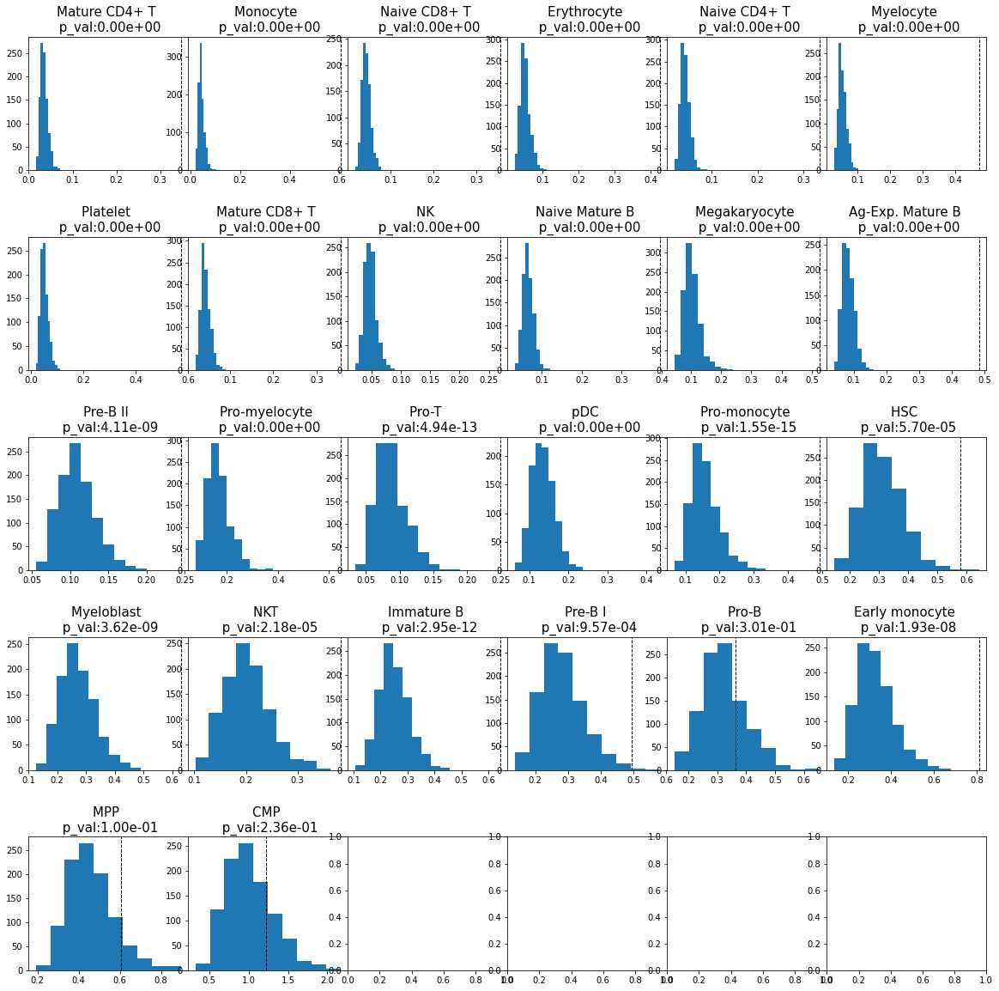

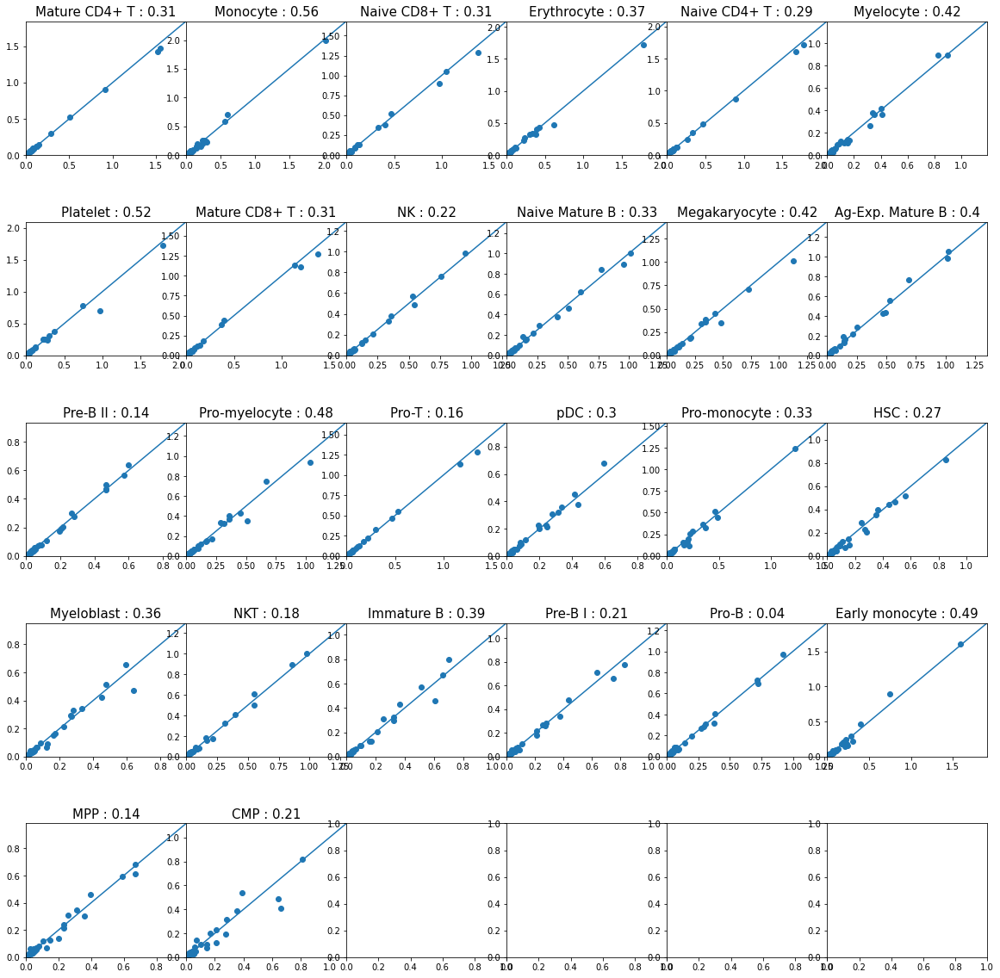

SPADE/files_Bendall_et_al/CyTOF54_Tube03_Day2_Unstim3_curated.fcs_eventnum_Ungated_Unstim3_Day2_normalized_3_Unstim3_Singlets.fcs.txt
(47458, 69) (68727, 69)
(47458, 37) (68727, 37)
(116185, 37) (116185, 2)
(47458, 37) (68727, 37) 47458 68727 (47458, 2) (68727, 2)


Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
100%|██████████| 26/26 [03:18<00:00,  7.65s/it]00:00]        


            cell 0          cell 0 - score          cell 1  \
0       139-CD45RA      0.1462718411884164        167-CD38   
1         169-pP38     0.08163748905742682        158-CD33   
2         142-CD19     0.05289200271241978     110_114-CD3   
3         158-CD33    0.049324549646169474        152-Ki67   
4         115-CD45     0.03778543109125343        169-pP38   
5      110_114-CD3    0.028958862703668875      139-CD45RA   
6         147-CD20    0.026129966306093877         168-pH3   
7        160-CD123     0.02565175992096838         146-CD8   
8   141-pPLCgamma2    0.010976431676545002         145-CD4   
9          145-CD4    0.010393778963664002        148-CD34   
10       144-CD11b    0.009949524761800423      159-pSTAT3   
11       154-pSHP2    0.005991478918880851       176-pCREB   
12        167-CD38   0.0053566616622378466      174-pSrcFK   
13      159-pSTAT3    0.005312181616386406  156-pZAP70/Syk   
14         114-CD3    0.003970762221242444       160-CD123   
15    16

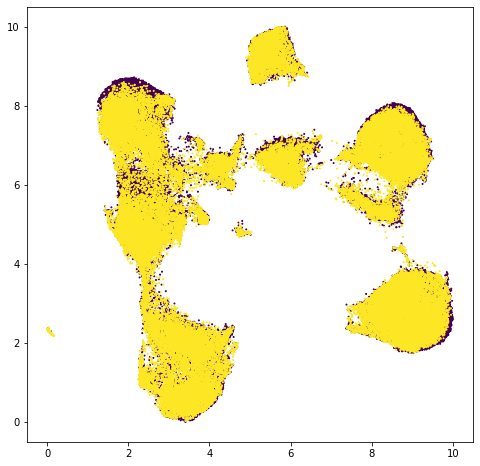

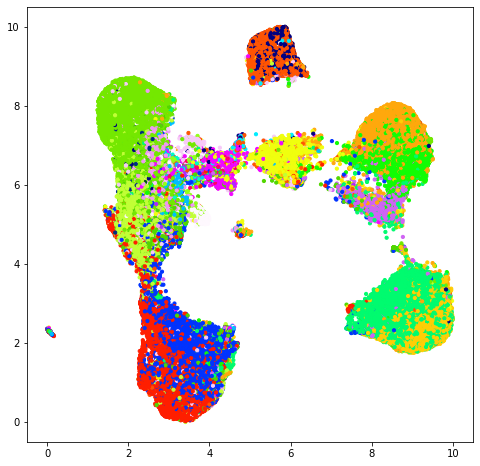

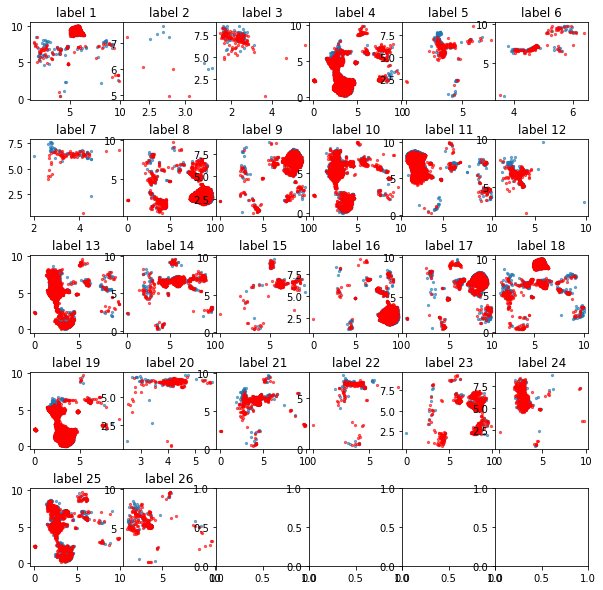

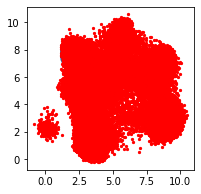

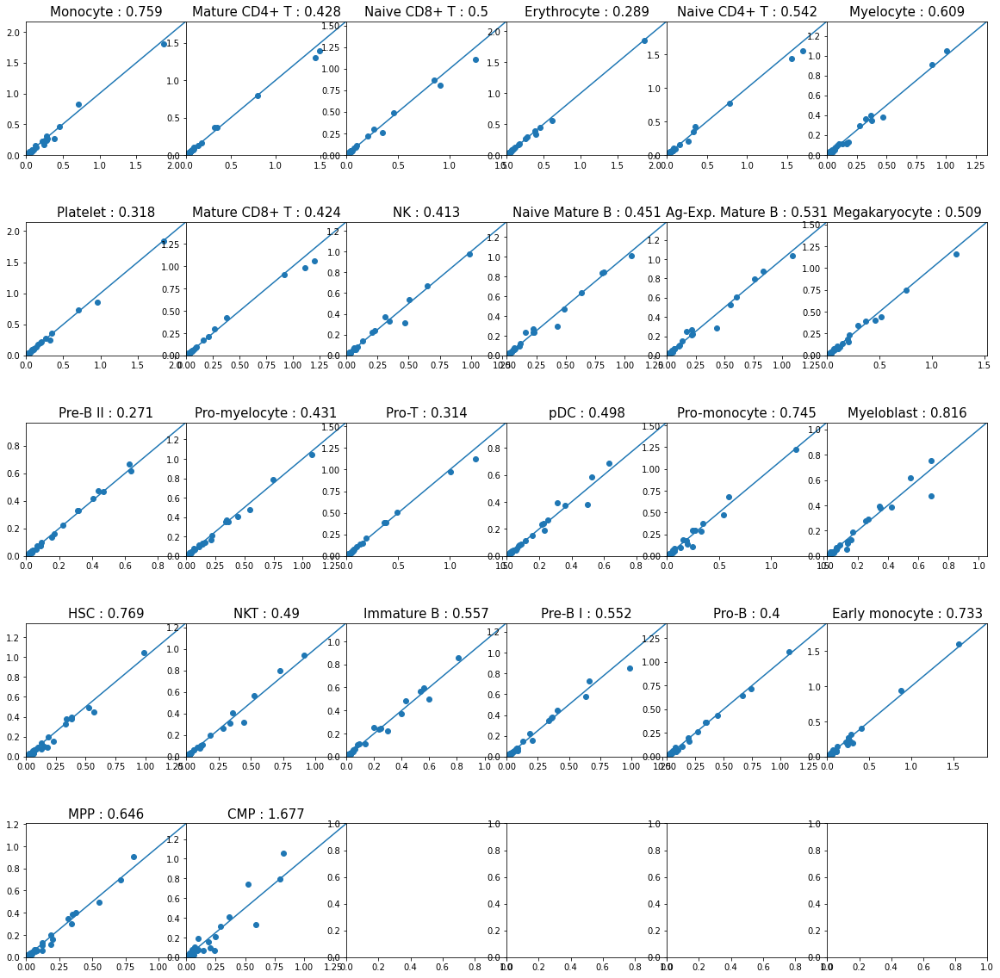

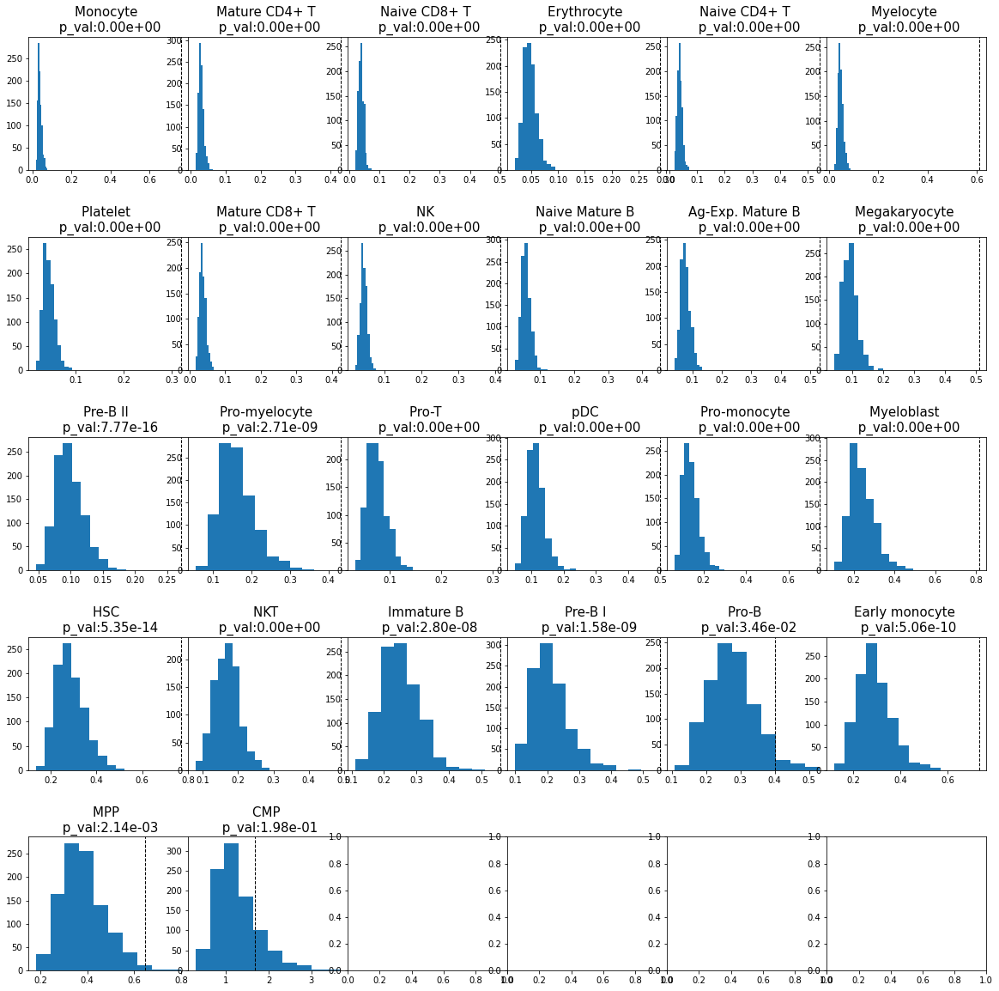

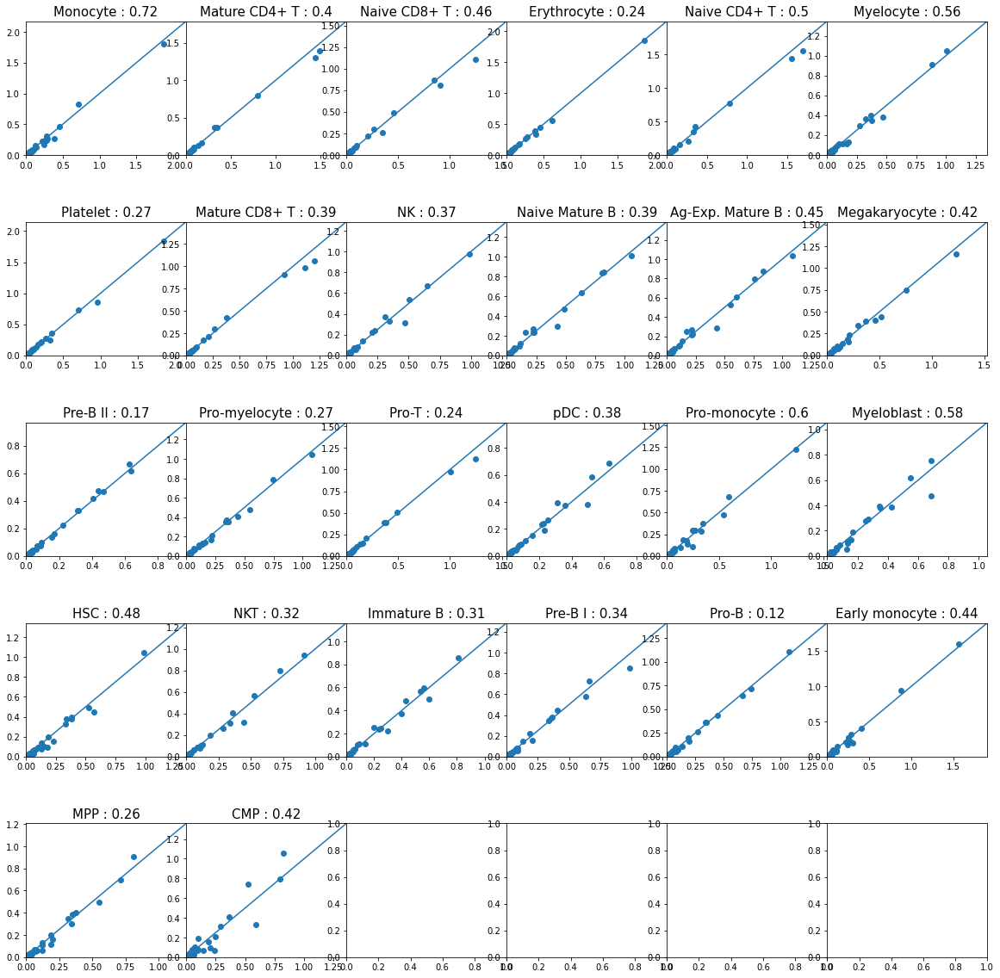

SPADE/files_Bendall_et_al/CyTOF54_Tube04_Day2_Unstim4_curated.fcs_eventnum_Ungated_Unstim4_Day2_normalized_4_Unstim4_Singlets.fcs.txt
(47458, 69) (26588, 69)
(47458, 37) (26588, 37)
(74046, 37) (74046, 2)
(47458, 37) (26588, 37) 47458 26588 (47458, 2) (26588, 2)


Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
100%|██████████| 26/26 [02:05<00:00,  4.84s/it]:00]        


            cell 0          cell 0 - score          cell 1  \
0       139-CD45RA     0.16190746096026404     110_114-CD3   
1      110_114-CD3     0.12108321517038878        115-CD45   
2          193-DNA     0.09764792705208969         168-pH3   
3          191-DNA     0.06205248690531928        167-CD38   
4         158-CD33     0.05582152436421506         145-CD4   
5         167-CD38    0.053074541312659956        158-CD33   
6         147-CD20     0.04323854580225596    171-pBtk/Itk   
7          146-CD8    0.029043609893106948         193-DNA   
8         152-Ki67    0.021007504286462406       176-pCREB   
9          168-pH3    0.012110114608456068         191-DNA   
10  156-pZAP70/Syk    0.011914864284342998      139-CD45RA   
11        169-pP38    0.010153450829789273        152-Ki67   
12      174-pSrcFK    0.008800941229592268       160-CD123   
13        142-CD19     0.00826260339783605        169-pP38   
14    171-pBtk/Itk    0.006971348703249308         114-CD3   
15   153

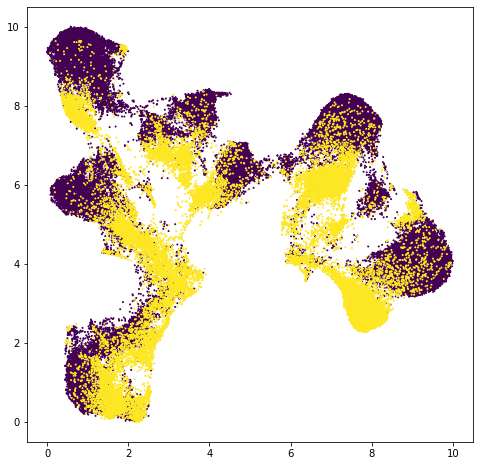

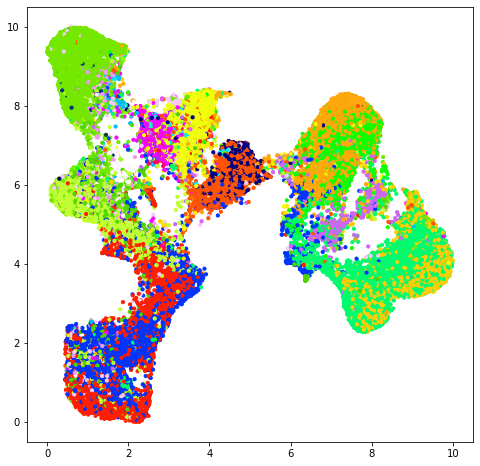

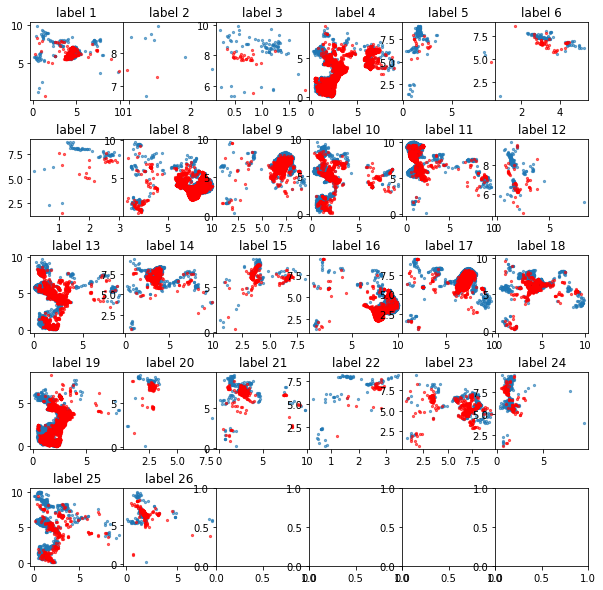

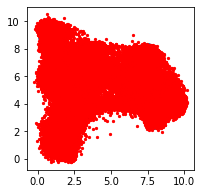

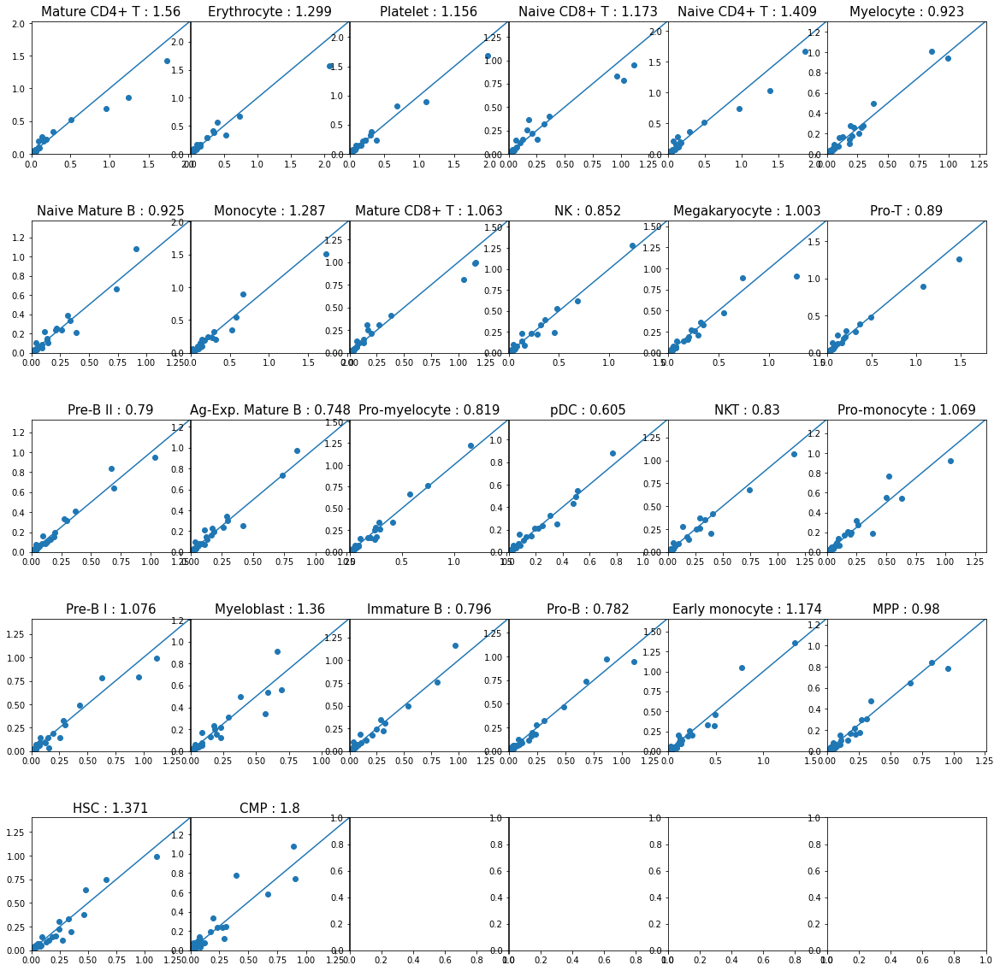

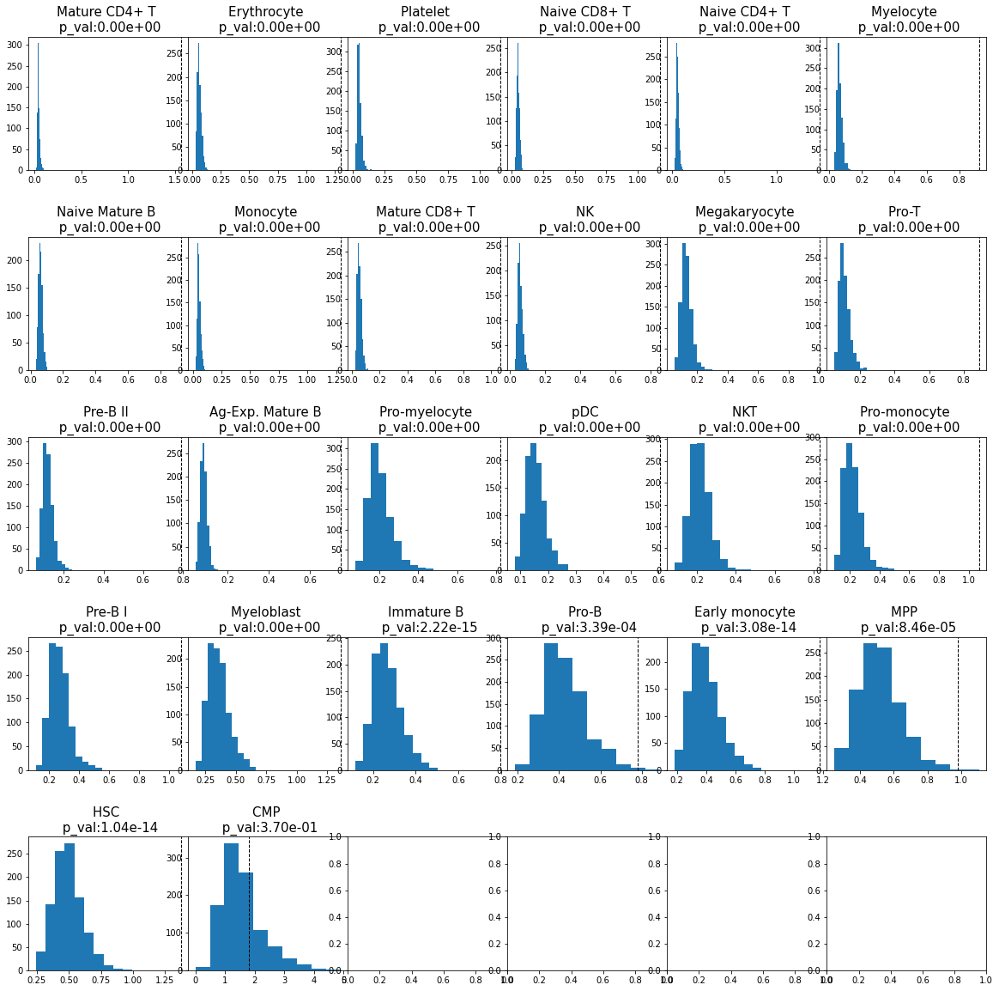

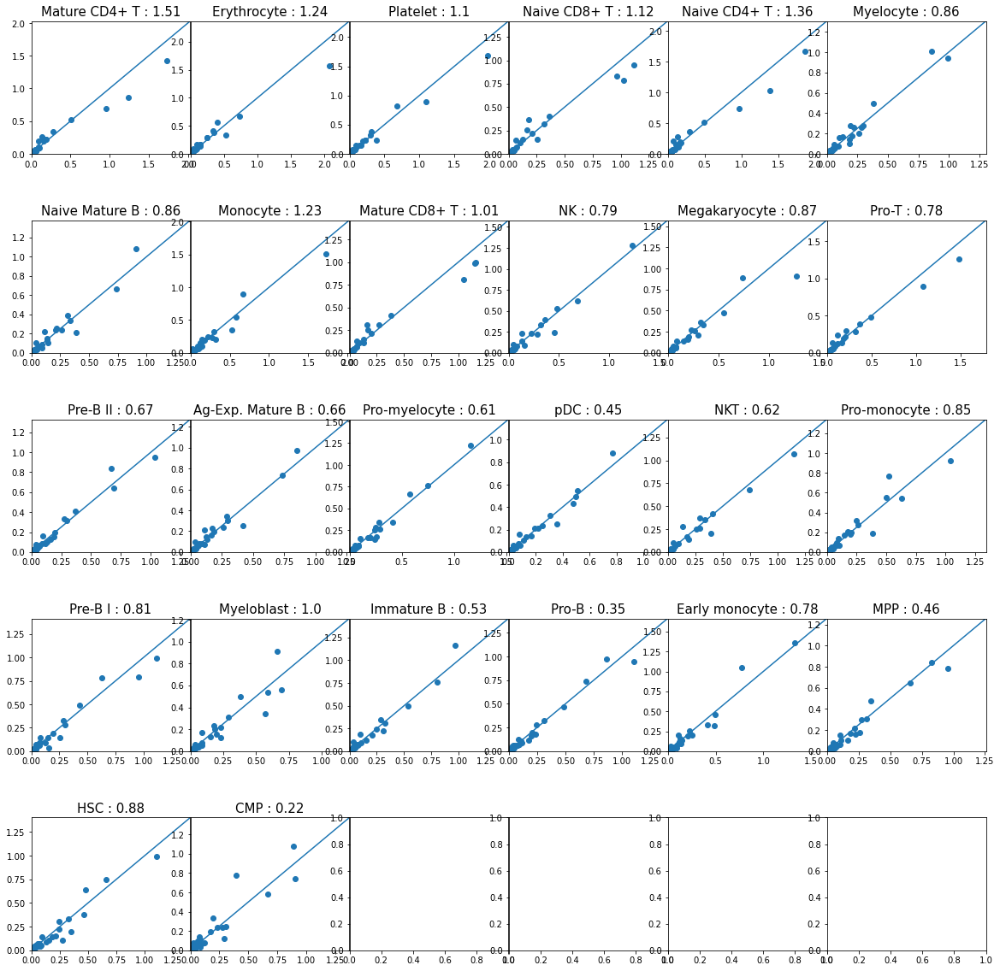

SPADE/files_Bendall_et_al/CyTOF54_Tube05_Day3_Unstim5_curated.fcs_eventnum_Ungated_Unstim5_Day3_normalized_5_Unstim5_Singlets.fcs.txt
(47458, 69) (57771, 69)
(47458, 37) (57771, 37)
(105229, 37) (105229, 2)
(47458, 37) (57771, 37) 47458 57771 (47458, 2) (57771, 2)


Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
100%|██████████| 26/26 [03:12<00:00,  7.39s/it]00:00]        


            cell 0          cell 0 - score          cell 1  \
0       139-CD45RA    0.059604396163030815        158-CD33   
1         169-pP38     0.05843375060838403        167-CD38   
2         158-CD33     0.02125958404831474        169-pP38   
3      110_114-CD3    0.017726286075680386      174-pSrcFK   
4         115-CD45    0.016548218679958482         146-CD8   
5          145-CD4     0.01087758565301572        152-Ki67   
6         167-CD38     0.01032386568071425        115-CD45   
7   141-pPLCgamma2    0.009909671113371238     110_114-CD3   
8         142-CD19    0.007028160550898832        142-CD19   
9          146-CD8    0.006455677132480242    166-IkBalpha   
10        152-Ki67    0.005052343095974243       165-pNFkB   
11  156-pZAP70/Syk     0.00388204767347965         168-pH3   
12       154-pSHP2   0.0033184906330500155        148-CD34   
13      159-pSTAT3   0.0032406248991839956  156-pZAP70/Syk   
14         168-pH3    0.002644582277668124         145-CD4   
15    16

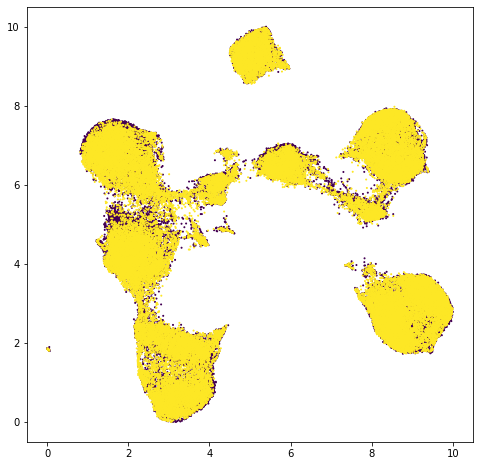

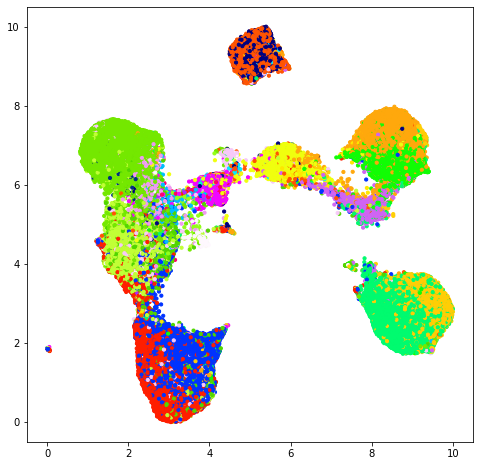

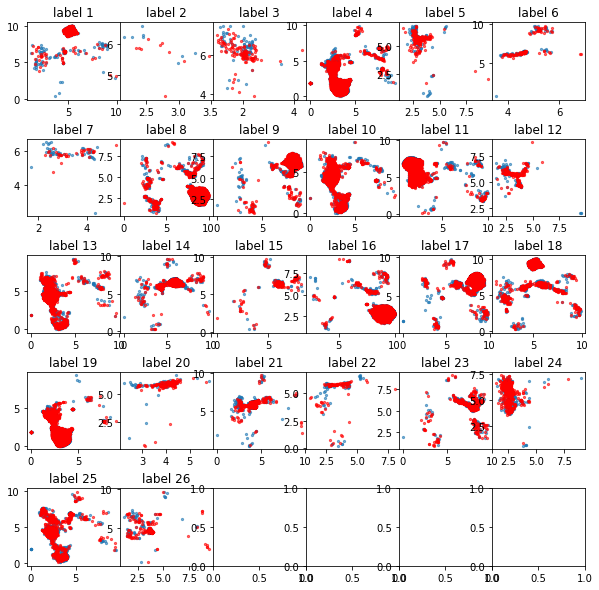

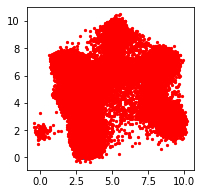

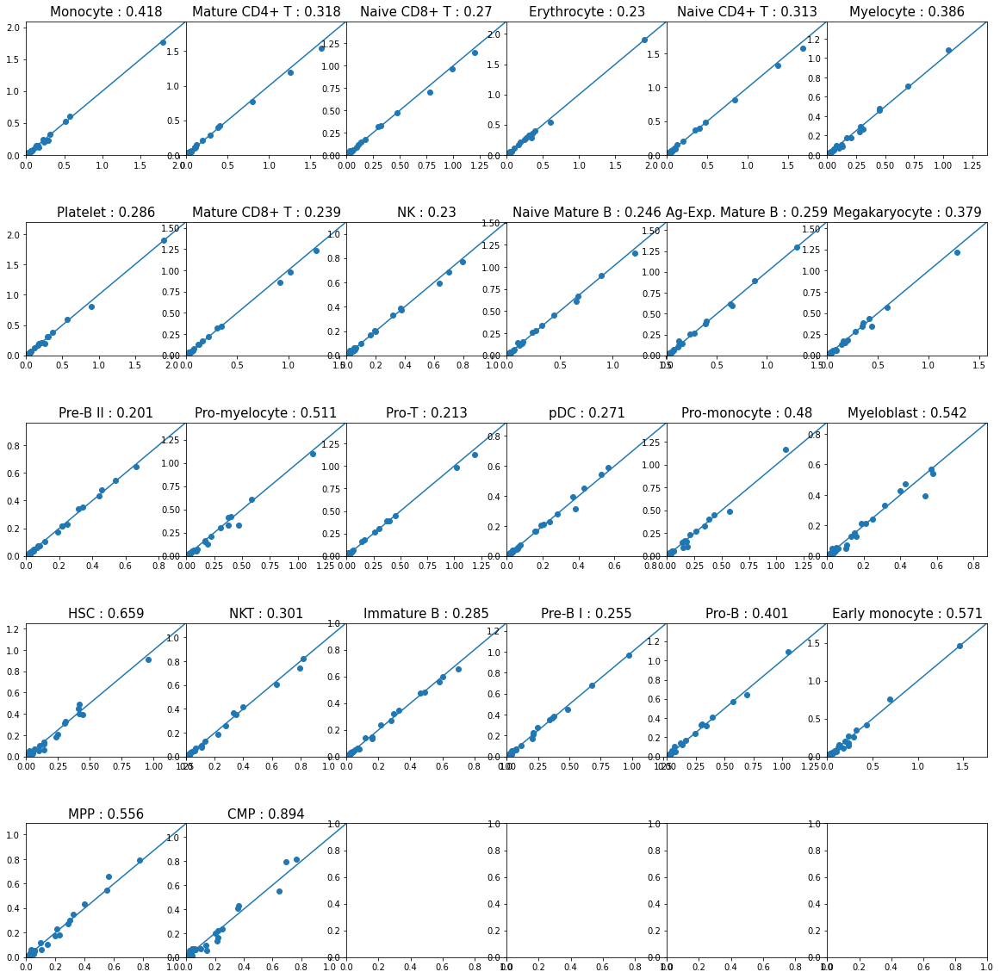

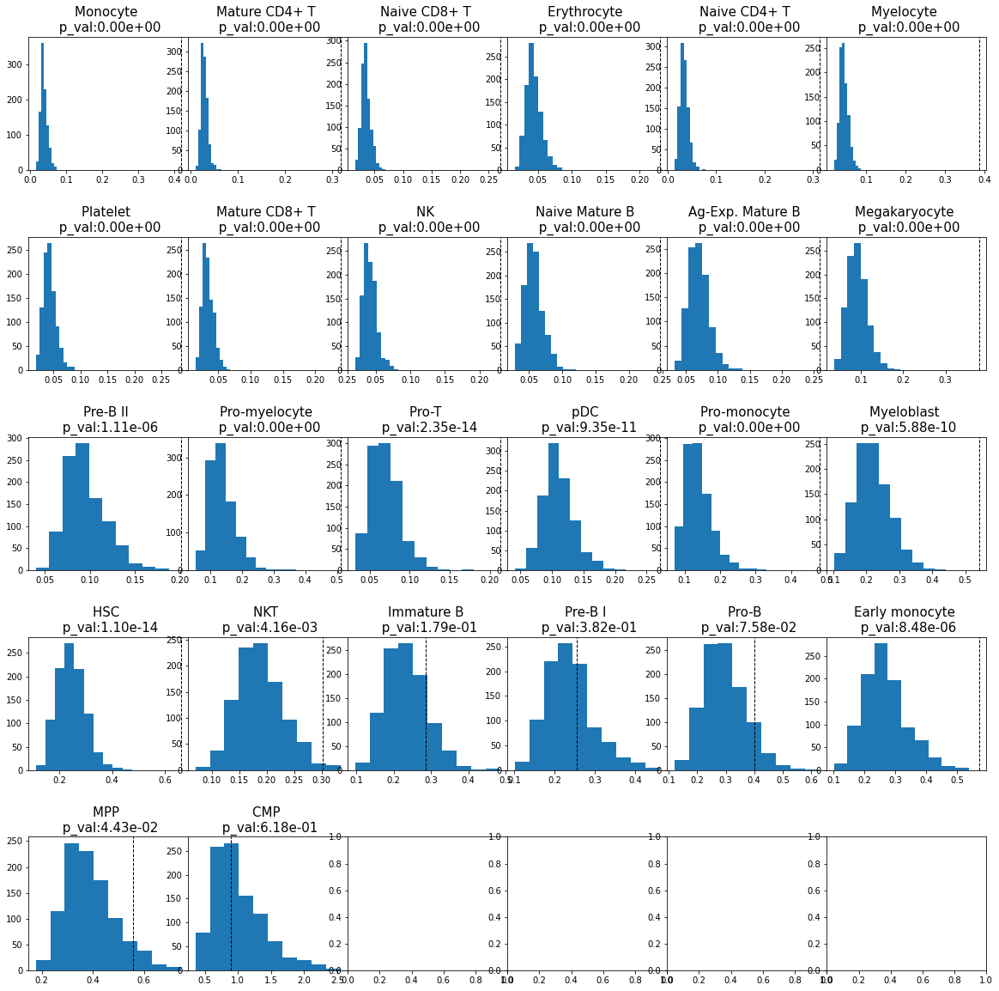

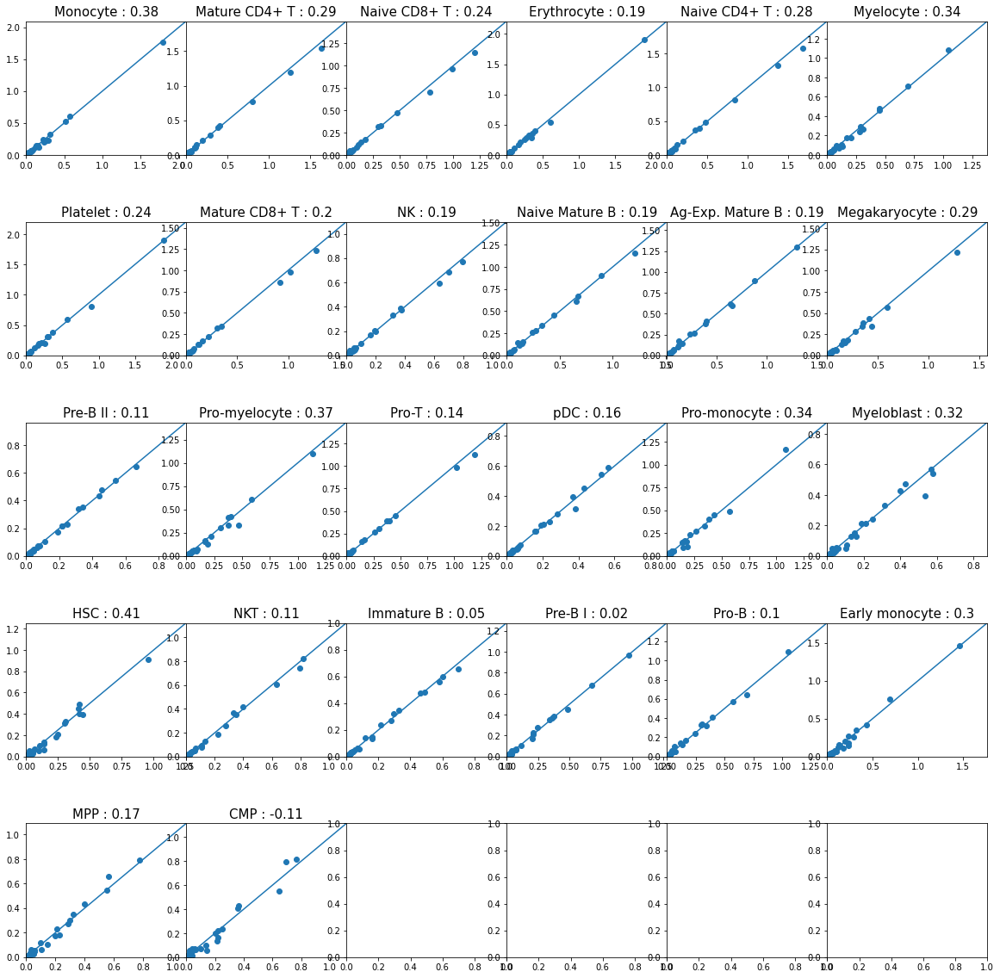

In [45]:
normal_files = [
    'SPADE/files_Bendall_et_al/CyTOF54_Tube01_Day1_Unstim1_curated.fcs_eventnum_Ungated_Jnstim1_Day1_normalized_1_Unstim1_Singlets.fcs.txt',
    'SPADE/files_Bendall_et_al/CyTOF54_Tube02_Day1_Unstim2_curated.fcs_eventnum_Ungated_Unstim2_Day1_normalized_2_Unstim2_Singlets.fcs.txt',
    'SPADE/files_Bendall_et_al/CyTOF54_Tube03_Day2_Unstim3_curated.fcs_eventnum_Ungated_Unstim3_Day2_normalized_3_Unstim3_Singlets.fcs.txt',
    'SPADE/files_Bendall_et_al/CyTOF54_Tube04_Day2_Unstim4_curated.fcs_eventnum_Ungated_Unstim4_Day2_normalized_4_Unstim4_Singlets.fcs.txt',
    'SPADE/files_Bendall_et_al/CyTOF54_Tube05_Day3_Unstim5_curated.fcs_eventnum_Ungated_Unstim5_Day3_normalized_5_Unstim5_Singlets.fcs.txt'
]

stimulated_file = 'SPADE/files_Bendall_et_al/CyTOF54_Tube16_Day1_TNFa_concatv3_curated.fcs_eventnum_Ungated_TNFa_Day1_normalized_16_TNFa_Singlets.fcs.txt'

tnfa_names = []
tnfa_scores = []
tnfa_scores_cor = []
tnfa_gs = []
tnfa_gs2 = []

for normal_file in normal_files:
    print(normal_file)
    df1 = pd.read_csv(stimulated_file,sep="\t", header=0)
    df2 = pd.read_csv(normal_file,sep="\t", header=0)

    df1 = df1.sample(frac=0.2,random_state=0)
    df2 = df2.sample(frac=0.2,random_state=0)
    print(df1.shape, df2.shape)

    label1 = list(df1['cell_type_index'])
    label2 = list(df2['cell_type_index'])
    combined_labels = label1 + label2
    batch_info = [0 for i in range(len(label1))] + [1 for i in range(len(label2))]

    meta = np.array([combined_labels,batch_info]).T

    cell_types = ['Ag-Exp. Mature B',
           'CMP', 'Early monocyte', 'Erythrocyte', 'HSC', 'Immature B', 'MPP',
           'Mature CD4+ T', 'Mature CD8+ T', 'Megakaryocyte', 'Monocyte',
           'Myeloblast', 'Myelocyte', 'NK', 'NKT', 'Naive CD4+ T', 'Naive CD8+ T',
           'Naive Mature B', 'Platelet', 'Pre-B I', 'Pre-B II', 'Pro-B', 'Pro-T',
           'Pro-monocyte', 'Pro-myelocyte', 'pDC']

    #CD: 3, 4, 8, 11b, 19, 20, 33, 34, 38, 45, 45RA, 90, 123
    markers = [ '110-CD3',
     '110_114-CD3',
     '111-CD3',
     '112-CD3',
     '114-CD3',
     '115-CD45',
     '139-CD45RA',
     '141-pPLCgamma2',
     '142-CD19',
     '144-CD11b',
     '145-CD4',
     '146-CD8',
     '147-CD20',
     '148-CD34',
     '150-pSTAT5',
     '151-pERK1/2',
     '152-Ki67',
     '153-pMAPKAPK2',
     '154-pSHP2',
     '156-pZAP70/Syk',
     '158-CD33',
     '159-pSTAT3',
     '160-CD123',
     '164-pSLP-76',
     '165-pNFkB',
     '166-IkBalpha',
     '167-CD38',
     '168-pH3',
     '169-pP38',
     '170-CD90',
     '171-pBtk/Itk',
     '172-pS6',
     '174-pSrcFK',
     '175-pCrkL',
     '176-pCREB',
     '191-DNA',
     '193-DNA']
    
    df1_linege = df1[markers]

    df2_linege = df2[markers]

    print(df1_linege.shape, df2_linege.shape)

    combined_df = pd.concat([df1_linege, df2_linege])
    print(combined_df.shape, meta.shape)

    pca = PCA(n_components=10)
    pca_emb = pca.fit_transform(combined_df)

    reducer = umap.UMAP(random_state=42)
    embedding = reducer.fit_transform(pca_emb)
    #Scaling so that min and max alwasys be 0 and 10 for both x and y axis
    scaler = MinMaxScaler()
    embedding = 10*scaler.fit_transform(embedding)

    plt.figure(figsize=(8,8))
    plt.scatter(embedding[:,0],embedding[:,1],c=meta[:,1],s=1)

    def get_cmap(n, name='gist_ncar'):
        '''Returns a function that maps each index in 0, 1, ..., n-1 to a distinct 
        RGB color; the keyword argument name must be a standard mpl colormap name.'''
        return plt.cm.get_cmap(name, n)

    cmap = get_cmap(len(np.unique(meta[:,0])))
    cmap

    plt.figure(figsize=(8,8))
    plt.scatter(embedding[:,0],embedding[:,1],c=meta[:,0],s=10,cmap=cmap)

#     for i in np.unique(labels):
#         print(cell_types[i-1])

#         cond1 = meta[:,0]==i
#         cond2 = meta[:,1]==0
#         cond3 = meta[:,1]==1

#         cond_d1 = cond1*cond2
#         cond_d2 = cond1*cond3

#         plt.figure(figsize=(6,6))
#         plt.scatter(embedding[:,0],embedding[:,1],c=cond_d1,s=10)
#         plt.show()
#         plt.figure(figsize=(6,6))
#         plt.scatter(embedding[:,0],embedding[:,1],c=cond_d2,s=10)
#         plt.show()
#         print('--------------------------------------------------')

    

    def eval_score_sum(vector1,vector2):
        diff = np.abs(vector1 - vector2)
        score = np.around(np.sum(diff),3)
        return score


    batch1 = df1[markers]
    batch2 = df2[markers]
    y_1 = label1
    y_2 = label2
    emb1 = embedding[meta[:,1]==0,:]
    emb2 = embedding[meta[:,1]==1,:]

    print(batch1.shape, batch2.shape, len(y_1), len(y_2), emb1.shape, emb2.shape)

    Combined = np.vstack((batch1, batch2))
    embedding = np.vstack((emb1, emb2))
    # Initial Visualization per label
    seurat_labels = list(y_1) + list(y_2)
    unq_labels = np.unique(seurat_labels)
    fig, axs = plt.subplots(5,6, figsize=(10, 10), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .5, wspace=.001)

    axs = axs.ravel()

    for label in unq_labels:
        tmp_ctrl=emb1[y_1 == label,:]
        tmp_stim=emb2[y_2 == label,:]

        axs[label-1].scatter(tmp_ctrl[:,0],tmp_ctrl[:,1],s=5,alpha=0.6)
        axs[label-1].scatter(tmp_stim[:,0],tmp_stim[:,1],s=5,alpha=0.6,c='r')
        axs[label-1].set_title('label {}'.format(label))

    # XGBoost
    X = Combined
    y0 = embedding[:,0]

    model_x = XGBRegressor()
    model_x.fit(X, y0)

    predicted_x = model_x.predict(X)

    y1 = embedding[:,1]

    model_y = XGBRegressor()
    model_y.fit(X, y1)
    predicted_y = model_y.predict(X)

    plt.figure(figsize=(3,3))
    plt.scatter(y0,y1,s=10)
    plt.scatter(predicted_x,predicted_y,c='r',s=5)

    # SHAP
    explainer = shap.TreeExplainer(model_x,X)
    shap_value_x = explainer.shap_values(X)
    explainer = shap.TreeExplainer(model_y,X)
    shap_value_y = explainer.shap_values(X)

    comb_shap_values = np.sqrt((shap_value_x**2 + shap_value_y**2))
    batch1_shap = comb_shap_values[:len(y_1),:]
    batch2_shap = comb_shap_values[len(y_1):,:]

    # Analysis
    cell_num = []
    for label in unq_labels:
        a=np.sum(y_1 == label)
        b=np.sum(y_2 == label)
        cell_num.append(min(a,b))

    cell_orders = unq_labels[np.argsort(-1*np.array(cell_num))]

    # Cell-type variation
    fig, axs = plt.subplots(5,6, figsize=(20, 20), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .5, wspace=.001)
    axs = axs.ravel()
    scores_stunst1 = []
    for ct,label in enumerate(cell_orders):
        tmp_batch1_shap = batch1_shap[y_1 == label, :]
        tmp_batch2_shap = batch2_shap[y_2 == label, :]

        tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
        tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)

        score = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
        scores_stunst1.append(score)
        cap = max(np.max(tmp_mean_feature1), np.max(tmp_mean_feature2)) + 0.3
        diag = np.linspace(0,cap)
        axs[ct].scatter(tmp_mean_feature1,tmp_mean_feature2)
        axs[ct].plot(diag,diag)
        axs[ct].set_xlim(0,cap)
        axs[ct].set_ylim(0,cap)
        axs[ct].set_title(cell_types[label-1]+ ' : '  + str(score),fontsize=15)
        
        tnfa_names.append(cell_types[label-1])
        tnfa_scores.append(score)
        

    # Random Variation
    comb_label = list(y_1)+list(y_2)
    LABEL_SCORES_COMB = []
    for label in tqdm(cell_orders):
        label_score = []
        for i in range(1000):

            tmp_batch = comb_shap_values[np.array(comb_label) == label, :]

            tmp_batch1_shap = tmp_batch[np.random.randint(0, tmp_batch.shape[0],int(tmp_batch.shape[0]/2)),:]
            tmp_batch2_shap = tmp_batch[np.random.randint(0, tmp_batch.shape[0],int(tmp_batch.shape[0]/2)),:]

            tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
            tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)

            score = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
            label_score.append(score)
        LABEL_SCORES_COMB.append(label_score)



    # Showing the variation with cell-specific scores 
    ct = 0
    fig, axs = plt.subplots(5,6, figsize=(20, 20), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .5, wspace=.001)
    axs = axs.ravel()

    for scores in LABEL_SCORES_COMB:
        axs[ct].hist(scores)
        tmp = scores + [scores_stunst1[ct]]
        zscores = stats.zscore(tmp)
        p_values = 1 - scipy.special.ndtr(zscores)
        axs[ct].set_title('{} \n p_val:{}'.format(cell_types[cell_orders[ct]-1],'{:.2e}'.format(p_values[-1])),fontsize=15)
        axs[ct].axvline(scores_stunst1[ct], color='k', linestyle='dashed', linewidth=1)
        ct += 1

    mean_perms = []
    for scores in LABEL_SCORES_COMB:
        mean_perms.append(np.nanmean(scores))

    # Cell-type variation random-perm corrected
    fig, axs = plt.subplots(5,6, figsize=(20, 20), facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = .5, wspace=.001)
    axs = axs.ravel()
    scores_stunst1 = []
    for ct,label in enumerate(cell_orders):
        tmp_batch1_shap = batch1_shap[y_1 == label, :]
        tmp_batch2_shap = batch2_shap[y_2 == label, :]

        tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
        tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)

        score = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
        scores_stunst1.append(score)
        cap = max(np.max(tmp_mean_feature1), np.max(tmp_mean_feature2)) + 0.3
        diag = np.linspace(0,cap)
        axs[ct].scatter(tmp_mean_feature1,tmp_mean_feature2)
        axs[ct].plot(diag,diag)
        axs[ct].set_xlim(0,cap)
        axs[ct].set_ylim(0,cap)
        axs[ct].set_title(cell_types[label-1]+ ' : '  + str(np.round(score-mean_perms[ct],2)),fontsize=15)
        
        tnfa_scores_cor.append(np.round(score-mean_perms[ct],2))

    # Featuer Scores 
    feature_names = markers
    scores = []
    gene_ranks = []
    gene_ranks_pd = []
    gene_ranks_scores = []
    GENE_SCORES = []
    GENE_SCORES2 = []
    for label in unq_labels:
        tmp_batch1_shap = batch1_shap[y_1 == label, :]
        tmp_batch2_shap = batch2_shap[y_2 == label, :]
        tmp_combined_shap = np.vstack((tmp_batch1_shap,tmp_batch2_shap))

        tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
        tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)
        diag = np.linspace(0,np.max(np.concatenate([tmp_mean_feature1, tmp_mean_feature2])))

        score_by_feat = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
        scores.append(score_by_feat)
        gene_scores = np.abs(tmp_mean_feature1 - tmp_mean_feature2)
        gene_scores2 = (np.abs(tmp_mean_feature1 - tmp_mean_feature2)) / ((tmp_mean_feature1 + tmp_mean_feature2)/2)
        GENE_SCORES.append(gene_scores)
        GENE_SCORES2.append(gene_scores2)
        
        gene_ranks_pd.append(np.array(feature_names)[np.argsort(-1*(np.abs(tmp_mean_feature1 - tmp_mean_feature2)))])
        gene_ranks_scores.append(gene_scores[np.argsort(-1*(np.abs(tmp_mean_feature1 - tmp_mean_feature2)))])
        gene_ranks.append(np.array(feature_names)[np.argsort(np.abs(tmp_mean_feature1 - tmp_mean_feature2))])

    GS = pd.DataFrame(GENE_SCORES,columns=feature_names)
    GS.index = cell_types
    tnfa_gs.append(GS)
    
    GS2 = pd.DataFrame(GENE_SCORES2,columns=feature_names)
    GS2.index = cell_types
    tnfa_gs2.append(GS2)

    gene_meta_ranks = []
    for gene in feature_names:
        gene_loc = []
        for rank in gene_ranks:
            gene_loc.append(np.where(rank == gene)[0][0])
        gene_meta_ranks.append(gene_loc)
    gene_meta_ranks = np.array(gene_meta_ranks)

    csv = []
    for i in range(len(gene_ranks_pd)):
        csv.append(gene_ranks_pd[i])
        csv.append(gene_ranks_scores[i])

    column_names = []
    for i in range(len(unq_labels)):
        column_names.append('cell {}'.format(i))
        column_names.append('cell {} - score'.format(i))

    diff_genes = pd.DataFrame(np.array(csv).T,columns=column_names)
    print(diff_genes)
    plt.show()

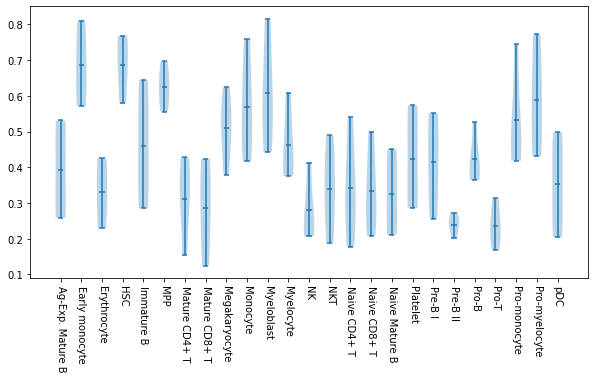

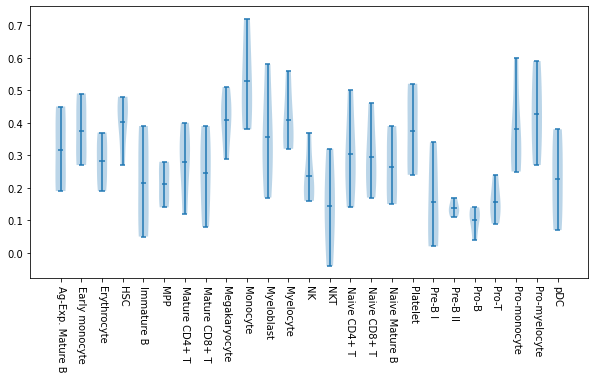

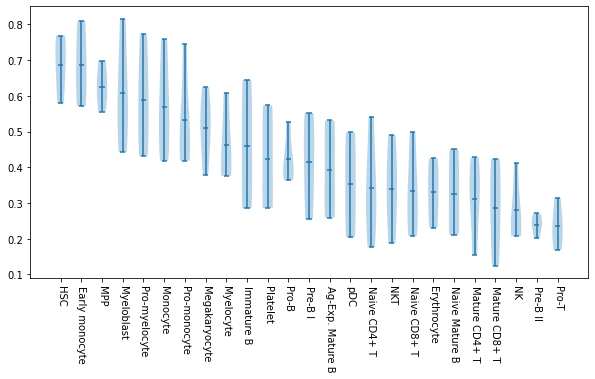

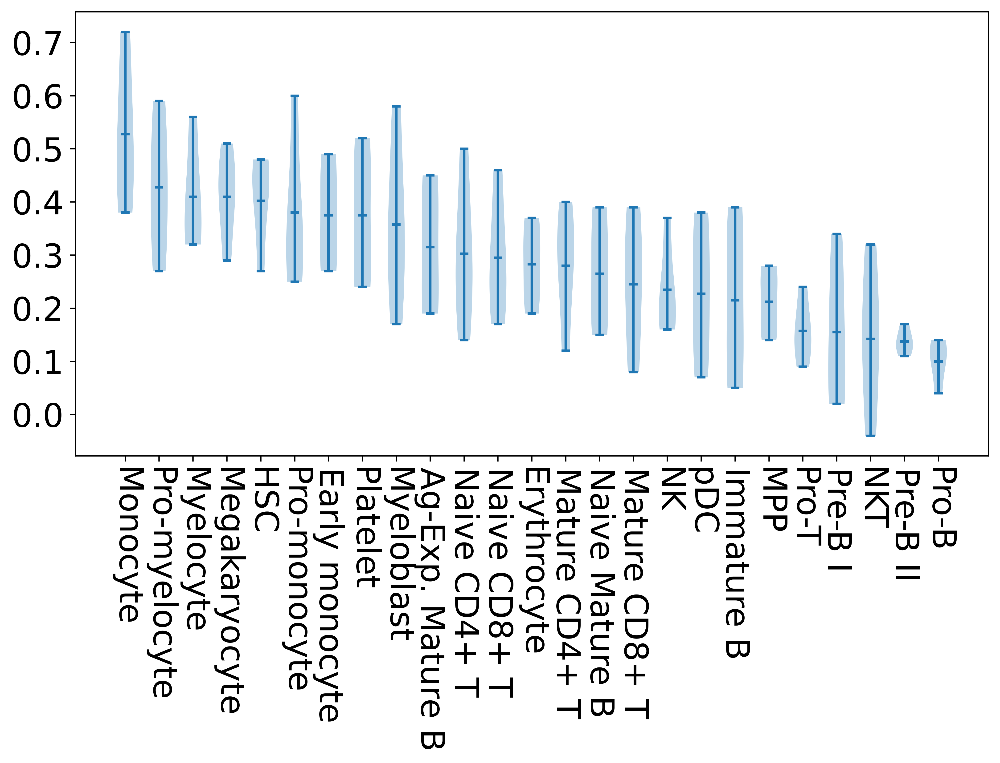

In [49]:
sc1s = []
sc2s = []
for label in np.unique(tnfa_names):
    if label == 'CMP':
        continue
    idx = np.where(np.array(tnfa_names) == label)[0]
    sc1 = np.array(tnfa_scores)[idx]
    sc2 = np.array(tnfa_scores_cor)[idx]
    sc1 = sc1[np.array([0,1,2,4])]
    sc2 = sc2[np.array([0,1,2,4])]
    sc1s.append(sc1)
    sc2s.append(sc2)

plt.figure(figsize=(10,5))
plt.violinplot(sc1s,showmeans=True)
plt.xticks(np.arange(1,26), np.delete(np.unique(tnfa_names),1), rotation=270)
plt.show()

plt.figure(figsize=(10,5))
plt.violinplot(sc2s,showmeans=True)
plt.xticks(np.arange(1,26), np.delete(np.unique(tnfa_names),1), rotation=270)
plt.show()

plt.figure(figsize=(10,5))
plt.violinplot(list(np.array(sc1s)[np.argsort(-1*np.mean(np.array(sc1s),axis=1))]),showmeans=True)
plt.xticks(np.arange(1,26), np.delete(np.unique(tnfa_names),1)[np.argsort(-1*np.mean(np.array(sc1s),axis=1))], rotation=270)
plt.show()

plt.figure(dpi=500,figsize=(10,5))
plt.violinplot(list(np.array(sc2s)[np.argsort(-1*np.mean(np.array(sc2s),axis=1))]),showmeans=True)
plt.xticks(np.arange(1,26), np.delete(np.unique(tnfa_names),1)[np.argsort(-1*np.mean(np.array(sc2s),axis=1))], rotation=270, fontsize=20)
plt.yticks(fontsize=20)
plt.show()

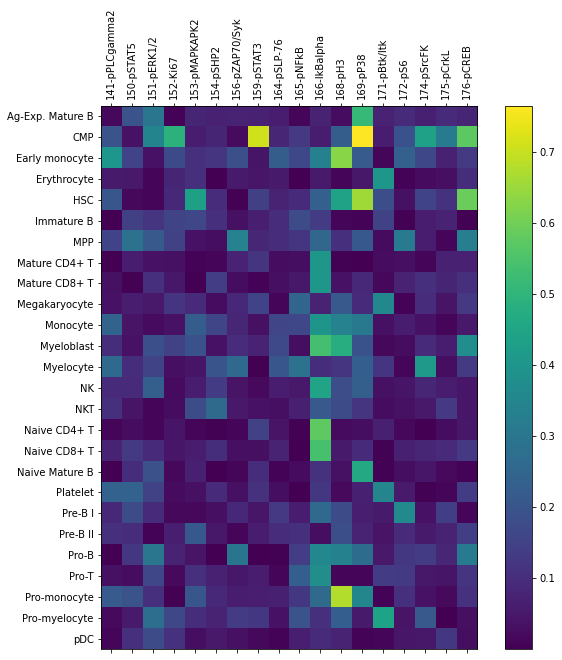

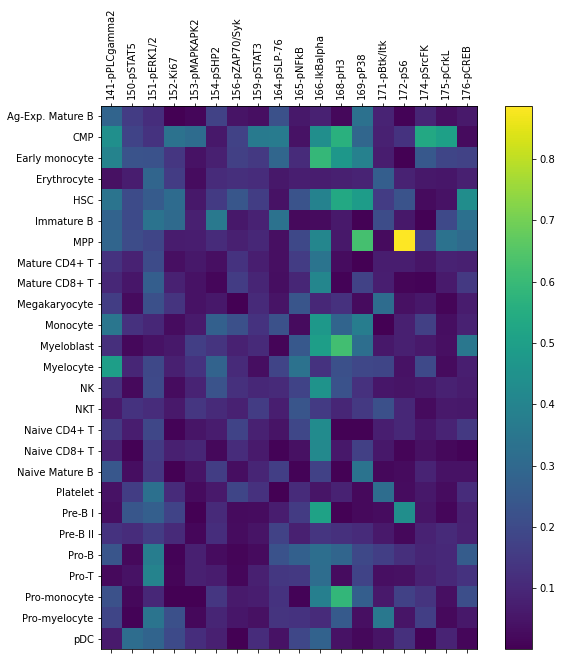

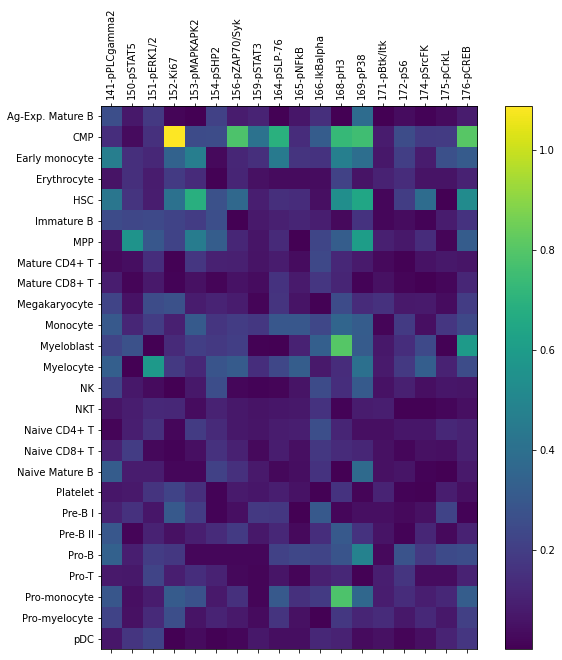

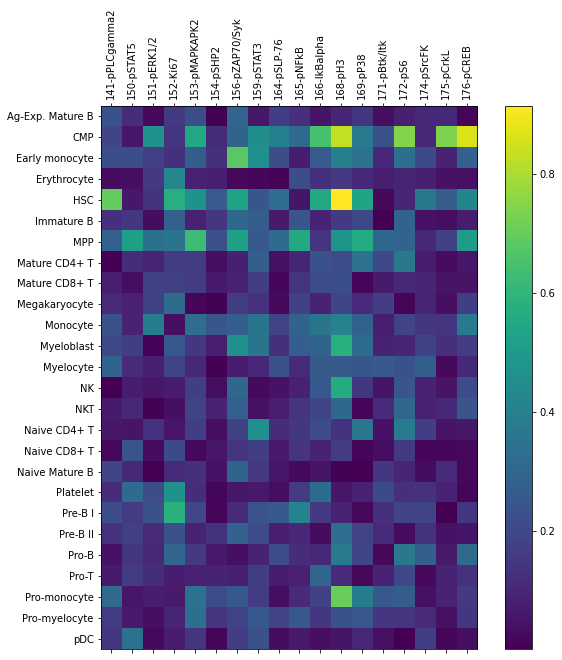

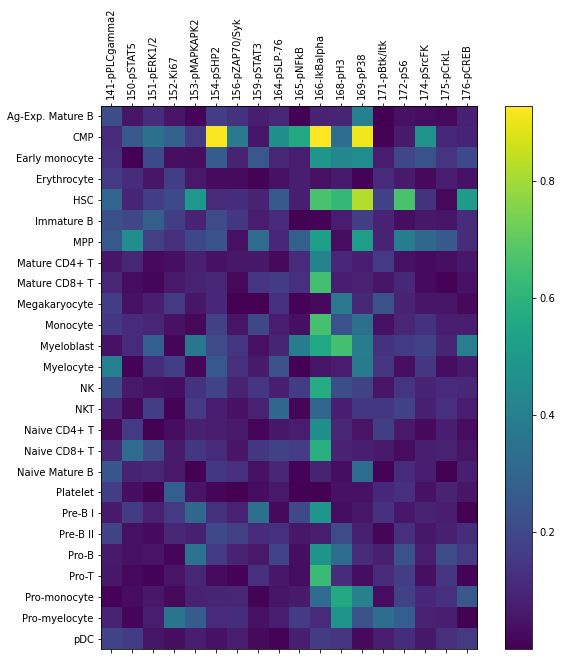

In [47]:
signals = [
     '141-pPLCgamma2',
     '150-pSTAT5',
     '151-pERK1/2',
     '152-Ki67',
     '153-pMAPKAPK2',
     '154-pSHP2',
     '156-pZAP70/Syk',
     '159-pSTAT3',
     '164-pSLP-76',
     '165-pNFkB',
     '166-IkBalpha',
     '168-pH3',
     '169-pP38',
     '171-pBtk/Itk',
     '172-pS6',
     '174-pSrcFK',
     '175-pCrkL',
     '176-pCREB',
]

pd.set_option('display.max_columns', None)  
for i in range(5):
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111)
    cax = ax.matshow(tnfa_gs2[i][signals], interpolation='nearest')
    fig.colorbar(cax)
    ax.set_xticks(np.arange(0,len(signals)))
    ax.set_xticklabels(signals, rotation='vertical')
    ax.set_yticks(np.arange(0,len(cell_types)))
    ax.set_yticklabels(cell_types)
    plt.show()

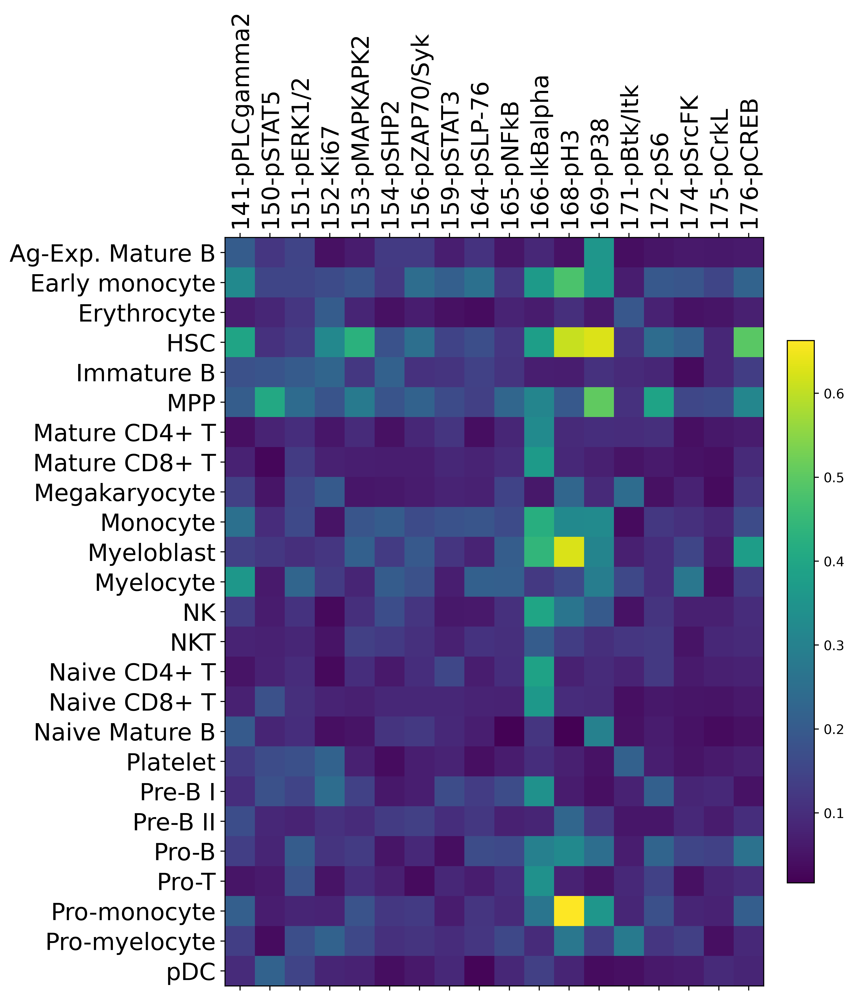

In [50]:
A = []
for i in range(5):
    a = tnfa_gs2[i][signals]
    A.append(a)
A = np.array(A)
mean_sig = np.mean(A, axis=0)
mean_sig = np.delete(mean_sig, (1), axis=0)

fig = plt.figure(dpi=500,figsize=(8,12))
ax = fig.add_subplot(111)
cax = ax.matshow(mean_sig, interpolation='nearest')
fig.colorbar(cax,fraction=0.046, pad=0.04)
ax.set_xticks(np.arange(0,len(signals)))
ax.set_xticklabels(signals, rotation='vertical',fontsize=18)
ax.set_yticks(np.arange(0,len(cell_types)-1))
ax.set_yticklabels(np.delete(np.unique(gmscsf_names),1),fontsize=18)

plt.show()

In [ ]:
# for i in np.unique(labels):
#     print(cell_types[i-1])

#     cond1 = meta[:,0]==i
#     cond2 = meta[:,1]==0
#     cond3 = meta[:,1]==1

#     cond_d1 = cond1*cond2
#     cond_d2 = cond1*cond3

#     plt.figure(figsize=(6,6))
#     plt.scatter(embedding[:,0],embedding[:,1],c=cond_d1,s=1,alpha=0.3)
#     plt.show()
#     plt.figure(figsize=(6,6))
#     plt.scatter(embedding[:,0],embedding[:,1],c=cond_d2,s=1,alpha=0.3)
#     plt.show()
    
#     plt.figure(figsize=(6,6))
#     plt.scatter(embedding[cond_d1,0],embedding[cond_d1,1],s=10,alpha=1)
#     plt.show()
#     plt.figure(figsize=(6,6))
#     plt.scatter(embedding[cond_d2,0],embedding[cond_d2,1],s=10,alpha=1)
#     plt.show()
#     print('**************************************************************************')

In [ ]:
# combined_adata = sc.AnnData(combined_df)
# sc.pp.neighbors(combined_adata,n_neighbors=20, n_pcs=40)
# sc.tl.leiden(combined_adata,resolution=1)


# leiden = list(map(int, list(combined_adata.obs['leiden'])))

# plt.figure(figsize=(8,8))
# plt.scatter(embedding[:,0],embedding[:,1],c=leiden,s=1,cmap='tab20c')

# # compare leiden vs original_labels
# npy_leiden = np.array(leiden)
# npy_original = np.array(combined_labels)
# cell_origin = []
# types = [] 
# for i in range(len(np.unique(npy_leiden))):
#     idx = np.where(npy_leiden==i)[0]
#     print(i)
#     tmp_originals = npy_original[idx]
#     tmp_originals = tmp_originals[tmp_originals > -1]
#     m = plt.hist(tmp_originals,bins=range(1,27))
#     plt.show()
#     cell_origin.append(np.around(100 * (m[0]/np.sum(m[0])),2))
#     print(np.array(cell_types)[np.argsort(-100 * (m[0]/np.sum(m[0])))][:3])
#     types.append(np.array(cell_types)[np.argsort(-100 * (m[0]/np.sum(m[0])))][0])
#     print('---------------------------------------------')

In [ ]:
# types

In [ ]:
# normals = []
# for normal_file in normal_files:   
#     normals.append(pd.read_csv(normal_file,sep="\t", header=0))

# df1=pd.concat(normals)
# df2 = pd.read_csv(normal_file,sep="\t", header=0)

# df1 = df1.sample(frac=0.05,random_state=0)
# df2 = df2.sample(frac=0.2,random_state=0)
# print(df1.shape, df2.shape)

# label1 = list(df1['cell_type_index'])
# label2 = list(df2['cell_type_index'])

# combined_labels = label1 + label2
# batch_info = [0 for i in range(len(label1))] + [1 for i in range(len(label2))]

# meta = np.array([combined_labels,batch_info]).T

# cell_types = ['Ag-Experienced Mature B',
#        'CMP', 'Early monocyte', 'Erythrocyte', 'HSC', 'Immature B', 'MPP',
#        'Mature CD4+ T', 'Mature CD8+ T', 'Megakaryocyte', 'Monocyte',
#        'Myeloblast', 'Myelocyte', 'NK', 'NKT', 'Na?ve CD4+ T', 'Na?ve CD8+ T',
#        'Na?ve Mature B', 'Platelet', 'Pre-B I', 'Pre-B II', 'Pro-B', 'Pro-T',
#        'Pro-monocyte', 'Pro-myelocyte', 'pDC']

# markers = [ '110-CD3',
#  '110_114-CD3',
#  '111-CD3',
#  '112-CD3',
#  '114-CD3',
#  '115-CD45',
#  '139-CD45RA',
#  '141-pPLCgamma2',
#  '142-CD19',
#  '144-CD11b',
#  '145-CD4',
#  '146-CD8',
#  '147-CD20',
#  '148-CD34',
#  '150-pSTAT5',
#  '151-pERK1/2',
#  '152-Ki67',
#  '153-pMAPKAPK2',
#  '154-pSHP2',
#  '156-pZAP70/Syk',
#  '158-CD33',
#  '159-pSTAT3',
#  '160-CD123',
#  '164-pSLP-76',
#  '165-pNFkB',
#  '166-IkBalpha',
#  '167-CD38',
#  '168-pH3',
#  '169-pP38',
#  '170-CD90',
#  '171-pBtk/Itk',
#  '172-pS6',
#  '174-pSrcFK',
#  '175-pCrkL',
#  '176-pCREB',
#  '191-DNA',
#  '193-DNA']

# #CD: 3, 4, 8, 11b, 19, 20, 33, 34, 38, 45, 45RA, 90, 123

# df1_linege = df1[markers]
# df2_linege = df2[markers]

# print(df1_linege.shape, df2_linege.shape)

# combined_df = pd.concat([df1_linege, df2_linege])
# print(combined_df.shape, meta.shape)

# pca = PCA(n_components=10)
# pca_emb = pca.fit_transform(combined_df)

# reducer = umap.UMAP(random_state=42)
# embedding = reducer.fit_transform(pca_emb)
# #Scaling so that min and max alwasys be 0 and 10 for both x and y axis
# scaler = MinMaxScaler()
# embedding = 10*scaler.fit_transform(embedding)

# plt.figure(figsize=(8,8))
# plt.scatter(embedding[:,0],embedding[:,1],c=meta[:,1],s=1)

# def get_cmap(n, name='gist_ncar'):
#     '''Returns a function that maps each index in 0, 1, ..., n-1 to a distinct 
#     RGB color; the keyword argument name must be a standard mpl colormap name.'''
#     return plt.cm.get_cmap(name, n)

# cmap = get_cmap(len(np.unique(meta[:,0])))
# cmap

# plt.figure(figsize=(8,8))
# plt.scatter(embedding[:,0],embedding[:,1],c=meta[:,0],s=10,cmap=cmap)

# for i in np.unique(labels):
#     print(cell_types[i-1])

#     cond1 = meta[:,0]==i
#     cond2 = meta[:,1]==0
#     cond3 = meta[:,1]==1

#     cond_d1 = cond1*cond2
#     cond_d2 = cond1*cond3

#     plt.figure(figsize=(6,6))
#     plt.scatter(embedding[:,0],embedding[:,1],c=cond_d1,s=1,alpha=0.3)
#     plt.show()
#     plt.figure(figsize=(6,6))
#     plt.scatter(embedding[:,0],embedding[:,1],c=cond_d2,s=1,alpha=0.3)
#     plt.show()
    
#     plt.figure(figsize=(6,6))
#     plt.scatter(embedding[cond_d1,0],embedding[cond_d1,1],s=10,alpha=1)
#     plt.show()
#     plt.figure(figsize=(6,6))
#     plt.scatter(embedding[cond_d2,0],embedding[cond_d2,1],s=10,alpha=1)
#     plt.show()
#     print('**************************************************************************')

# def eval_score_sum(vector1,vector2):
#     diff = np.abs(vector1 - vector2)
#     score = np.around(np.sum(diff),3)
#     return score


# batch1 = df1[markers]
# batch2 = df2[markers]
# y_1 = label1
# y_2 = label2
# emb1 = embedding[meta[:,1]==0,:]
# emb2 = embedding[meta[:,1]==1,:]

# print(batch1.shape, batch2.shape, len(y_1), len(y_2), emb1.shape, emb2.shape)

# Combined = np.vstack((batch1, batch2))
# embedding = np.vstack((emb1, emb2))
# # Initial Visualization per label
# seurat_labels = list(y_1) + list(y_2)
# unq_labels = np.unique(seurat_labels)
# fig, axs = plt.subplots(5,6, figsize=(10, 10), facecolor='w', edgecolor='k')
# fig.subplots_adjust(hspace = .5, wspace=.001)

# axs = axs.ravel()

# for label in unq_labels:
#     tmp_ctrl=emb1[y_1 == label,:]
#     tmp_stim=emb2[y_2 == label,:]

#     axs[label-1].scatter(tmp_ctrl[:,0],tmp_ctrl[:,1],s=5,alpha=0.6)
#     axs[label-1].scatter(tmp_stim[:,0],tmp_stim[:,1],s=5,alpha=0.6,c='r')
#     axs[label-1].set_title('label {}'.format(label))

# # XGBoost
# X = Combined
# y0 = embedding[:,0]

# model_x = XGBRegressor()
# model_x.fit(X, y0)

# predicted_x = model_x.predict(X)

# y1 = embedding[:,1]

# model_y = XGBRegressor()
# model_y.fit(X, y1)
# predicted_y = model_y.predict(X)

# plt.figure(figsize=(3,3))
# plt.scatter(y0,y1,s=10)
# plt.scatter(predicted_x,predicted_y,c='r',s=5)

# # SHAP
# explainer = shap.TreeExplainer(model_x,X)
# shap_value_x = explainer.shap_values(X)
# explainer = shap.TreeExplainer(model_y,X)
# shap_value_y = explainer.shap_values(X)

# comb_shap_values = np.sqrt((shap_value_x**2 + shap_value_y**2))
# batch1_shap = comb_shap_values[:len(y_1),:]
# batch2_shap = comb_shap_values[len(y_1):,:]

# # Analysis
# cell_num = []
# for label in unq_labels:
#     a=np.sum(y_1 == label)
#     b=np.sum(y_2 == label)
#     cell_num.append(min(a,b))

# cell_orders = unq_labels[np.argsort(-1*np.array(cell_num))]

# # Cell-type variation
# fig, axs = plt.subplots(5,6, figsize=(15, 15), facecolor='w', edgecolor='k')
# fig.subplots_adjust(hspace = .5, wspace=.001)
# axs = axs.ravel()
# scores_stunst1 = []
# for ct,label in enumerate(cell_orders):
#     tmp_batch1_shap = batch1_shap[y_1 == label, :]
#     tmp_batch2_shap = batch2_shap[y_2 == label, :]

#     tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
#     tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)

#     score = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
#     scores_stunst1.append(score)
#     cap = max(np.max(tmp_mean_feature1), np.max(tmp_mean_feature2)) + 0.3
#     diag = np.linspace(0,cap)
#     axs[ct].scatter(tmp_mean_feature1,tmp_mean_feature2)
#     axs[ct].plot(diag,diag)
#     axs[ct].set_xlim(0,cap)
#     axs[ct].set_ylim(0,cap)
#     axs[ct].set_title(cell_types[label-1]+ '-'  + str(score))

# # Random Variation
# comb_label = list(y_1)+list(y_2)
# LABEL_SCORES_COMB = []
# for label in tqdm(cell_orders):
#     label_score = []
#     for i in range(1000):

#         tmp_batch = comb_shap_values[np.array(comb_label) == label, :]

#         tmp_batch1_shap = tmp_batch[np.random.randint(0, tmp_batch.shape[0],int(tmp_batch.shape[0]/2)),:]
#         tmp_batch2_shap = tmp_batch[np.random.randint(0, tmp_batch.shape[0],int(tmp_batch.shape[0]/2)),:]

#         tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
#         tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)

#         score = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
#         label_score.append(score)
#     LABEL_SCORES_COMB.append(label_score)



# # Showing the variation with cell-specific scores 
# ct = 0
# fig, axs = plt.subplots(5,6, figsize=(20, 20), facecolor='w', edgecolor='k')
# fig.subplots_adjust(hspace = .5, wspace=.001)
# axs = axs.ravel()

# for scores in LABEL_SCORES_COMB:
#     axs[ct].hist(scores)
#     tmp = scores + [scores_stunst1[ct]]
#     zscores = stats.zscore(tmp)
#     p_values = 1 - scipy.special.ndtr(zscores)
#     axs[ct].set_title('{} \n p_val:{}'.format(cell_types[cell_orders[ct]-1],p_values[-1]))
#     axs[ct].axvline(scores_stunst1[ct], color='k', linestyle='dashed', linewidth=1)
#     ct += 1

# mean_perms = []
# for scores in LABEL_SCORES_COMB:
#     mean_perms.append(np.nanmean(scores))

# # Cell-type variation random-perm corrected
# fig, axs = plt.subplots(5,6, figsize=(20, 20), facecolor='w', edgecolor='k')
# fig.subplots_adjust(hspace = .5, wspace=.001)
# axs = axs.ravel()
# scores_stunst1 = []
# for ct,label in enumerate(cell_orders):
#     tmp_batch1_shap = batch1_shap[y_1 == label, :]
#     tmp_batch2_shap = batch2_shap[y_2 == label, :]

#     tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
#     tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)

#     score = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
#     scores_stunst1.append(score)
#     cap = max(np.max(tmp_mean_feature1), np.max(tmp_mean_feature2)) + 0.3
#     diag = np.linspace(0,cap)
#     axs[ct].scatter(tmp_mean_feature1,tmp_mean_feature2)
#     axs[ct].plot(diag,diag)
#     axs[ct].set_xlim(0,cap)
#     axs[ct].set_ylim(0,cap)
#     axs[ct].set_title(cell_types[label-1]+ '-'  + str(np.round(score-mean_perms[ct],2)))

# # Featuer Scores 
# feature_names = markers
# scores = []
# gene_ranks = []
# gene_ranks_pd = []
# gene_ranks_scores = []
# GENE_SCORES = []
# for label in unq_labels:
#     tmp_batch1_shap = batch1_shap[y_1 == label, :]
#     tmp_batch2_shap = batch2_shap[y_2 == label, :]
#     tmp_combined_shap = np.vstack((tmp_batch1_shap,tmp_batch2_shap))

#     tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
#     tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)
#     diag = np.linspace(0,np.max(np.concatenate([tmp_mean_feature1, tmp_mean_feature2])))

#     score_by_feat = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
#     scores.append(score_by_feat)
#     gene_scores = np.abs(tmp_mean_feature1 - tmp_mean_feature2)
#     GENE_SCORES.append(gene_scores)
#     gene_ranks_pd.append(np.array(feature_names)[np.argsort(-1*(np.abs(tmp_mean_feature1 - tmp_mean_feature2)))])
#     gene_ranks_scores.append(gene_scores[np.argsort(-1*(np.abs(tmp_mean_feature1 - tmp_mean_feature2)))])
#     gene_ranks.append(np.array(feature_names)[np.argsort(np.abs(tmp_mean_feature1 - tmp_mean_feature2))])

# GS = pd.DataFrame(GENE_SCORES,columns=feature_names)
# GS.index = cell_types
# GS

# gene_meta_ranks = []
# for gene in feature_names:
#     gene_loc = []
#     for rank in gene_ranks:
#         gene_loc.append(np.where(rank == gene)[0][0])
#     gene_meta_ranks.append(gene_loc)
# gene_meta_ranks = np.array(gene_meta_ranks)

# csv = []
# for i in range(len(gene_ranks_pd)):
#     csv.append(gene_ranks_pd[i])
#     csv.append(gene_ranks_scores[i])

# column_names = []
# for i in range(len(unq_labels)):
#     column_names.append('cell {}'.format(i))
#     column_names.append('cell {} - score'.format(i))

# diff_genes = pd.DataFrame(np.array(csv).T,columns=column_names)
# print(diff_genes)
# plt.show()

In [ ]:
# df1=pd.concat(normals)
# df2 = pd.read_csv(normal_file,sep="\t", header=0)

# df1 = df1.sample(frac=0.05,random_state=0)
# df2 = df2.sample(frac=0.2,random_state=0)
# print(df1.shape, df2.shape)

# label1 = list(df1['cell_type_index'])
# label2 = list(df2['cell_type_index'])

# combined_labels = label1 + label2
# batch_info = [0 for i in range(len(label1))] + [1 for i in range(len(label2))]

# meta = np.array([combined_labels,batch_info]).T

# cell_types = ['Ag-Experienced Mature B',
#        'CMP', 'Early monocyte', 'Erythrocyte', 'HSC', 'Immature B', 'MPP',
#        'Mature CD4+ T', 'Mature CD8+ T', 'Megakaryocyte', 'Monocyte',
#        'Myeloblast', 'Myelocyte', 'NK', 'NKT', 'Na?ve CD4+ T', 'Na?ve CD8+ T',
#        'Na?ve Mature B', 'Platelet', 'Pre-B I', 'Pre-B II', 'Pro-B', 'Pro-T',
#        'Pro-monocyte', 'Pro-myelocyte', 'pDC']

# markers = [ '110-CD3',
#  '110_114-CD3',
#  '111-CD3',
#  '112-CD3',
#  '114-CD3',
#  '115-CD45',
#  '139-CD45RA',
#  '141-pPLCgamma2',
#  '142-CD19',
#  '144-CD11b',
#  '145-CD4',
#  '146-CD8',
#  '147-CD20',
#  '148-CD34',
#  '150-pSTAT5',
#  '151-pERK1/2',
#  '152-Ki67',
#  '153-pMAPKAPK2',
#  '154-pSHP2',
#  '156-pZAP70/Syk',
#  '158-CD33',
#  '159-pSTAT3',
#  '160-CD123',
#  '164-pSLP-76',
#  '165-pNFkB',
#  '166-IkBalpha',
#  '167-CD38',
#  '168-pH3',
#  '169-pP38',
#  '170-CD90',
#  '171-pBtk/Itk',
#  '172-pS6',
#  '174-pSrcFK',
#  '175-pCrkL',
#  '176-pCREB',
#  '191-DNA',
#  '193-DNA']

# #CD: 3, 4, 8, 11b, 19, 20, 33, 34, 38, 45, 45RA, 90, 123

# df1_linege = df1[markers]
# df2_linege = df2[markers]

# print(df1_linege.shape, df2_linege.shape)

# combined_df = pd.concat([df1_linege, df2_linege])
# print(combined_df.shape, meta.shape)

# pca = PCA(n_components=10)
# pca_emb = pca.fit_transform(combined_df)

# reducer = umap.UMAP(random_state=42)
# embedding = reducer.fit_transform(pca_emb)
# #Scaling so that min and max alwasys be 0 and 10 for both x and y axis
# scaler = MinMaxScaler()
# embedding = 10*scaler.fit_transform(embedding)

# combined_adata = sc.AnnData(combined_df)
# sc.pp.neighbors(combined_adata,n_neighbors=20, n_pcs=40)
# sc.tl.leiden(combined_adata,resolution=1)

# leiden = list(map(int, list(combined_adata.obs['leiden'])))

# plt.figure(figsize=(8,8))
# plt.scatter(embedding[:,0],embedding[:,1],c=leiden,s=1,cmap='tab20c')

# # compare leiden vs original_labels
# npy_leiden = np.array(leiden)
# npy_original = np.array(combined_labels)
# cell_origin = []
# types = [] 
# for i in range(len(np.unique(npy_leiden))):
#     idx = np.where(npy_leiden==i)[0]
#     tmp_originals = npy_original[idx]
#     tmp_originals = tmp_originals[tmp_originals > -1]
#     m = plt.hist(tmp_originals,bins=range(1,27))
#     plt.close()
#     cell_origin.append(np.around(100 * (m[0]/np.sum(m[0])),2))
#     types.append(np.array(cell_types)[np.argsort(-100 * (m[0]/np.sum(m[0])))][0])
    
    
# def get_cmap(n, name='gist_ncar'):
#     '''Returns a function that maps each index in 0, 1, ..., n-1 to a distinct 
#     RGB color; the keyword argument name must be a standard mpl colormap name.'''
#     return plt.cm.get_cmap(name, n)

In [ ]:
# meta = np.array([leiden,batch_info]).T
# for i in np.unique(npy_leiden):
#     print(types[i])

#     cond1 = meta[:,0]==i
#     cond2 = meta[:,1]==0
#     cond3 = meta[:,1]==1

#     cond_d1 = cond1*cond2
#     cond_d2 = cond1*cond3

#     plt.figure(figsize=(6,6))
#     plt.scatter(embedding[:,0],embedding[:,1],c=cond_d1,s=1,alpha=0.3)
#     plt.show()
#     plt.figure(figsize=(6,6))
#     plt.scatter(embedding[:,0],embedding[:,1],c=cond_d2,s=1,alpha=0.3)
#     plt.show()
    
#     plt.figure(figsize=(6,6))
#     plt.scatter(embedding[cond_d1,0],embedding[cond_d1,1],s=10,alpha=1)
#     plt.show()
#     plt.figure(figsize=(6,6))
#     plt.scatter(embedding[cond_d2,0],embedding[cond_d2,1],s=10,alpha=1)
#     plt.show()
#     print('**************************************************************************')

# def eval_score_sum(vector1,vector2):
#     diff = np.abs(vector1 - vector2)
#     score = np.around(np.sum(diff),3)
#     return score


# batch1 = df1[markers]
# batch2 = df2[markers]
# y_1 = leiden[:len(batch1)]
# y_2 = leiden[len(batch1):]
# emb1 = embedding[meta[:,1]==0,:]
# emb2 = embedding[meta[:,1]==1,:]

# print(batch1.shape, batch2.shape, len(y_1), len(y_2), emb1.shape, emb2.shape)

# Combined = np.vstack((batch1, batch2))
# embedding = np.vstack((emb1, emb2))
# # Initial Visualization per label
# seurat_labels = list(y_1) + list(y_2)
# unq_labels = np.unique(seurat_labels)
# fig, axs = plt.subplots(5,6, figsize=(10, 10), facecolor='w', edgecolor='k')
# fig.subplots_adjust(hspace = .5, wspace=.001)

# axs = axs.ravel()

# for label in unq_labels:
#     tmp_ctrl=emb1[y_1 == label,:]
#     tmp_stim=emb2[y_2 == label,:]

#     axs[label-1].scatter(tmp_ctrl[:,0],tmp_ctrl[:,1],s=5,alpha=0.6)
#     axs[label-1].scatter(tmp_stim[:,0],tmp_stim[:,1],s=5,alpha=0.6,c='r')
#     axs[label-1].set_title('label {}'.format(label))

# # XGBoost
# X = Combined
# y0 = embedding[:,0]

# model_x = XGBRegressor()
# model_x.fit(X, y0)

# predicted_x = model_x.predict(X)

# y1 = embedding[:,1]

# model_y = XGBRegressor()
# model_y.fit(X, y1)
# predicted_y = model_y.predict(X)

# plt.figure(figsize=(3,3))
# plt.scatter(y0,y1,s=10)
# plt.scatter(predicted_x,predicted_y,c='r',s=5)

# # SHAP
# explainer = shap.TreeExplainer(model_x,X)
# shap_value_x = explainer.shap_values(X)
# explainer = shap.TreeExplainer(model_y,X)
# shap_value_y = explainer.shap_values(X)

# comb_shap_values = np.sqrt((shap_value_x**2 + shap_value_y**2))
# batch1_shap = comb_shap_values[:len(y_1),:]
# batch2_shap = comb_shap_values[len(y_1):,:]

# # Analysis
# cell_num = []
# for label in unq_labels:
#     a=np.sum(y_1 == label)
#     b=np.sum(y_2 == label)
#     cell_num.append(min(a,b))

# cell_orders = unq_labels[np.argsort(-1*np.array(cell_num))]

# # Cell-type variation
# fig, axs = plt.subplots(5,6, figsize=(15, 15), facecolor='w', edgecolor='k')
# fig.subplots_adjust(hspace = .5, wspace=.001)
# axs = axs.ravel()
# scores_stunst1 = []
# for ct,label in enumerate(cell_orders):
#     tmp_batch1_shap = batch1_shap[y_1 == label, :]
#     tmp_batch2_shap = batch2_shap[y_2 == label, :]

#     tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
#     tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)

#     score = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
#     scores_stunst1.append(score)
#     cap = max(np.max(tmp_mean_feature1), np.max(tmp_mean_feature2)) + 0.3
#     diag = np.linspace(0,cap)
#     axs[ct].scatter(tmp_mean_feature1,tmp_mean_feature2)
#     axs[ct].plot(diag,diag)
#     axs[ct].set_xlim(0,cap)
#     axs[ct].set_ylim(0,cap)
#     axs[ct].set_title(types[label]+ '-'  + str(score))

# # Random Variation
# comb_label = list(y_1)+list(y_2)
# LABEL_SCORES_COMB = []
# for label in tqdm(cell_orders):
#     label_score = []
#     for i in range(1000):

#         tmp_batch = comb_shap_values[np.array(comb_label) == label, :]

#         tmp_batch1_shap = tmp_batch[np.random.randint(0, tmp_batch.shape[0],int(tmp_batch.shape[0]/2)),:]
#         tmp_batch2_shap = tmp_batch[np.random.randint(0, tmp_batch.shape[0],int(tmp_batch.shape[0]/2)),:]

#         tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
#         tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)

#         score = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
#         label_score.append(score)
#     LABEL_SCORES_COMB.append(label_score)



# # Showing the variation with cell-specific scores 
# ct = 0
# fig, axs = plt.subplots(5,6, figsize=(20, 20), facecolor='w', edgecolor='k')
# fig.subplots_adjust(hspace = .5, wspace=.001)
# axs = axs.ravel()

# for scores in LABEL_SCORES_COMB:
#     axs[ct].hist(scores)
#     tmp = scores + [scores_stunst1[ct]]
#     zscores = stats.zscore(tmp)
#     p_values = 1 - scipy.special.ndtr(zscores)
#     axs[ct].set_title('{} \n p_val:{}'.format(types[cell_orders[ct]],p_values[-1]))
#     axs[ct].axvline(scores_stunst1[ct], color='k', linestyle='dashed', linewidth=1)
#     ct += 1

# mean_perms = []
# for scores in LABEL_SCORES_COMB:
#     mean_perms.append(np.nanmean(scores))

# # Cell-type variation random-perm corrected
# fig, axs = plt.subplots(5,6, figsize=(20, 20), facecolor='w', edgecolor='k')
# fig.subplots_adjust(hspace = .5, wspace=.001)
# axs = axs.ravel()
# scores_stunst1 = []
# for ct,label in enumerate(cell_orders):
#     tmp_batch1_shap = batch1_shap[y_1 == label, :]
#     tmp_batch2_shap = batch2_shap[y_2 == label, :]

#     tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
#     tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)

#     score = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
#     scores_stunst1.append(score)
#     cap = max(np.max(tmp_mean_feature1), np.max(tmp_mean_feature2)) + 0.3
#     diag = np.linspace(0,cap)
#     axs[ct].scatter(tmp_mean_feature1,tmp_mean_feature2)
#     axs[ct].plot(diag,diag)
#     axs[ct].set_xlim(0,cap)
#     axs[ct].set_ylim(0,cap)
#     axs[ct].set_title(types[label]+ '-'  + str(np.round(score-mean_perms[ct],2)))

# # Featuer Scores 
# feature_names = markers
# scores = []
# gene_ranks = []
# gene_ranks_pd = []
# gene_ranks_scores = []
# GENE_SCORES = []
# for label in unq_labels:
#     tmp_batch1_shap = batch1_shap[y_1 == label, :]
#     tmp_batch2_shap = batch2_shap[y_2 == label, :]
#     tmp_combined_shap = np.vstack((tmp_batch1_shap,tmp_batch2_shap))

#     tmp_mean_feature1 = np.mean(tmp_batch1_shap,axis=0)
#     tmp_mean_feature2 = np.mean(tmp_batch2_shap,axis=0)
#     diag = np.linspace(0,np.max(np.concatenate([tmp_mean_feature1, tmp_mean_feature2])))

#     score_by_feat = eval_score_sum(tmp_mean_feature1, tmp_mean_feature2)
#     scores.append(score_by_feat)
#     gene_scores = np.abs(tmp_mean_feature1 - tmp_mean_feature2)
#     GENE_SCORES.append(gene_scores)
#     gene_ranks_pd.append(np.array(feature_names)[np.argsort(-1*(np.abs(tmp_mean_feature1 - tmp_mean_feature2)))])
#     gene_ranks_scores.append(gene_scores[np.argsort(-1*(np.abs(tmp_mean_feature1 - tmp_mean_feature2)))])
#     gene_ranks.append(np.array(feature_names)[np.argsort(np.abs(tmp_mean_feature1 - tmp_mean_feature2))])

# GS = pd.DataFrame(GENE_SCORES,columns=feature_names)
# GS.index = cell_types
# GS

# gene_meta_ranks = []
# for gene in feature_names:
#     gene_loc = []
#     for rank in gene_ranks:
#         gene_loc.append(np.where(rank == gene)[0][0])
#     gene_meta_ranks.append(gene_loc)
# gene_meta_ranks = np.array(gene_meta_ranks)

# csv = []
# for i in range(len(gene_ranks_pd)):
#     csv.append(gene_ranks_pd[i])
#     csv.append(gene_ranks_scores[i])

# column_names = []
# for i in range(len(unq_labels)):
#     column_names.append('cell {}'.format(i))
#     column_names.append('cell {} - score'.format(i))

# diff_genes = pd.DataFrame(np.array(csv).T,columns=column_names)
# print(diff_genes)
# plt.show()